<a href="https://colab.research.google.com/github/RobSpiewakowski/Public_repository/blob/main/My_first_neural_network_with_TensorFlow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this task, we are going to create a neural network, to clasify images of clothing, like sneakers and shirts.

So it's a simple image classification model...

# 1. Import modules and load data:

In [1]:
# Modules:
import tensorflow as tf
import numpy as np
import plotly.express as px
from tensorflow.keras.datasets import fashion_mnist
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
# Load data:
data = fashion_mnist

(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()

# Store class label names:
label_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

# Shape of datasets:
print('Train images: ', train_images.shape, 'Train labels: ', train_labels.shape, '\n',
      'Test images: ', test_images.shape, 'Test labels: ', test_labels.shape)

4431872/4422102 [==============================] - 0s 0us/step
Train images:  (60000, 28, 28) Train labels:  (60000,) 
 Test images:  (10000, 28, 28) Test labels:  (10000,)


# 2. Data preprocessing:

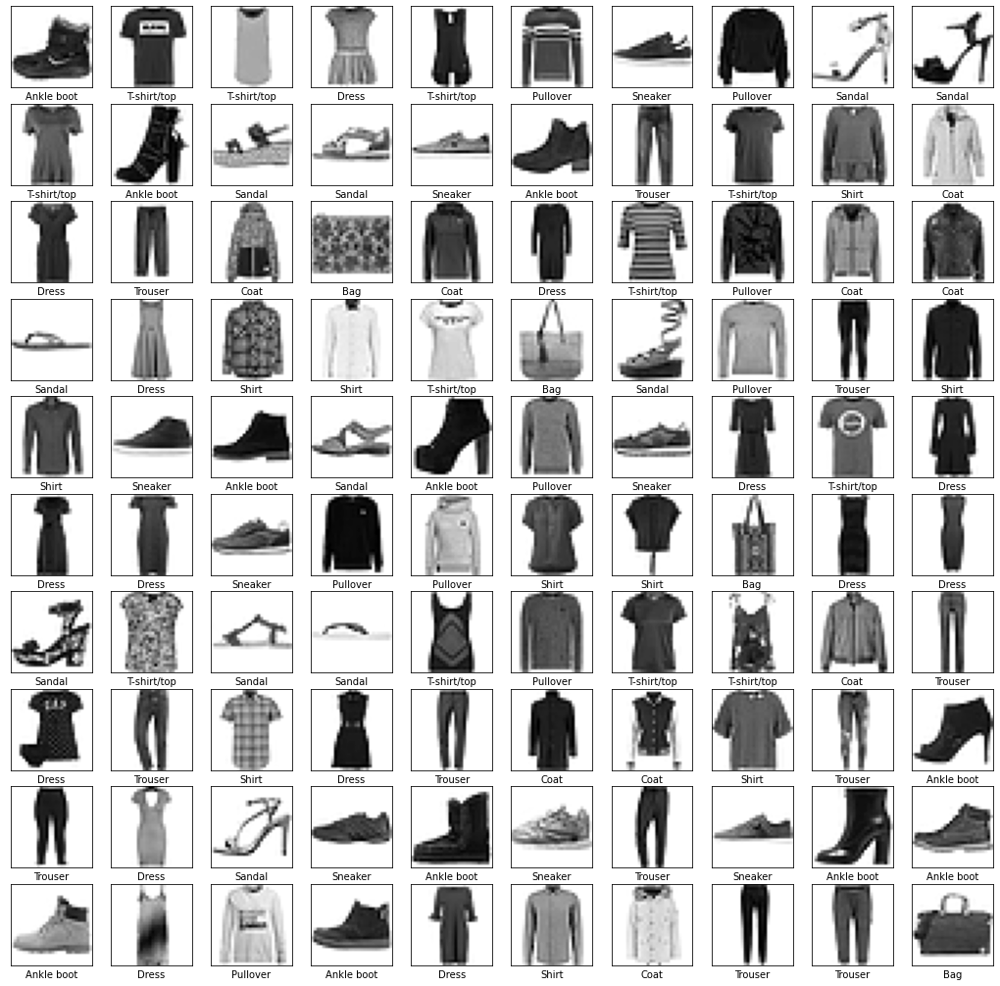

In [6]:
# Show sample images:
plt.figure(figsize = (18, 18))
for i in range(100):
  plt.subplot(10, 10, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(train_images[i], cmap = plt.cm.binary)
  plt.xlabel(label_names[train_labels[i]])
plt.show()

# Building a neural network (model):

In [7]:
# Create a model:
model = tf.keras.Sequential([tf.keras.layers.Flatten(input_shape = (28, 28)),     # Here, network transforms the images into 28x28 arrays, no learning here. Just transform.
                             tf.keras.layers.Dense(128, activation = 'relu'),     # First layer: contains 128 neurons, activation function is 'relu'
                             tf.keras.layers.Dense(10)])                          # Second layer: returns a logits, 10 element array with classification an image to one of 10 classes.

# Compile a model:
model.compile(optimizer = 'adam',                                                         # This is how the model is updated based on the data it sees and it's loss function
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),   # It measures, how accurate model is during training.
              metrics = ['accuracy'])                                                     # The measure of model.

# Train a model:
model.fit(train_images, train_labels, epochs = 10)            # Epocs - how many times model is trained.

Epoch 1/10
1875/1875 [==============================] - 4s 2ms/step - loss: 3.0314 - accuracy: 0.6554
Epoch 2/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.7890 - accuracy: 0.7036
Epoch 3/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.6710 - accuracy: 0.7374
Epoch 4/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.6357 - accuracy: 0.7577
Epoch 5/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.6013 - accuracy: 0.7732
Epoch 6/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.5909 - accuracy: 0.7802
Epoch 7/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.5877 - accuracy: 0.7838
Epoch 8/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.5809 - accuracy: 0.7889
Epoch 9/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.5647 - accuracy: 0.7926
Epoch 10/10
1875/1875 [==============================] - 3s 2ms/step - loss: 0.562

In [8]:
# Evaluate Accuracy:
test_loss, test_acc = model.evaluate(test_images, test_labels, verbose = 2)

print(f'Test accuracy = {test_acc}')

313/313 - 0s - loss: 0.6595 - accuracy: 0.7637
Test accuracy = 0.763700008392334


# Make predictions:

In [9]:
# Prediction with probability model:
# The output is an array od 10 numbers, that represents model's 'confidence' that image represents each of 10 articles of clothing.
probability_model = tf.keras.Sequential([model,
                                         tf.keras.layers.Softmax()])

pred_probability = probability_model.predict(test_images)

print(pred_probability[0])

[4.7777138e-20 3.3170116e-11 0.0000000e+00 6.6153910e-14 0.0000000e+00
 3.6015186e-02 8.3971333e-32 6.0767081e-02 1.0038629e-17 9.0321779e-01]


In [10]:
# The most probably value:
pred_labels = []
for i in range(pred_probability.shape[0]):
  label = np.argmax(pred_probability[i])
  pred_labels.append(label)

print(len(pred_labels))
print(f'The most probably value for 0-th image is {pred_labels[0]}')

10000
The most probably value for 0-th image is 9


# Verify predictions:

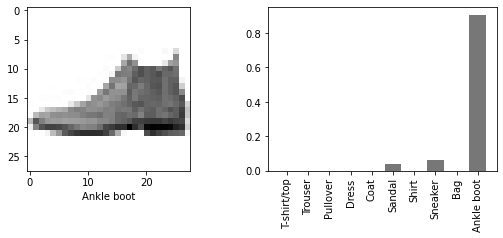

True
-------------------------------------------------


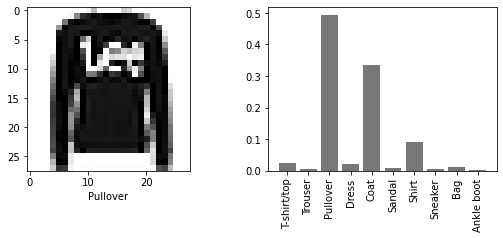

True
-------------------------------------------------


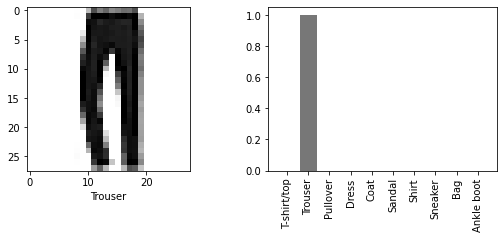

True
-------------------------------------------------


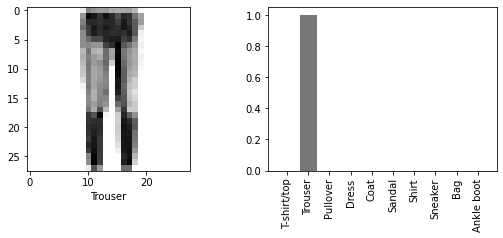

True
-------------------------------------------------


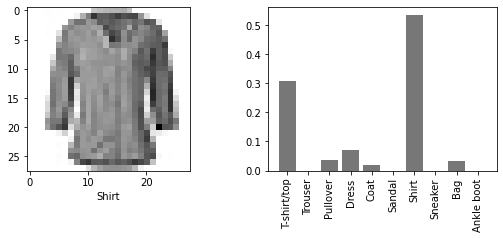

True
-------------------------------------------------


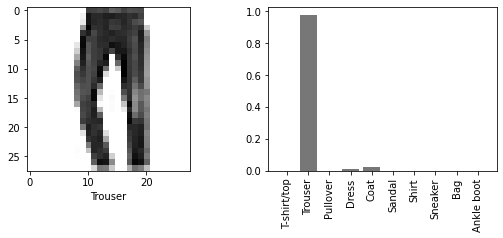

True
-------------------------------------------------


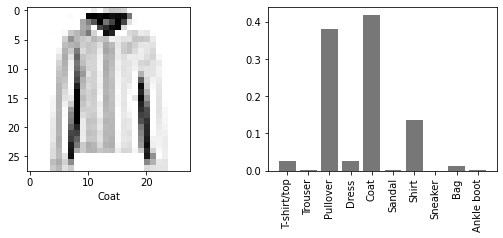

True
-------------------------------------------------


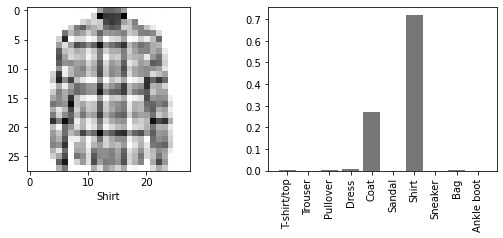

True
-------------------------------------------------


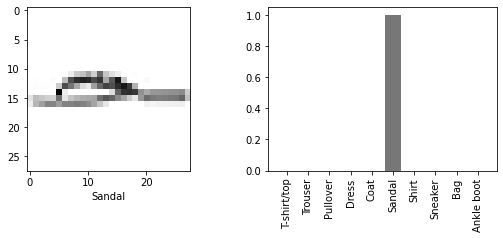

True
-------------------------------------------------


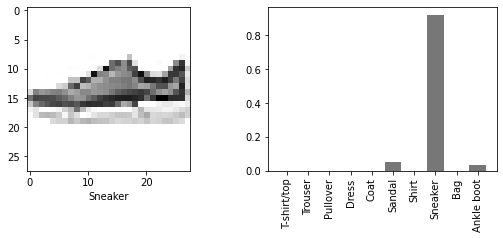

True
-------------------------------------------------


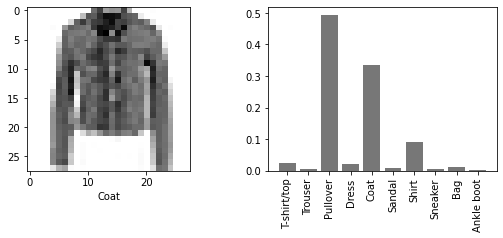

False
-------------------------------------------------


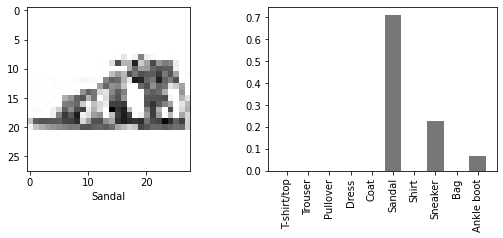

True
-------------------------------------------------


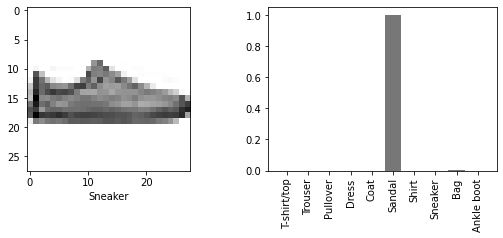

False
-------------------------------------------------


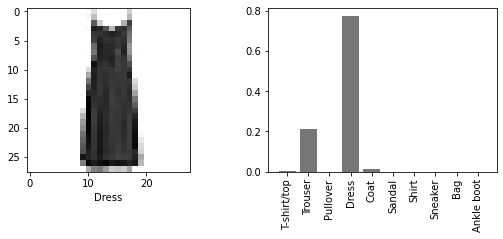

True
-------------------------------------------------


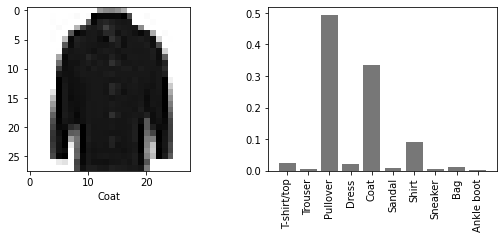

False
-------------------------------------------------


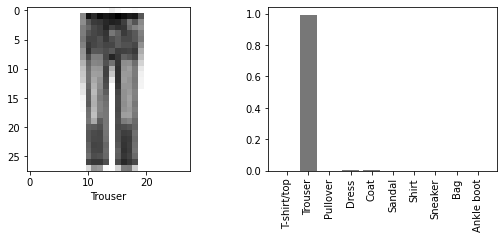

True
-------------------------------------------------


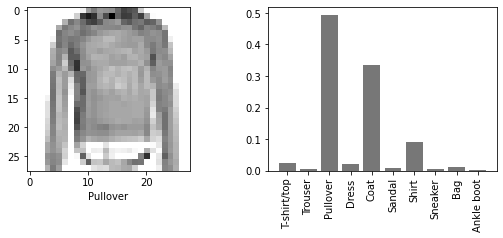

True
-------------------------------------------------


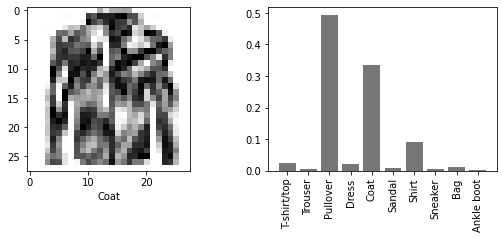

False
-------------------------------------------------


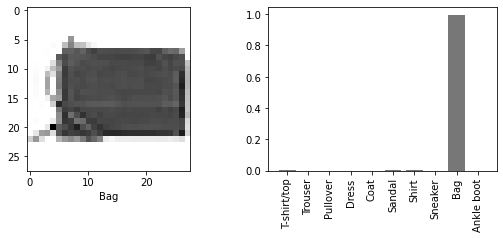

True
-------------------------------------------------


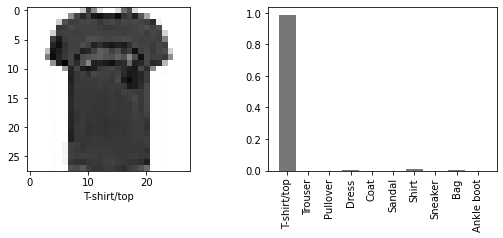

True
-------------------------------------------------


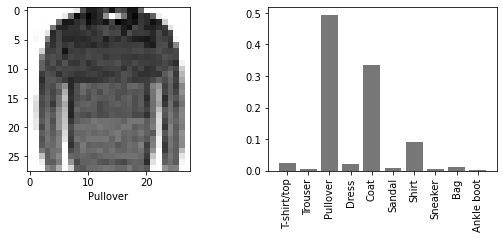

True
-------------------------------------------------


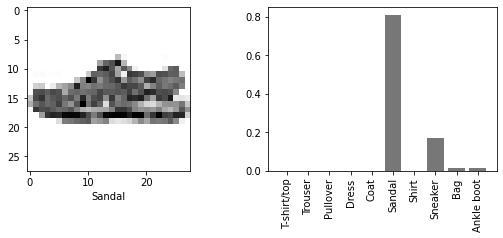

True
-------------------------------------------------


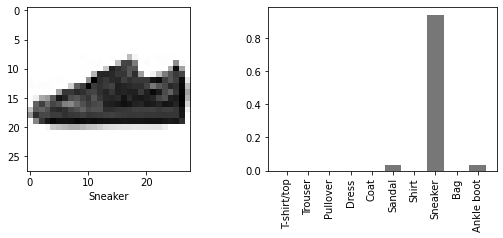

True
-------------------------------------------------


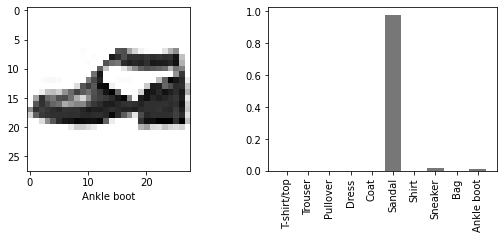

False
-------------------------------------------------


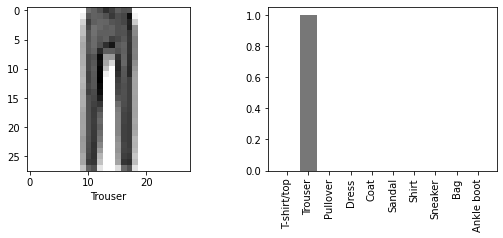

True
-------------------------------------------------


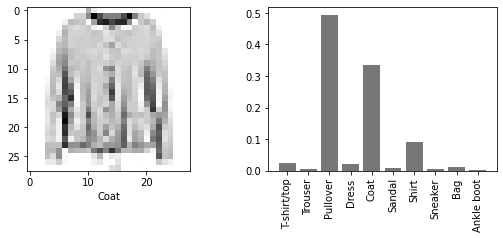

False
-------------------------------------------------


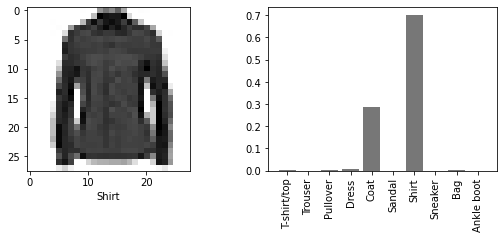

True
-------------------------------------------------


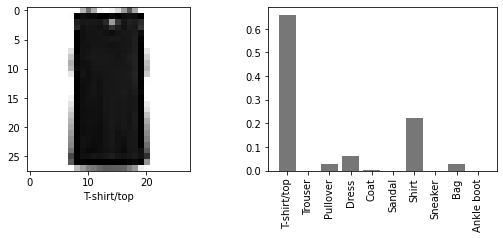

True
-------------------------------------------------


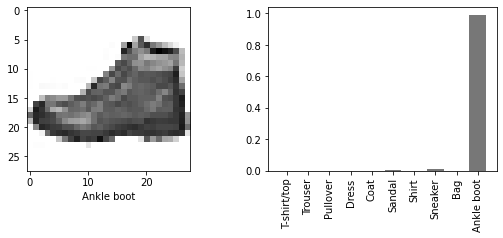

True
-------------------------------------------------


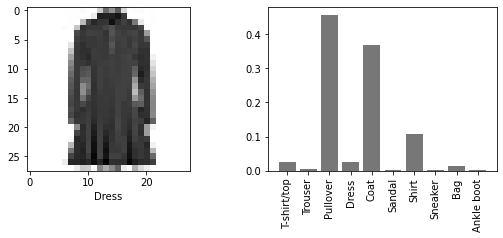

False
-------------------------------------------------


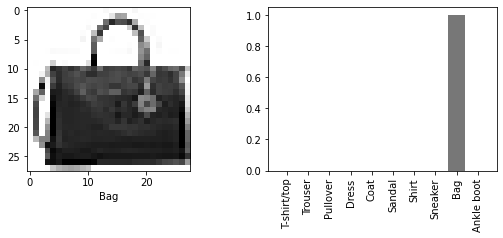

True
-------------------------------------------------


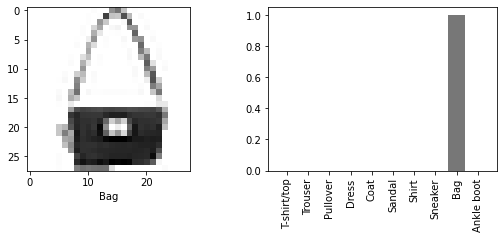

True
-------------------------------------------------


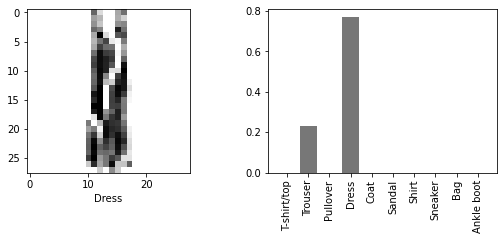

True
-------------------------------------------------


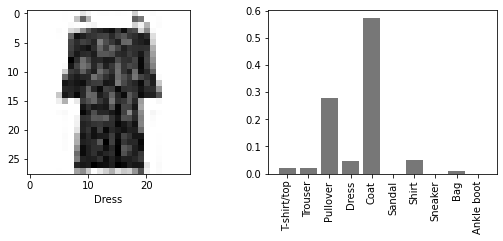

False
-------------------------------------------------


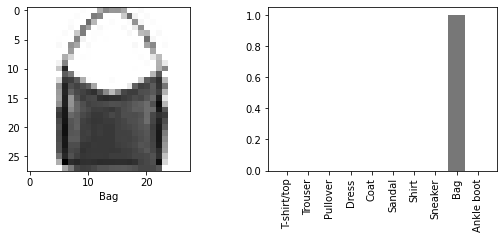

True
-------------------------------------------------


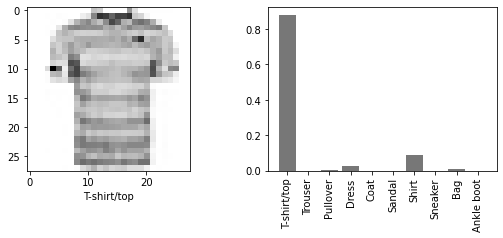

True
-------------------------------------------------


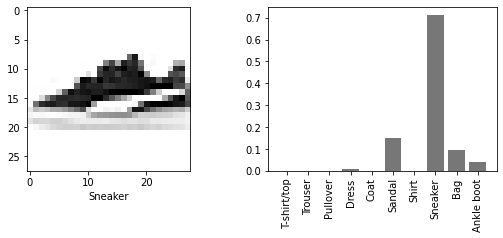

True
-------------------------------------------------


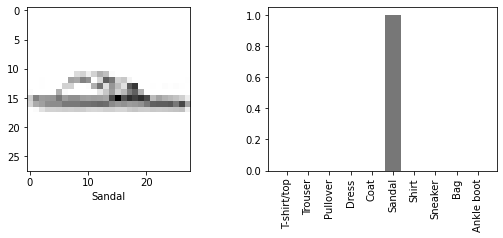

True
-------------------------------------------------


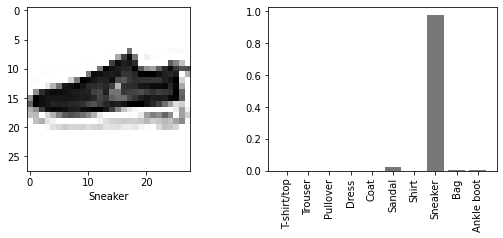

True
-------------------------------------------------


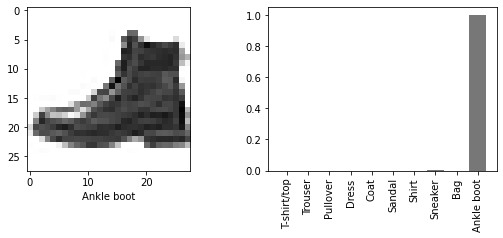

True
-------------------------------------------------


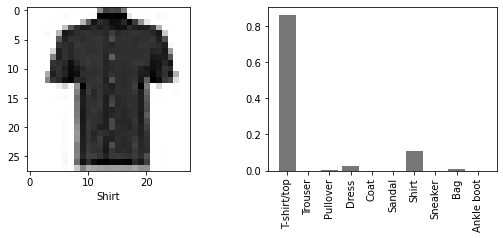

False
-------------------------------------------------


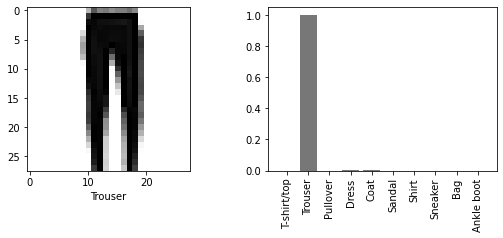

True
-------------------------------------------------


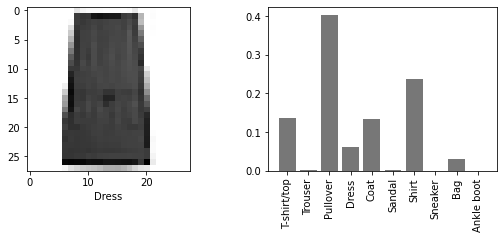

False
-------------------------------------------------


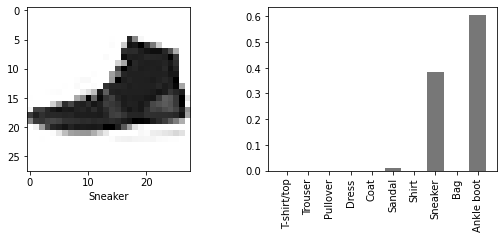

False
-------------------------------------------------


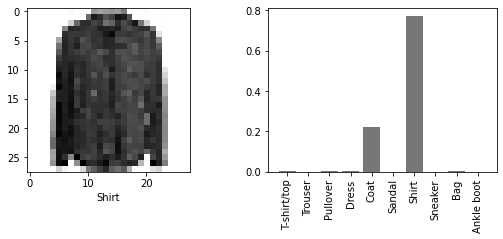

True
-------------------------------------------------


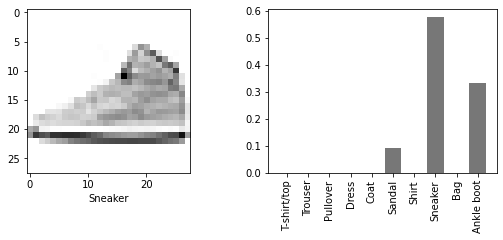

True
-------------------------------------------------


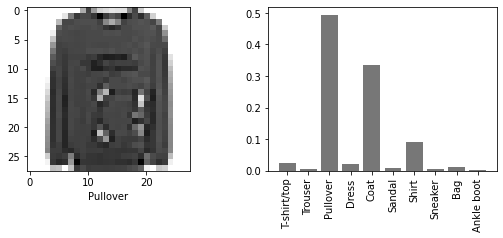

True
-------------------------------------------------


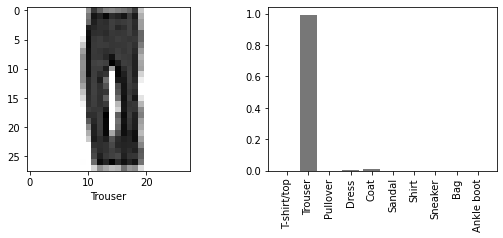

True
-------------------------------------------------


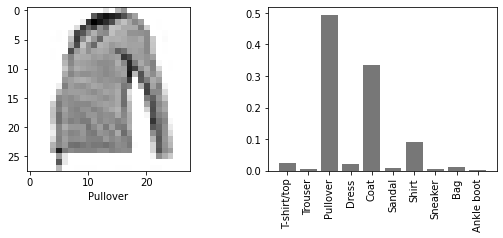

True
-------------------------------------------------


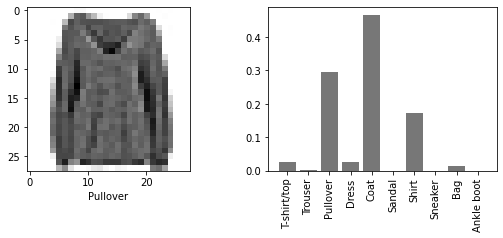

False
-------------------------------------------------


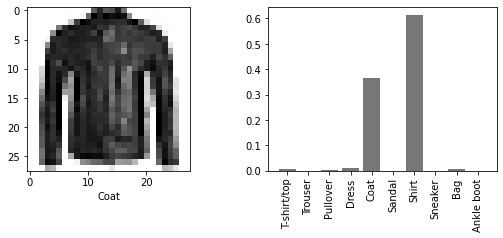

False
-------------------------------------------------


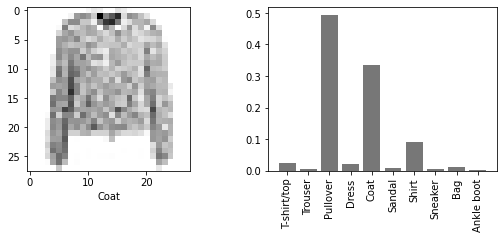

False
-------------------------------------------------


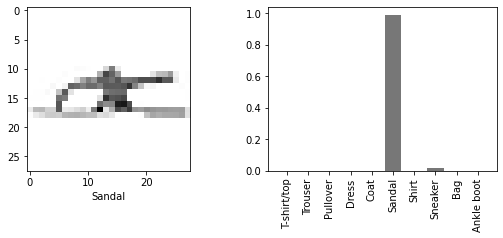

True
-------------------------------------------------


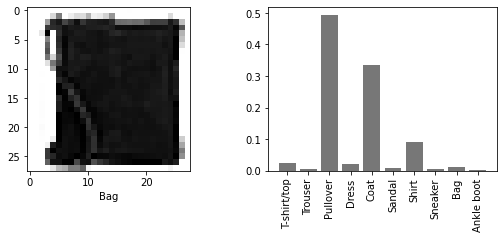

False
-------------------------------------------------


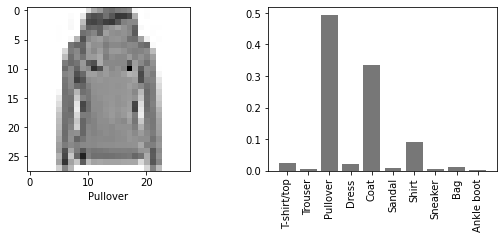

True
-------------------------------------------------


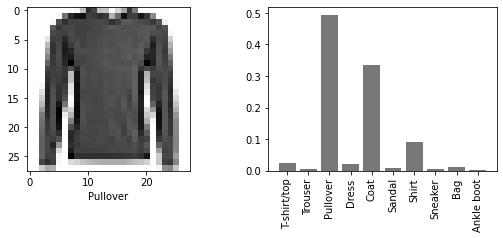

True
-------------------------------------------------


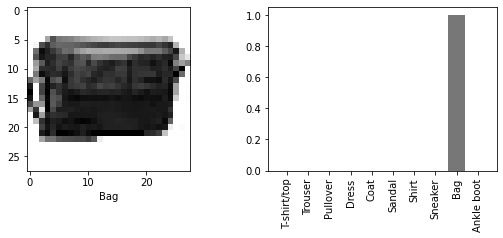

True
-------------------------------------------------


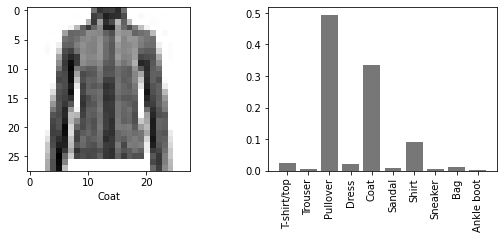

False
-------------------------------------------------


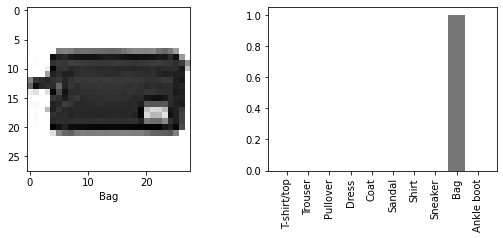

True
-------------------------------------------------


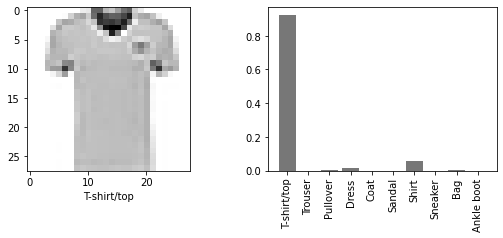

True
-------------------------------------------------


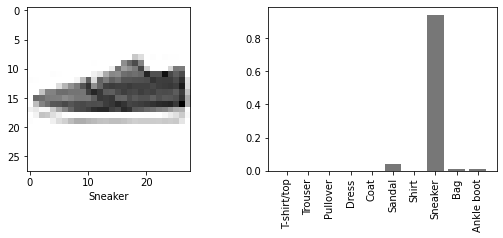

True
-------------------------------------------------


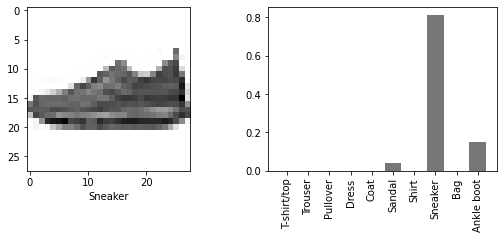

True
-------------------------------------------------


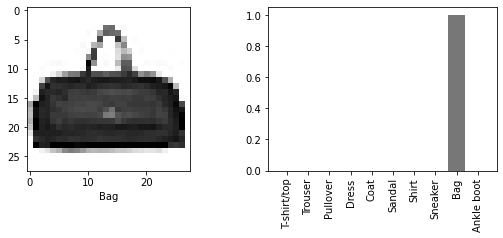

True
-------------------------------------------------


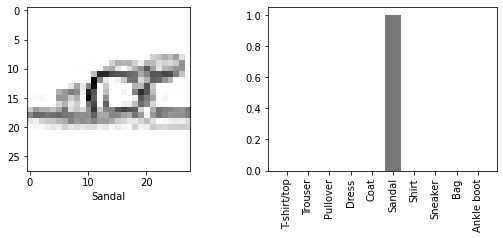

True
-------------------------------------------------


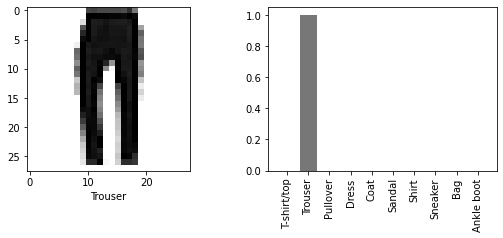

True
-------------------------------------------------


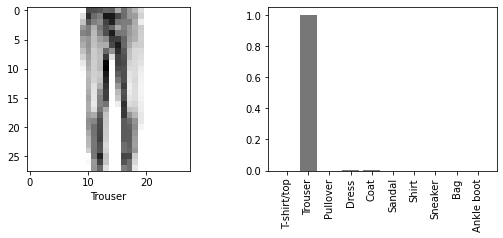

True
-------------------------------------------------


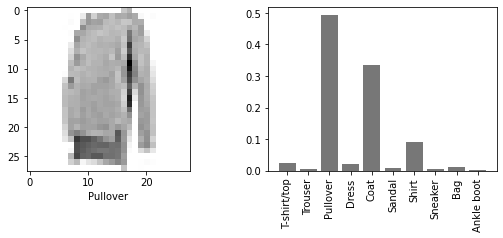

True
-------------------------------------------------


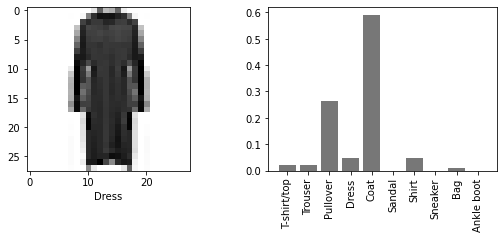

False
-------------------------------------------------


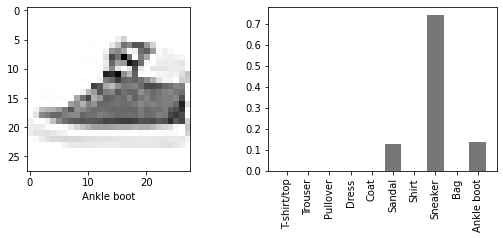

False
-------------------------------------------------


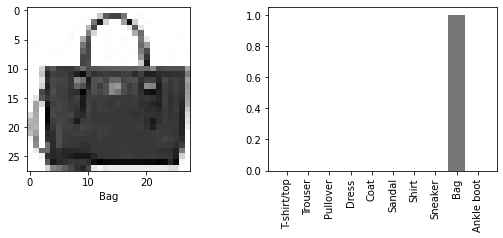

True
-------------------------------------------------


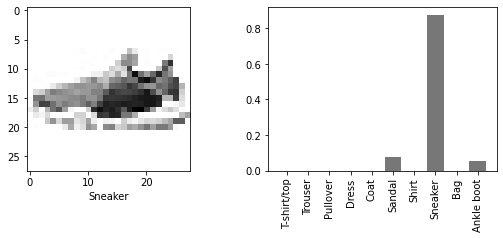

True
-------------------------------------------------


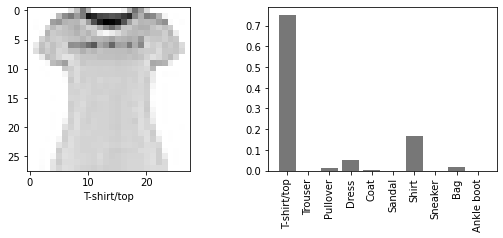

True
-------------------------------------------------


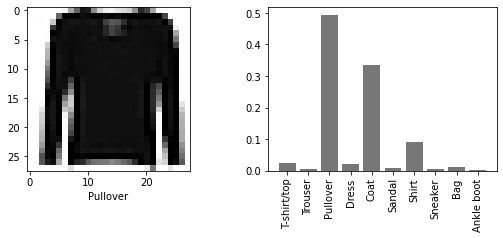

True
-------------------------------------------------


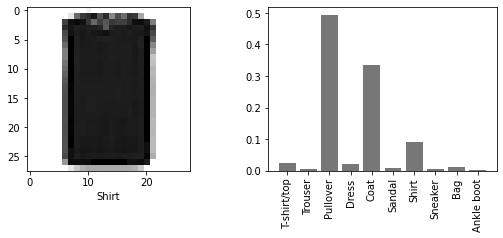

False
-------------------------------------------------


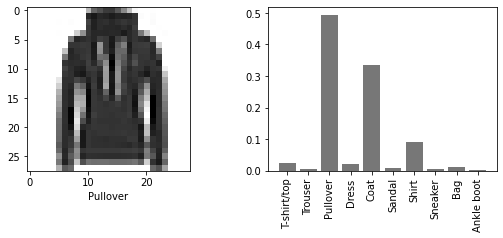

True
-------------------------------------------------


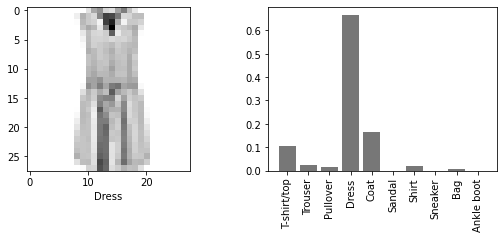

True
-------------------------------------------------


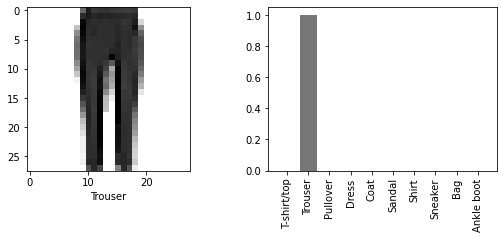

True
-------------------------------------------------


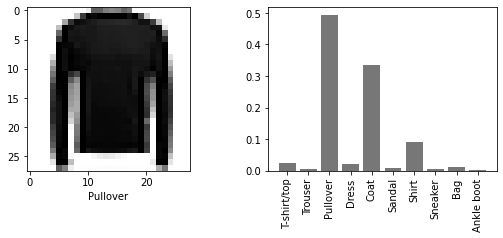

True
-------------------------------------------------


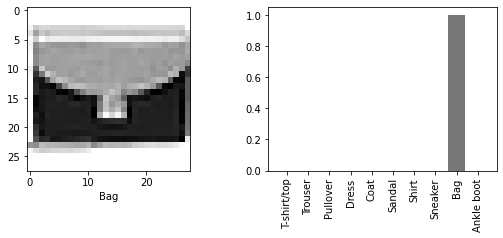

True
-------------------------------------------------


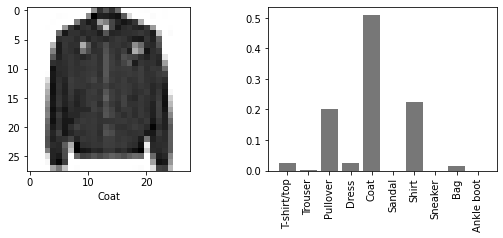

True
-------------------------------------------------


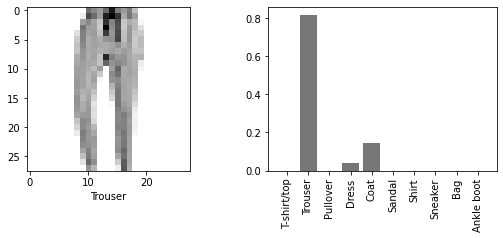

True
-------------------------------------------------


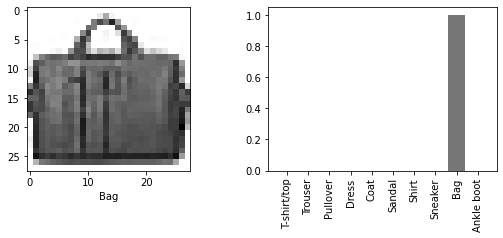

True
-------------------------------------------------


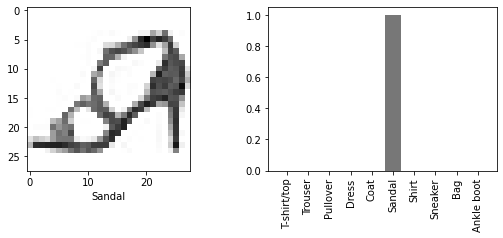

True
-------------------------------------------------


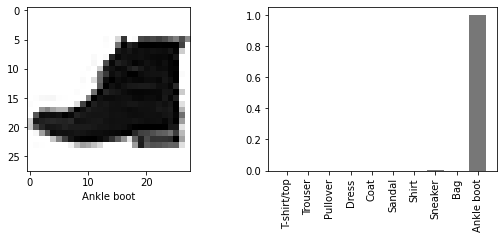

True
-------------------------------------------------


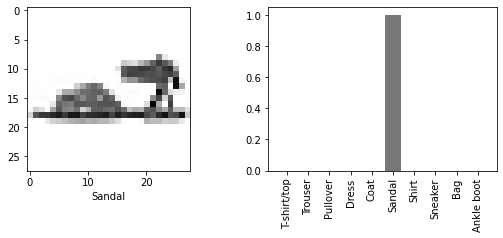

True
-------------------------------------------------


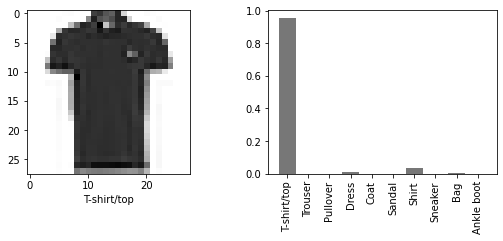

True
-------------------------------------------------


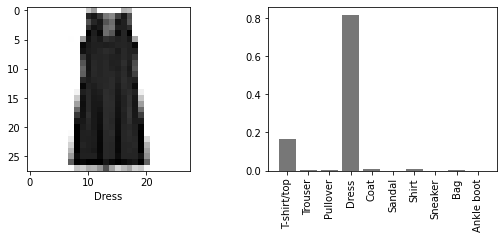

True
-------------------------------------------------


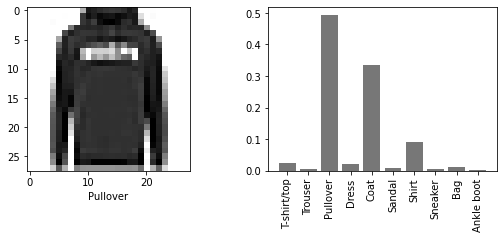

True
-------------------------------------------------


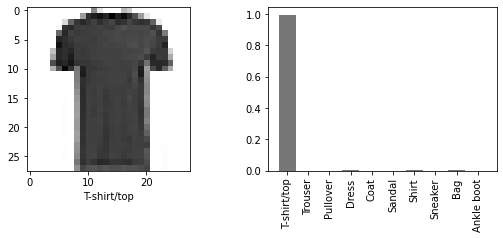

True
-------------------------------------------------


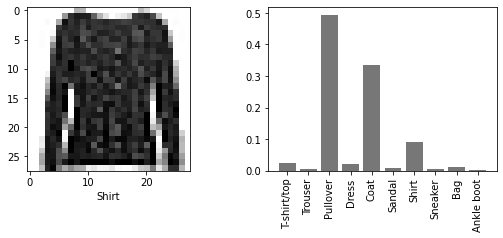

False
-------------------------------------------------


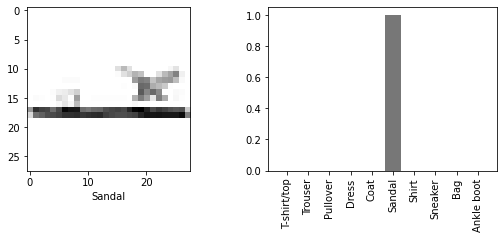

True
-------------------------------------------------


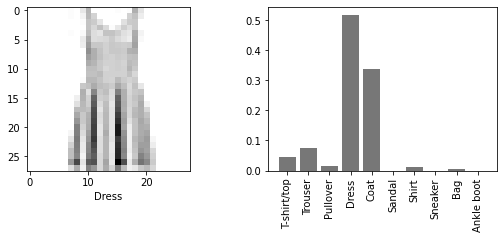

True
-------------------------------------------------


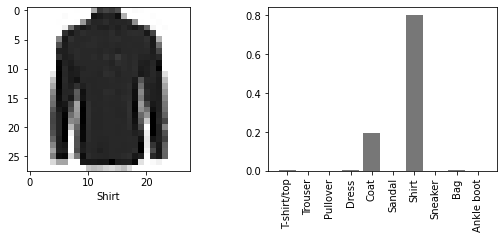

True
-------------------------------------------------


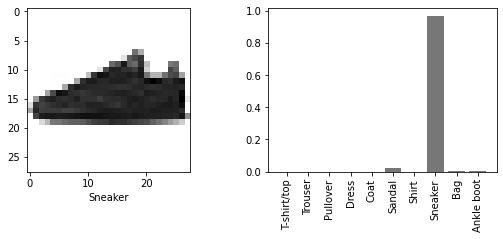

True
-------------------------------------------------


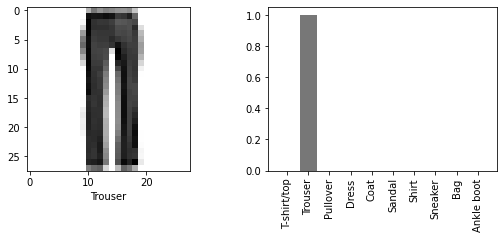

True
-------------------------------------------------


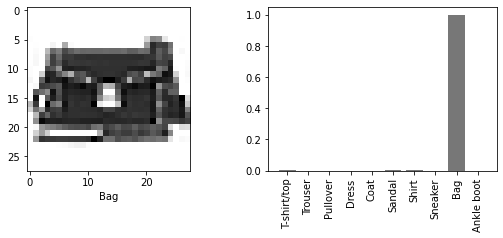

True
-------------------------------------------------


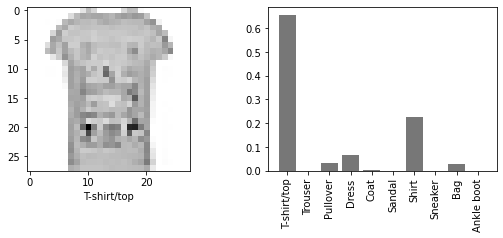

True
-------------------------------------------------


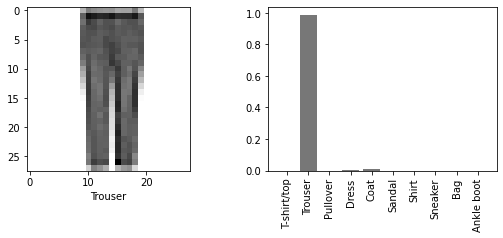

True
-------------------------------------------------


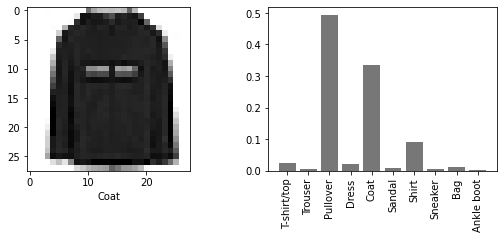

False
-------------------------------------------------


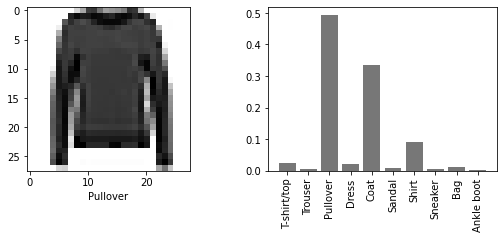

True
-------------------------------------------------


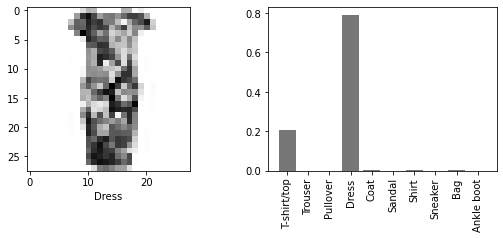

True
-------------------------------------------------


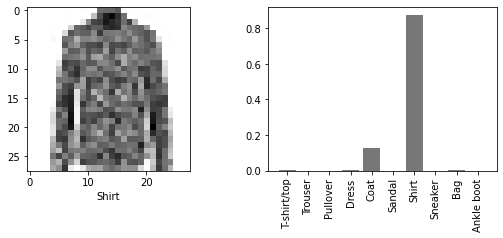

True
-------------------------------------------------


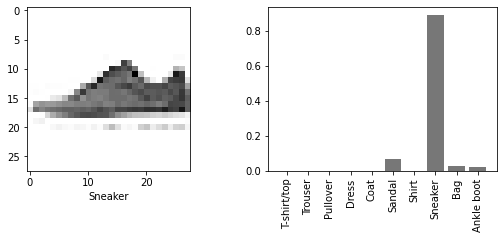

True
-------------------------------------------------


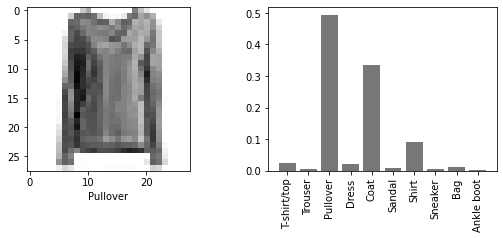

True
-------------------------------------------------


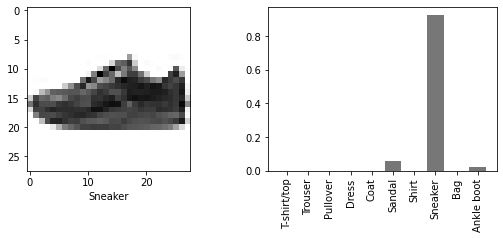

True
-------------------------------------------------


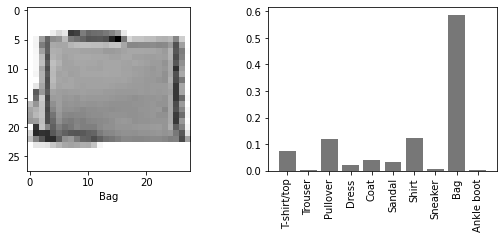

True
-------------------------------------------------


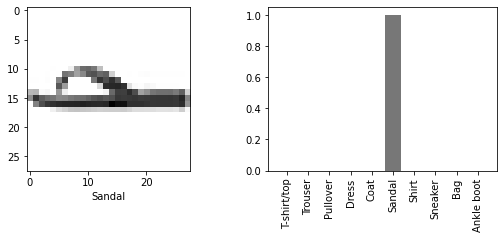

True
-------------------------------------------------


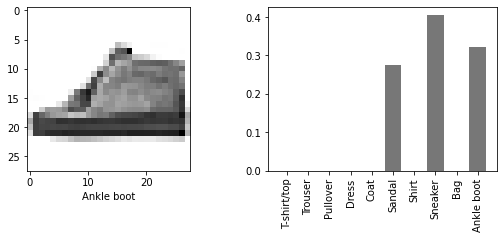

False
-------------------------------------------------


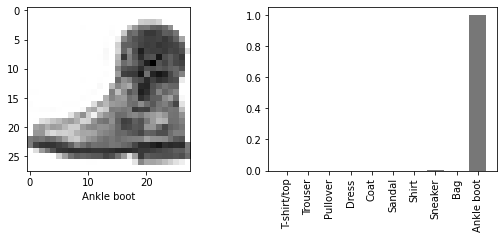

True
-------------------------------------------------


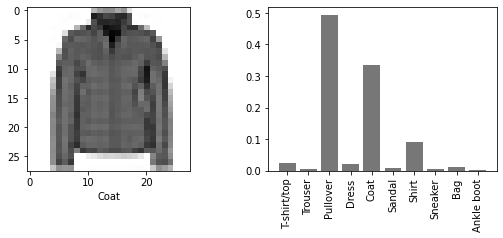

False
-------------------------------------------------


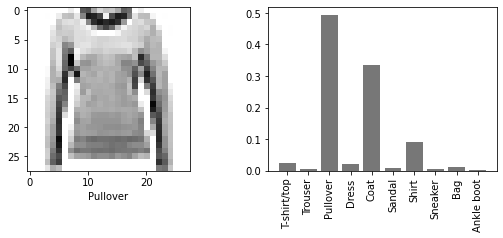

True
-------------------------------------------------


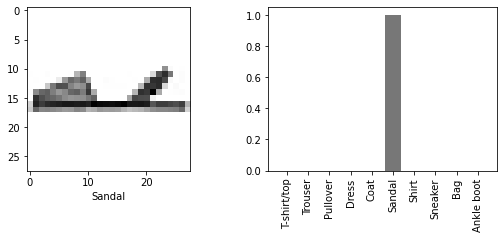

True
-------------------------------------------------


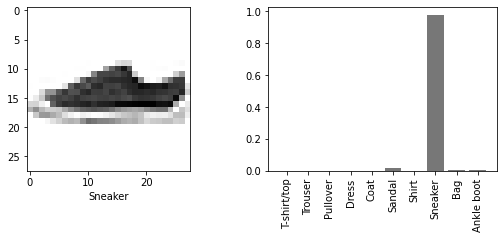

True
-------------------------------------------------


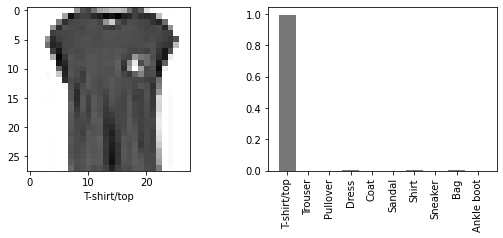

True
-------------------------------------------------


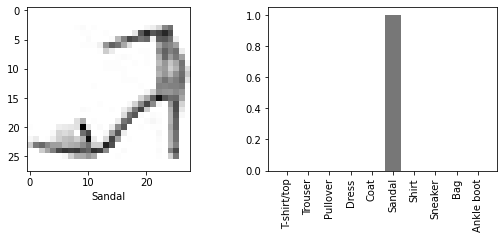

True
-------------------------------------------------


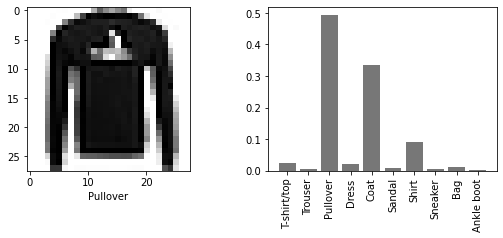

True
-------------------------------------------------


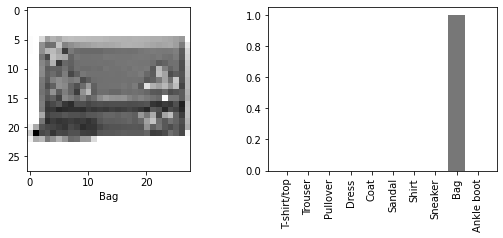

True
-------------------------------------------------


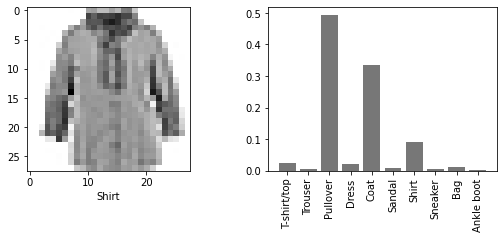

False
-------------------------------------------------


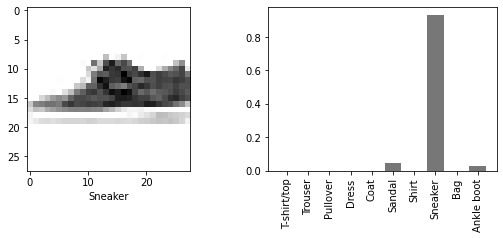

True
-------------------------------------------------


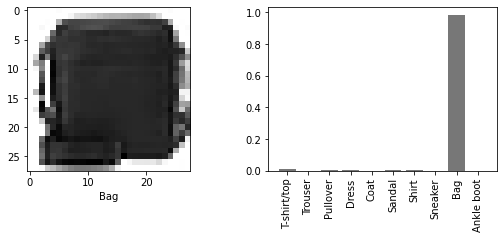

True
-------------------------------------------------


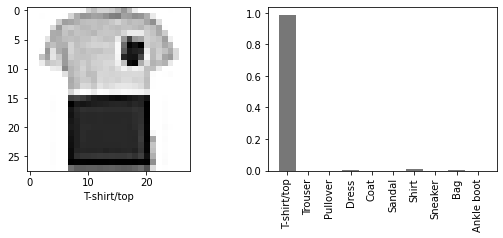

True
-------------------------------------------------


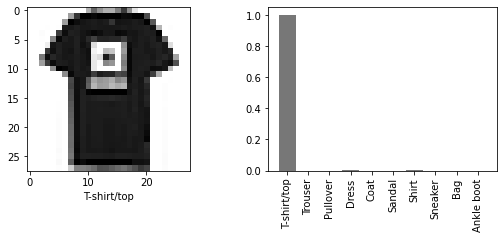

True
-------------------------------------------------


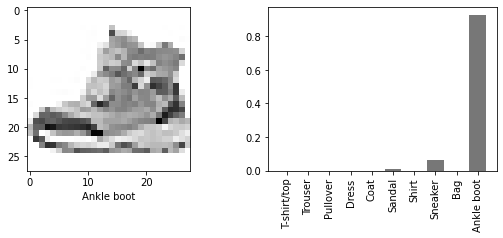

True
-------------------------------------------------


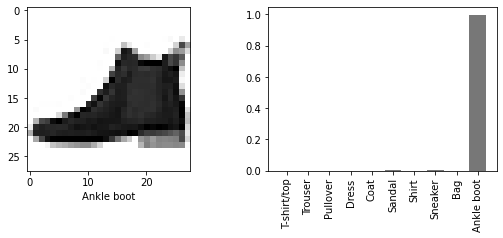

True
-------------------------------------------------


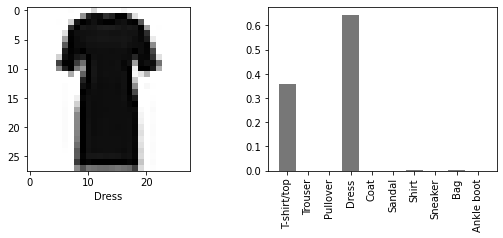

True
-------------------------------------------------


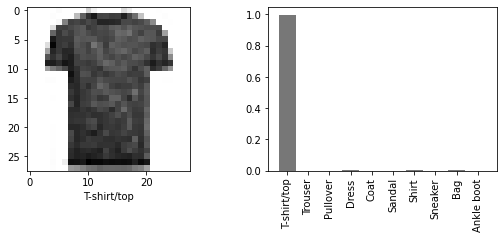

True
-------------------------------------------------


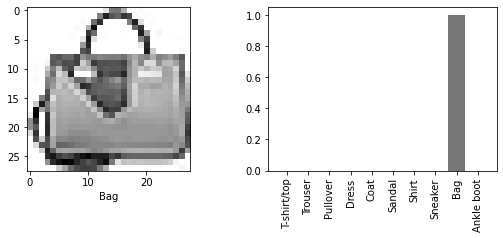

True
-------------------------------------------------


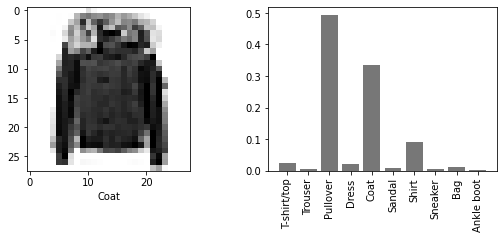

False
-------------------------------------------------


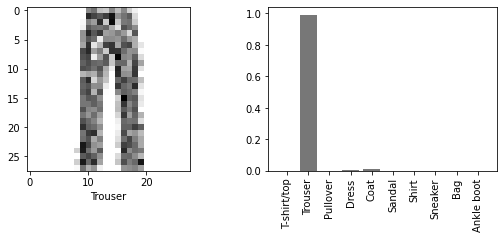

True
-------------------------------------------------


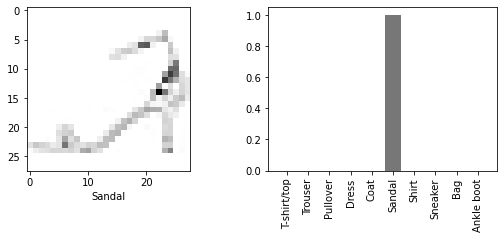

True
-------------------------------------------------


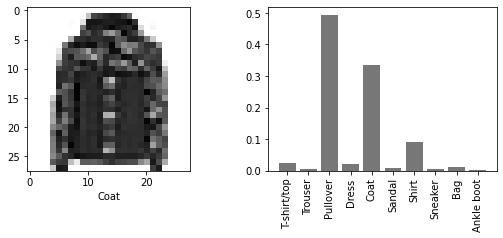

False
-------------------------------------------------


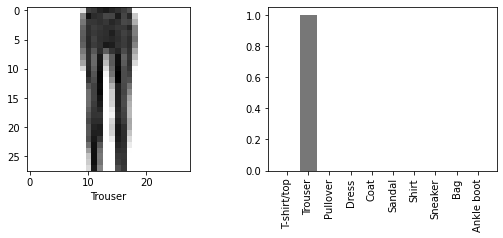

True
-------------------------------------------------


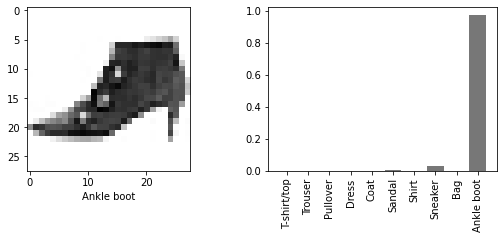

True
-------------------------------------------------


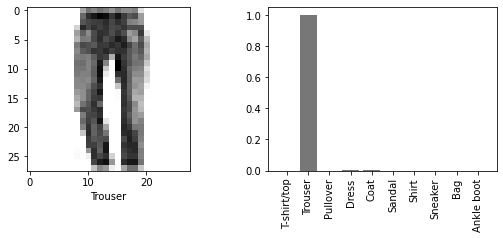

True
-------------------------------------------------


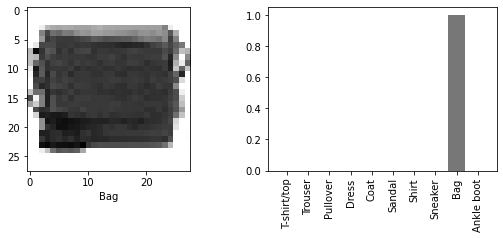

True
-------------------------------------------------


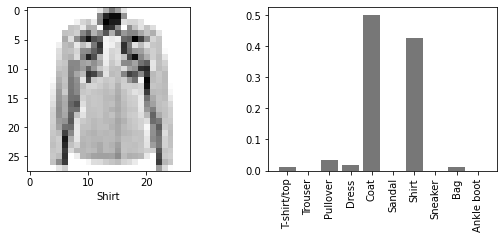

False
-------------------------------------------------


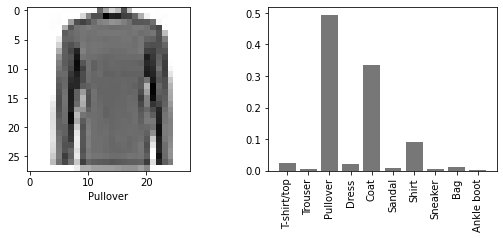

True
-------------------------------------------------


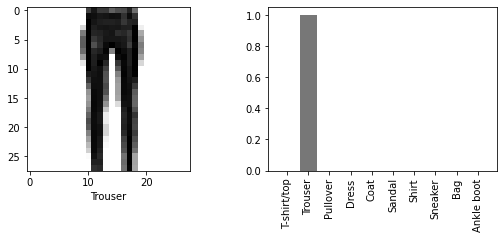

True
-------------------------------------------------


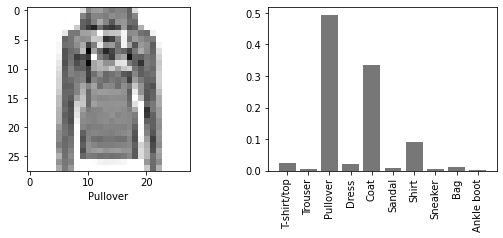

True
-------------------------------------------------


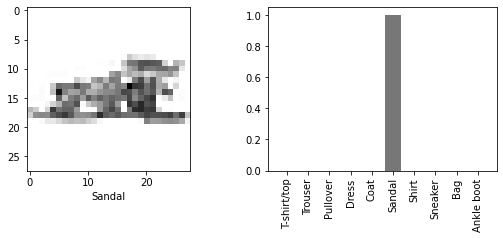

True
-------------------------------------------------


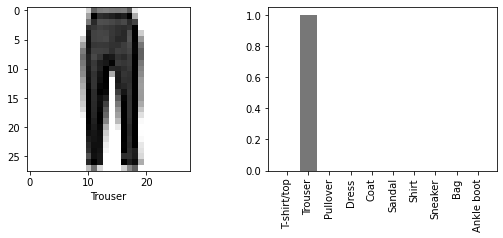

True
-------------------------------------------------


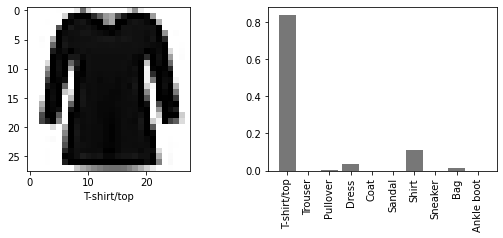

True
-------------------------------------------------


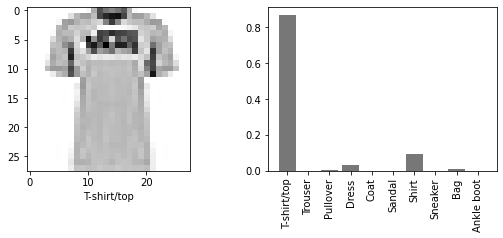

True
-------------------------------------------------


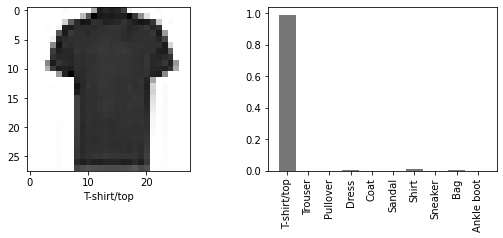

True
-------------------------------------------------


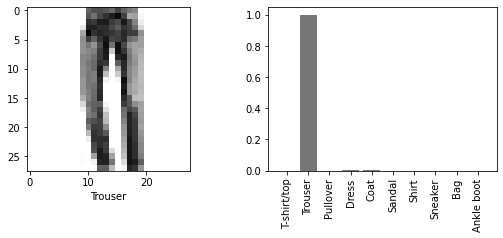

True
-------------------------------------------------


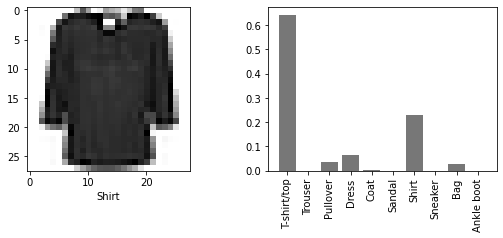

False
-------------------------------------------------


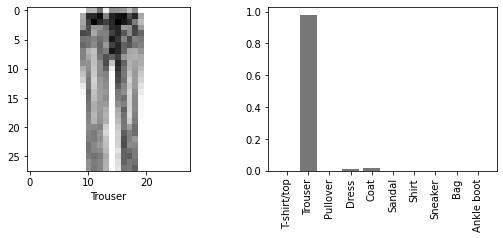

True
-------------------------------------------------


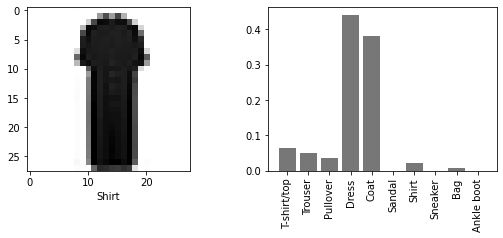

False
-------------------------------------------------


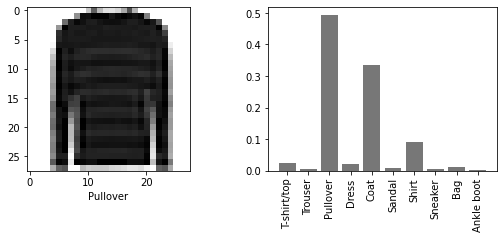

True
-------------------------------------------------


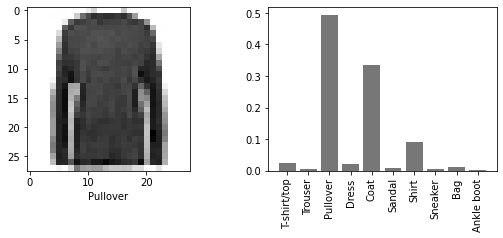

True
-------------------------------------------------


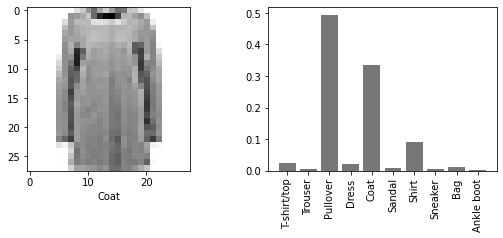

False
-------------------------------------------------


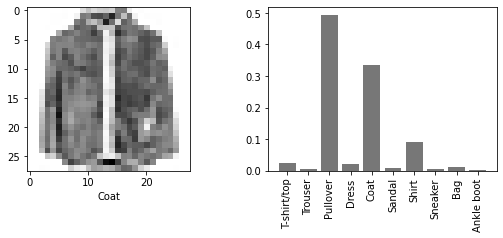

False
-------------------------------------------------


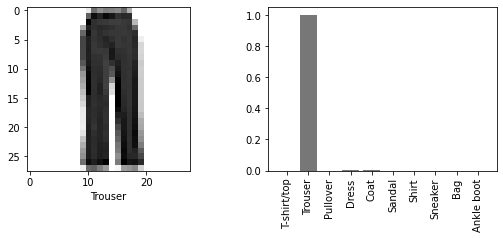

True
-------------------------------------------------


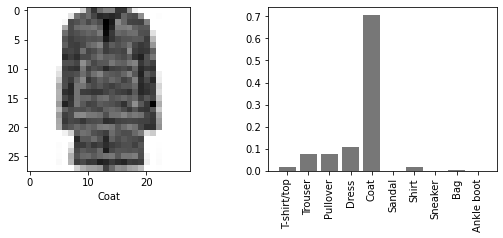

True
-------------------------------------------------


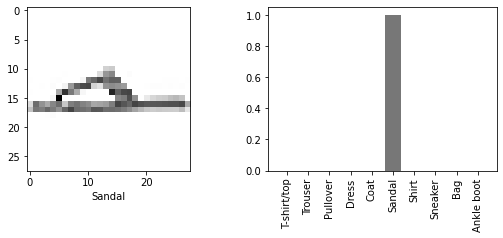

True
-------------------------------------------------


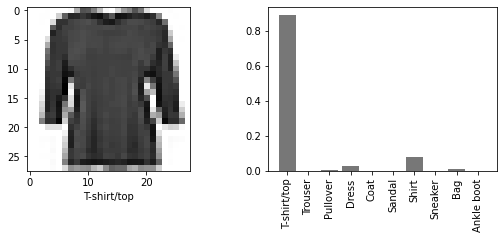

True
-------------------------------------------------


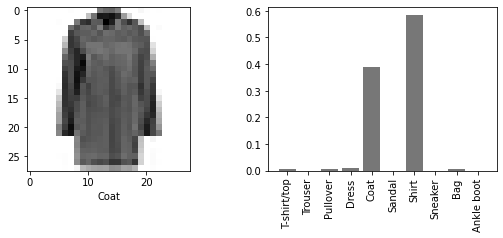

False
-------------------------------------------------


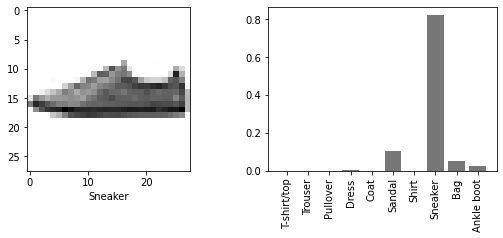

True
-------------------------------------------------


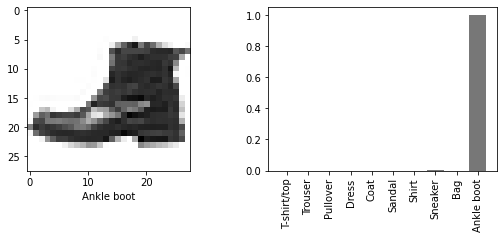

True
-------------------------------------------------


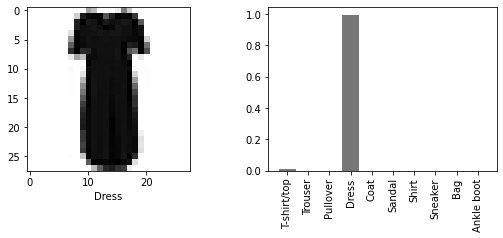

True
-------------------------------------------------


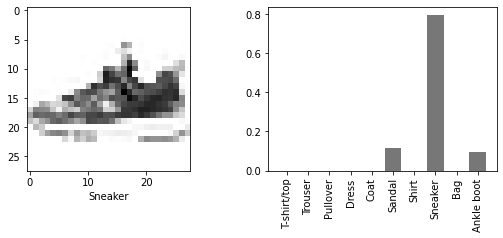

True
-------------------------------------------------


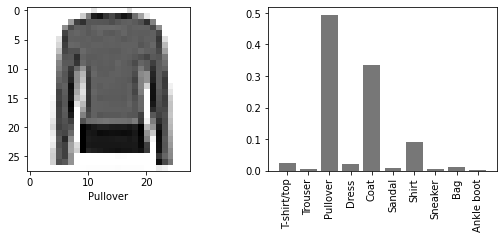

True
-------------------------------------------------


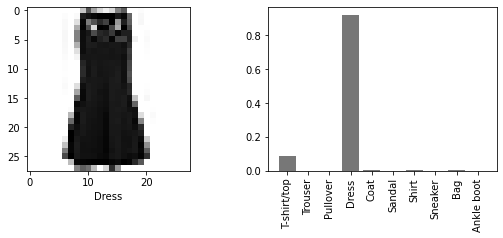

True
-------------------------------------------------


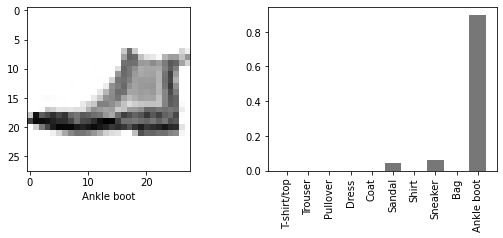

True
-------------------------------------------------


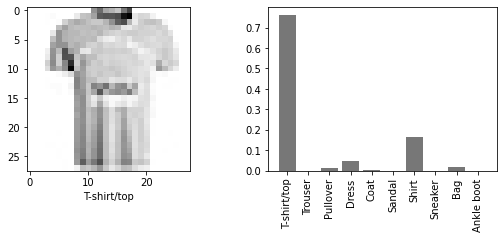

True
-------------------------------------------------


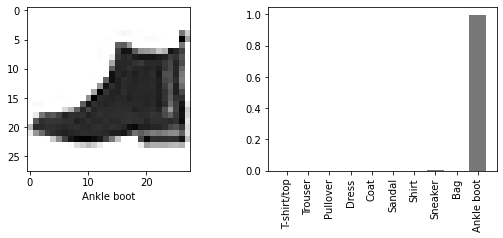

True
-------------------------------------------------


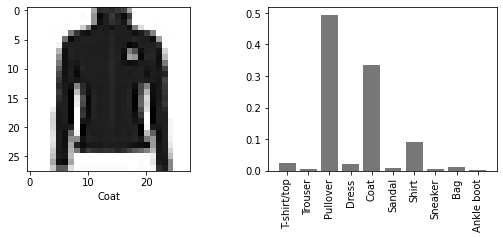

False
-------------------------------------------------


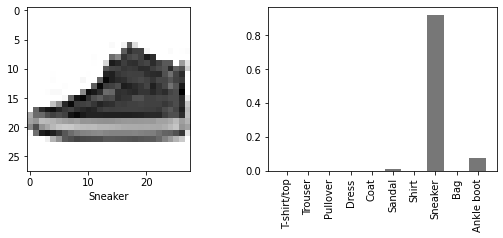

True
-------------------------------------------------


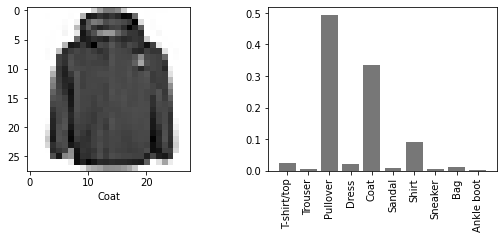

False
-------------------------------------------------


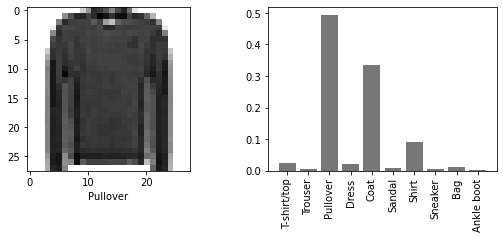

True
-------------------------------------------------


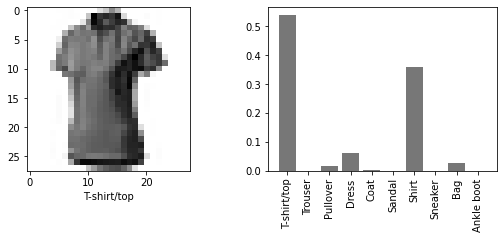

True
-------------------------------------------------


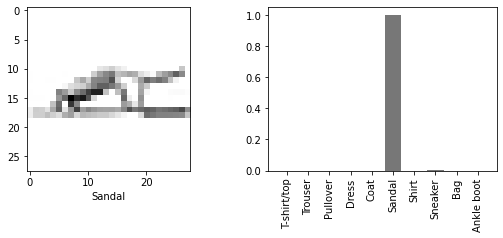

True
-------------------------------------------------


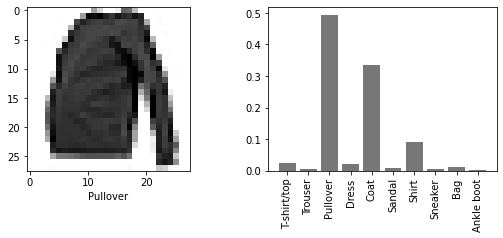

True
-------------------------------------------------


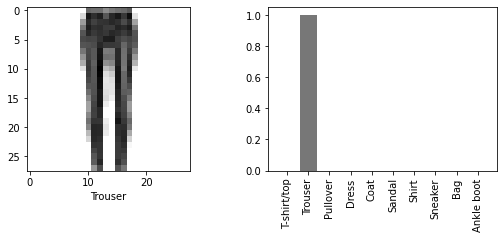

True
-------------------------------------------------


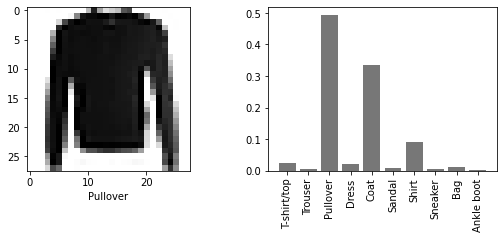

True
-------------------------------------------------


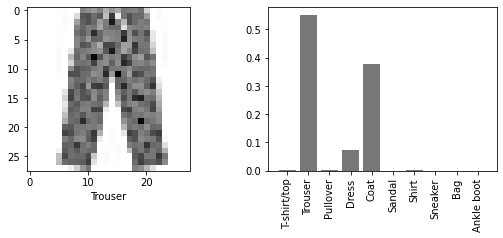

True
-------------------------------------------------


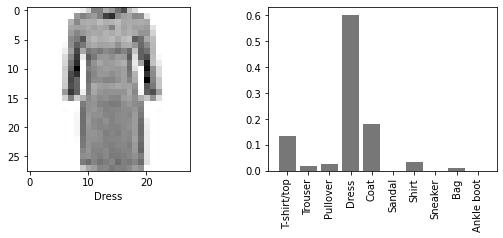

True
-------------------------------------------------


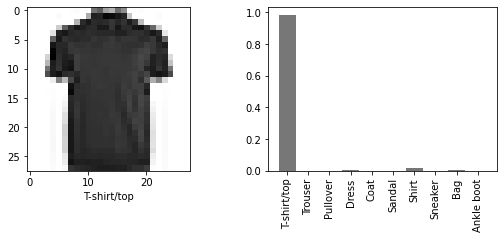

True
-------------------------------------------------


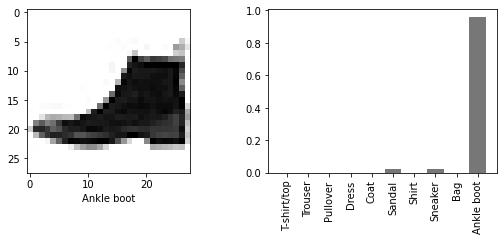

True
-------------------------------------------------


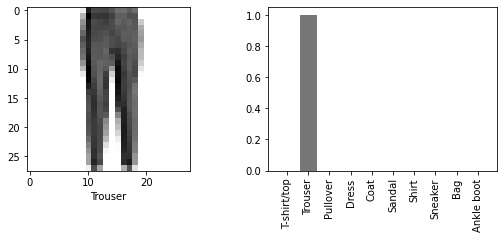

True
-------------------------------------------------


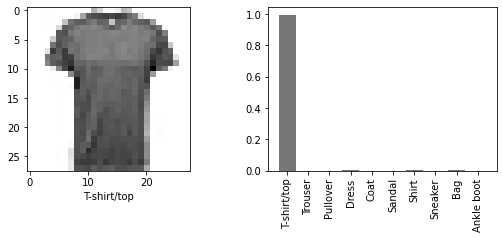

True
-------------------------------------------------


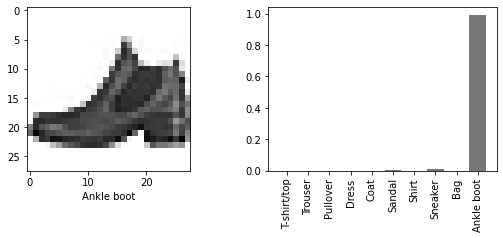

True
-------------------------------------------------


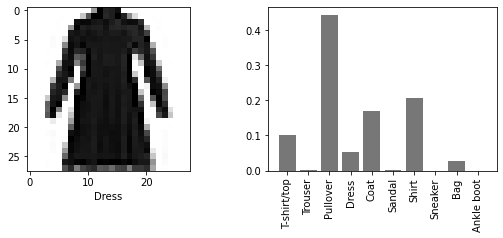

False
-------------------------------------------------


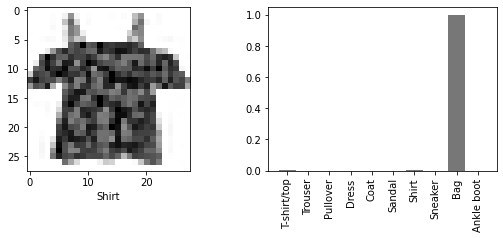

False
-------------------------------------------------


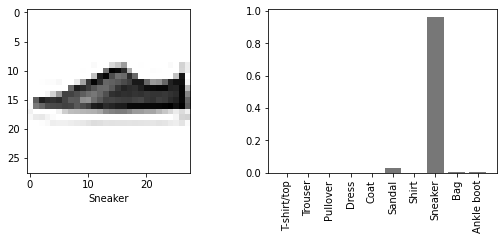

True
-------------------------------------------------


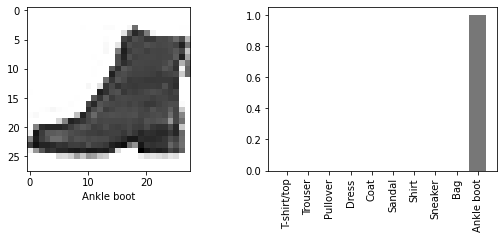

True
-------------------------------------------------


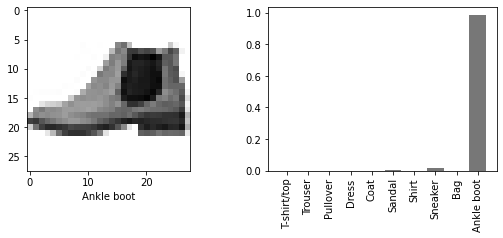

True
-------------------------------------------------


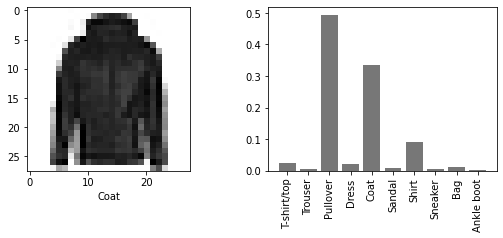

False
-------------------------------------------------


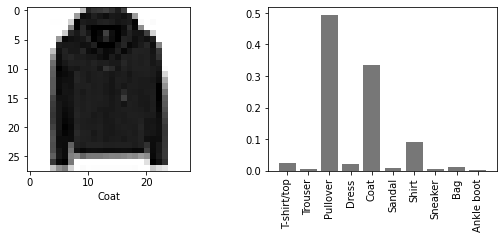

False
-------------------------------------------------


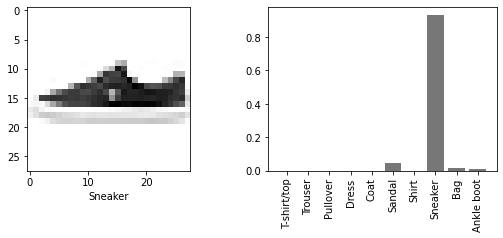

True
-------------------------------------------------


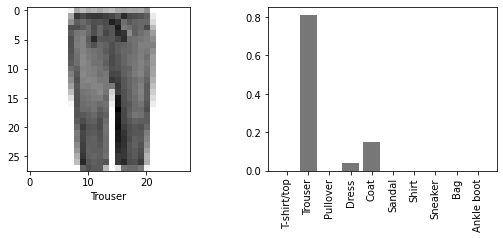

True
-------------------------------------------------


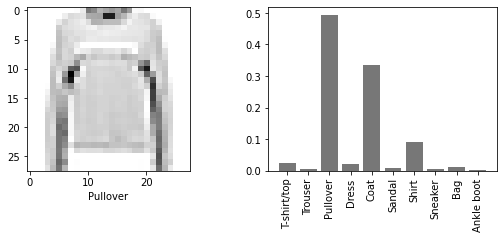

True
-------------------------------------------------


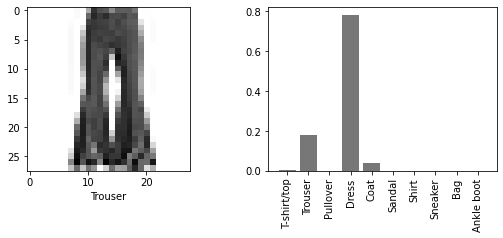

False
-------------------------------------------------


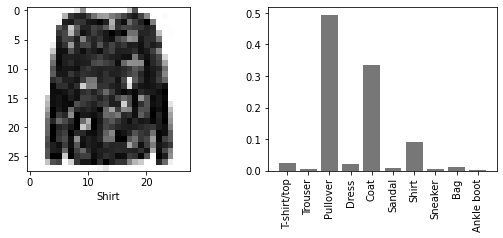

False
-------------------------------------------------


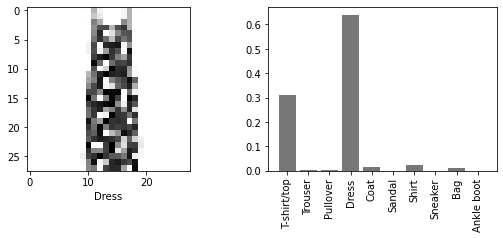

True
-------------------------------------------------


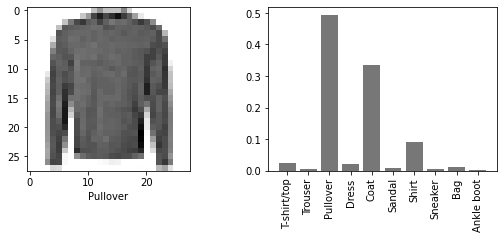

True
-------------------------------------------------


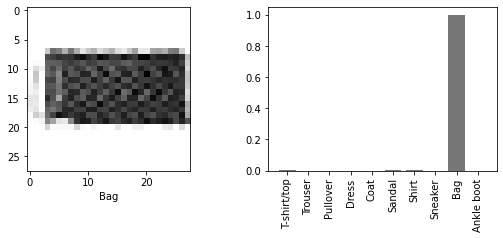

True
-------------------------------------------------


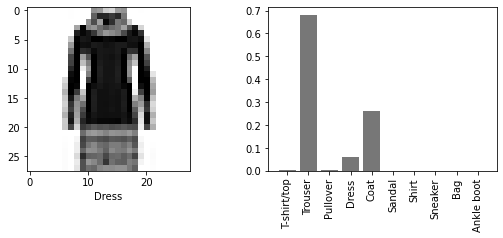

False
-------------------------------------------------


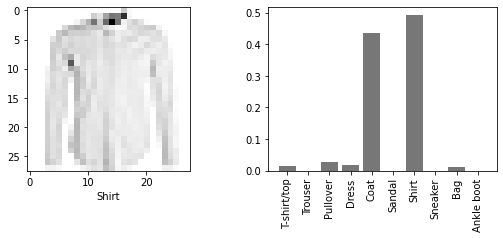

True
-------------------------------------------------


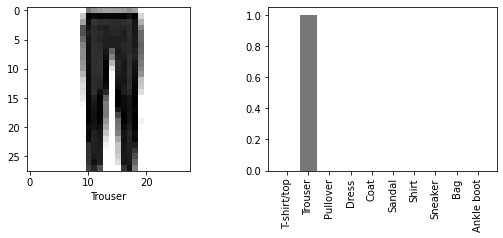

True
-------------------------------------------------


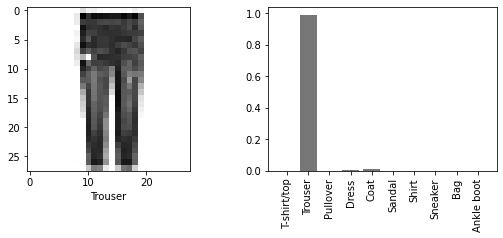

True
-------------------------------------------------


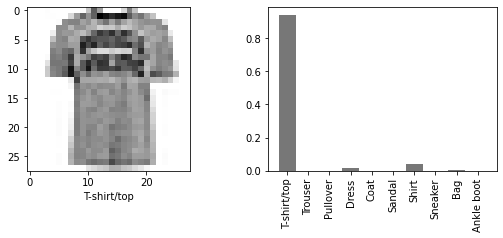

True
-------------------------------------------------


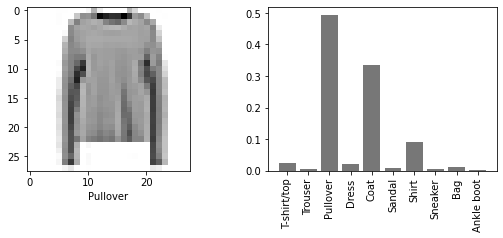

True
-------------------------------------------------


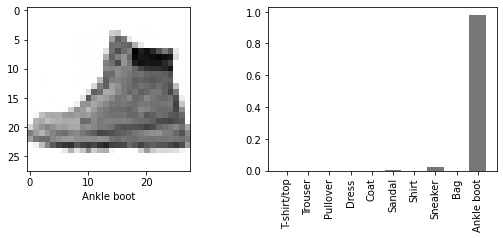

True
-------------------------------------------------


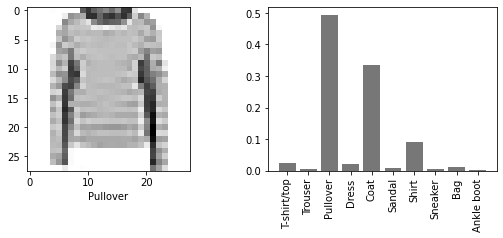

True
-------------------------------------------------


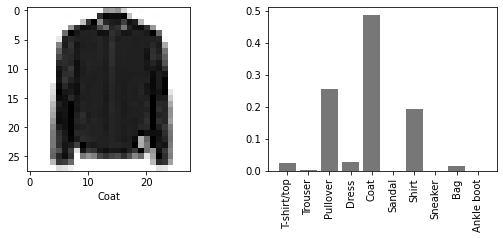

True
-------------------------------------------------


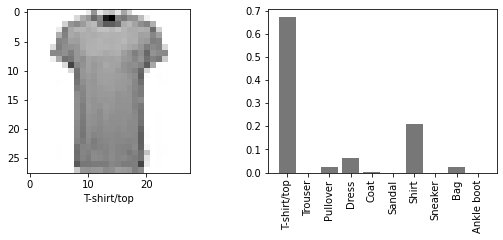

True
-------------------------------------------------


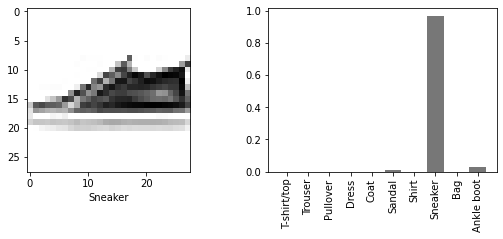

True
-------------------------------------------------


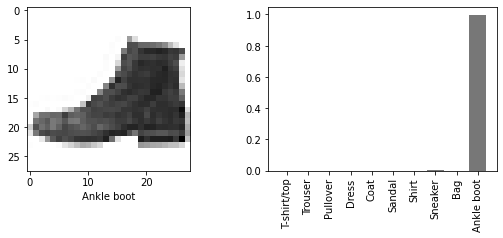

True
-------------------------------------------------


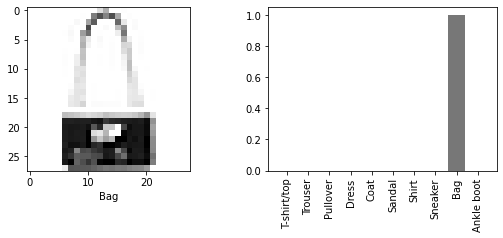

True
-------------------------------------------------


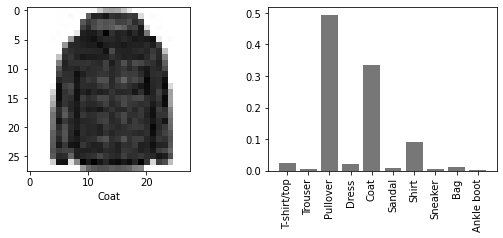

False
-------------------------------------------------


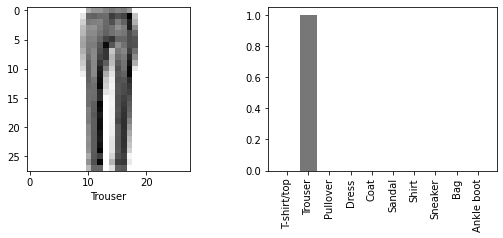

True
-------------------------------------------------


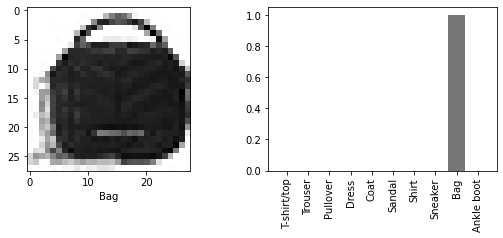

True
-------------------------------------------------


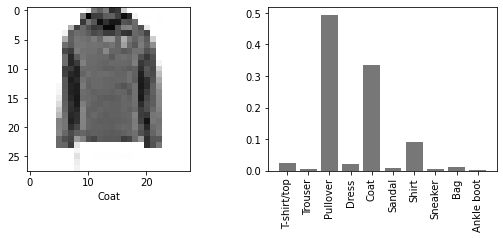

False
-------------------------------------------------


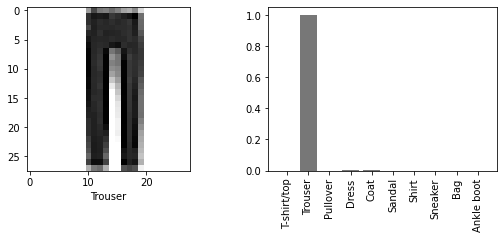

True
-------------------------------------------------


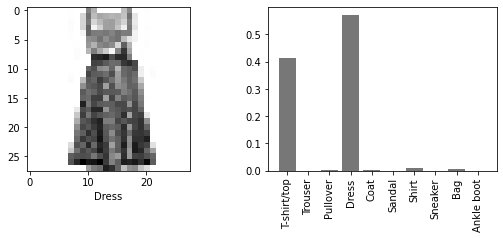

True
-------------------------------------------------


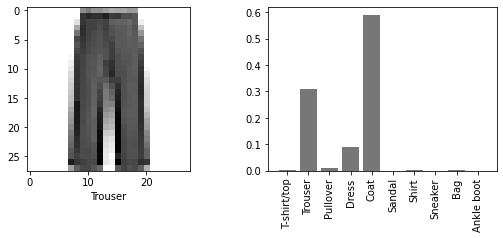

False
-------------------------------------------------


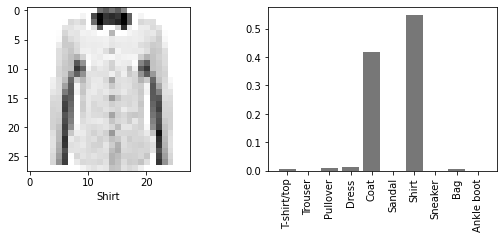

True
-------------------------------------------------


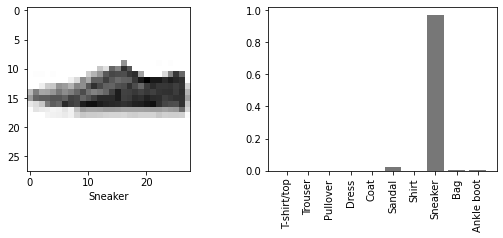

True
-------------------------------------------------


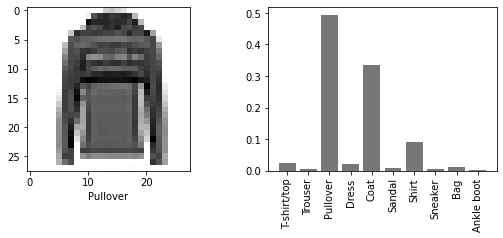

True
-------------------------------------------------


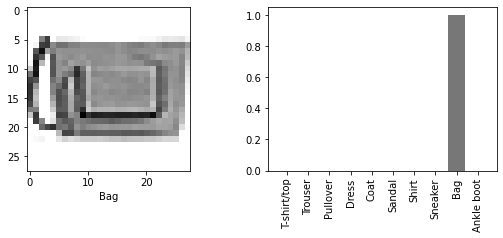

True
-------------------------------------------------


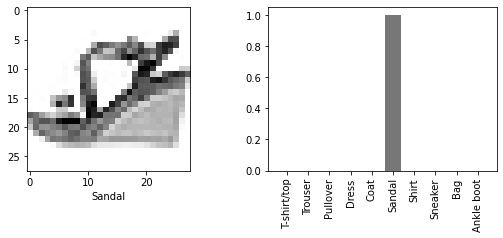

True
-------------------------------------------------


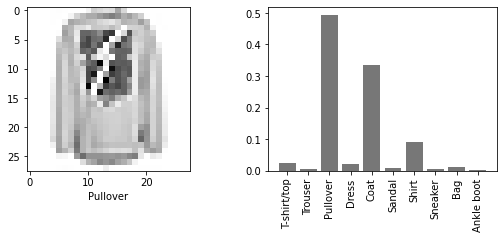

True
-------------------------------------------------


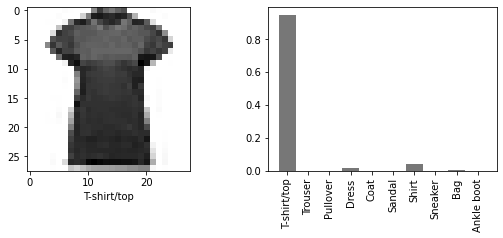

True
-------------------------------------------------


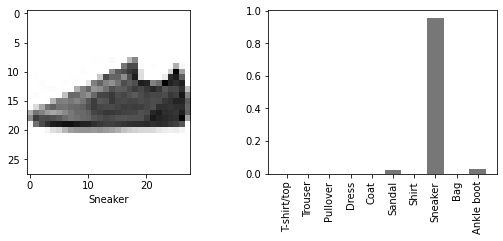

True
-------------------------------------------------


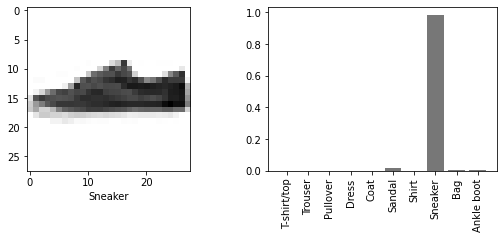

True
-------------------------------------------------


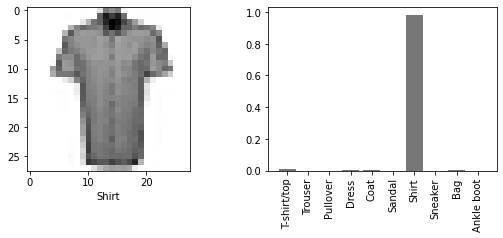

True
-------------------------------------------------


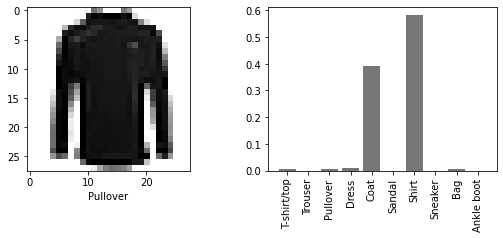

False
-------------------------------------------------


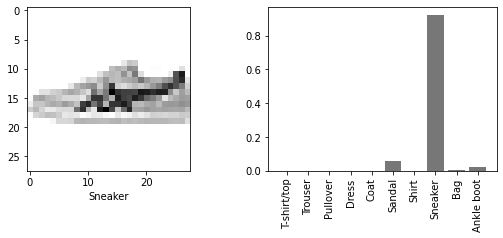

True
-------------------------------------------------


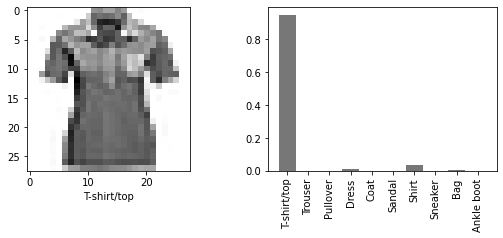

True
-------------------------------------------------


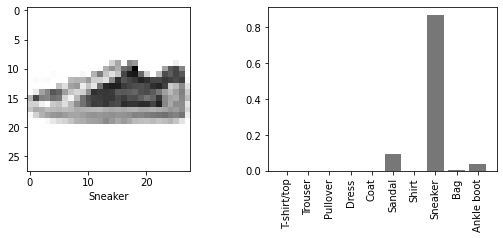

True
-------------------------------------------------


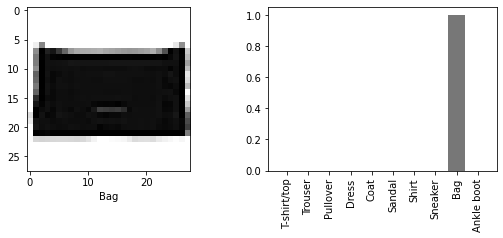

True
-------------------------------------------------


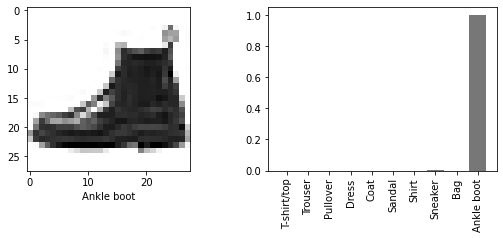

True
-------------------------------------------------


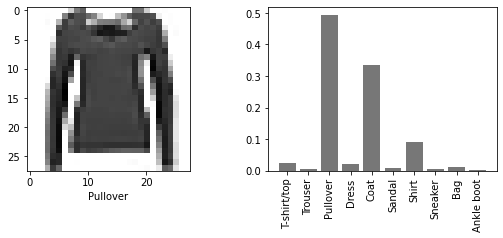

True
-------------------------------------------------


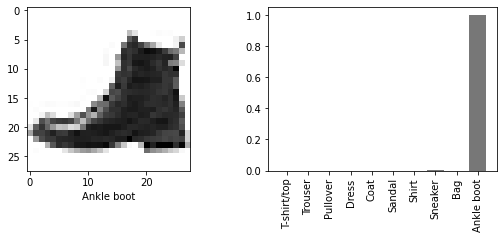

True
-------------------------------------------------


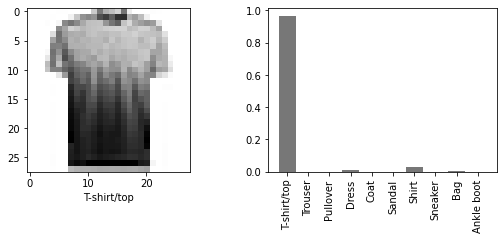

True
-------------------------------------------------


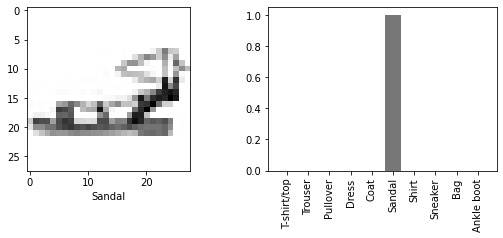

True
-------------------------------------------------


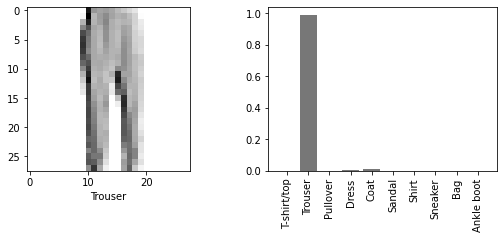

True
-------------------------------------------------


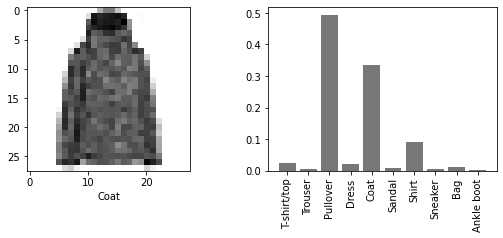

False
-------------------------------------------------


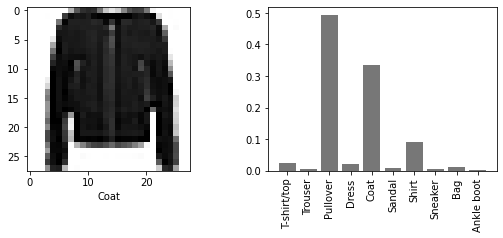

False
-------------------------------------------------


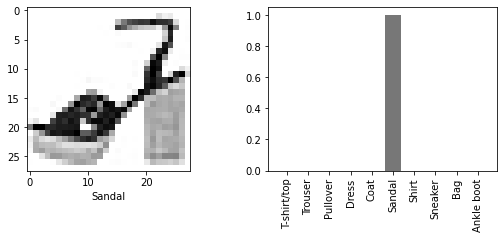

True
-------------------------------------------------


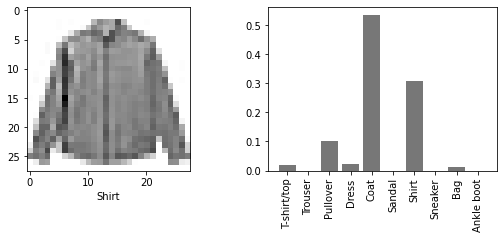

False
-------------------------------------------------


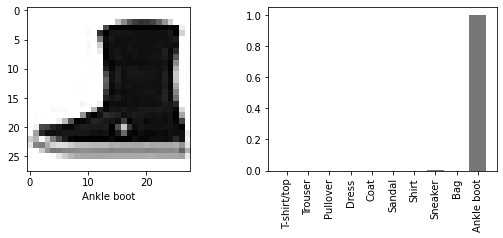

True
-------------------------------------------------


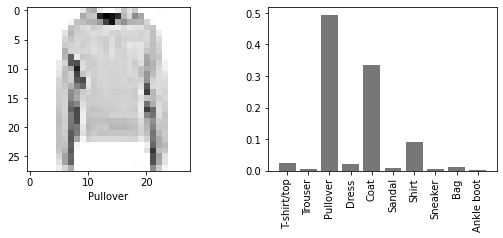

True
-------------------------------------------------


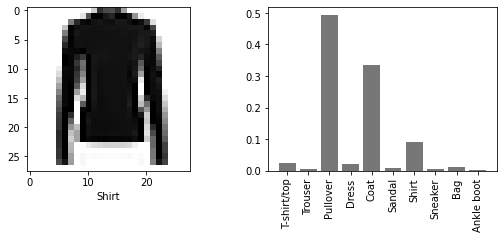

False
-------------------------------------------------


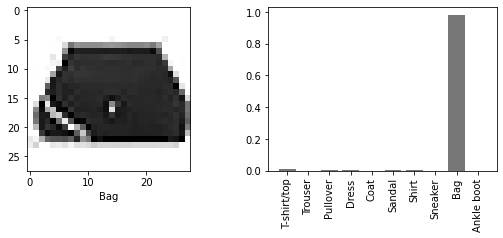

True
-------------------------------------------------


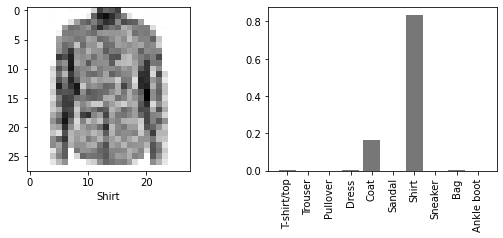

True
-------------------------------------------------


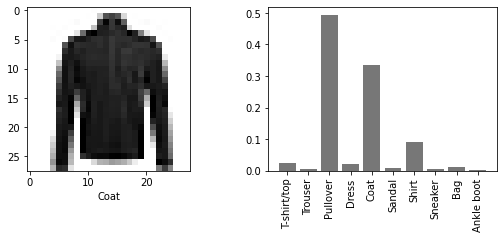

False
-------------------------------------------------


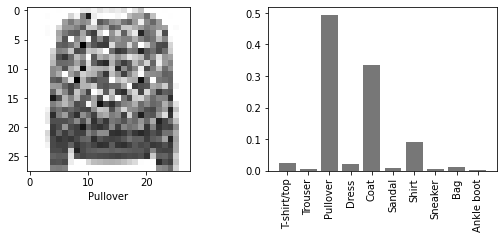

True
-------------------------------------------------


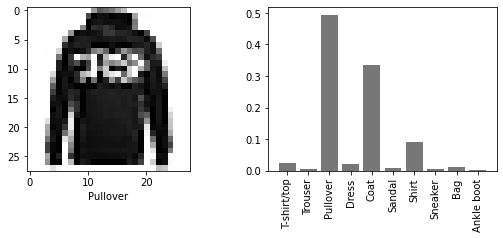

True
-------------------------------------------------


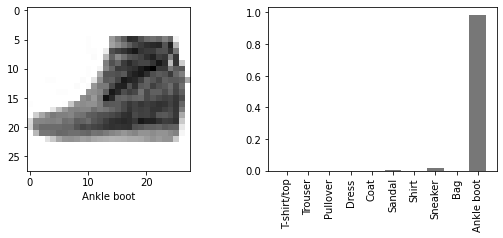

True
-------------------------------------------------


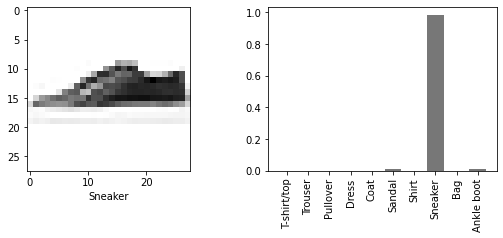

True
-------------------------------------------------


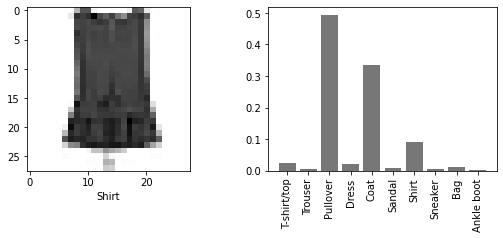

False
-------------------------------------------------


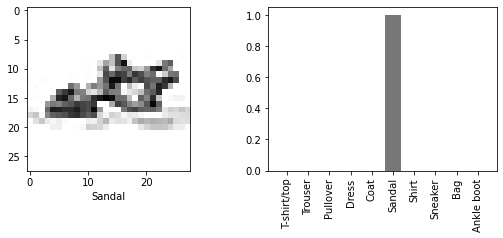

True
-------------------------------------------------


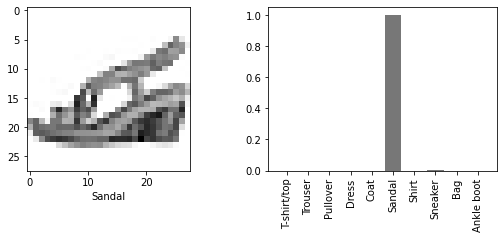

True
-------------------------------------------------


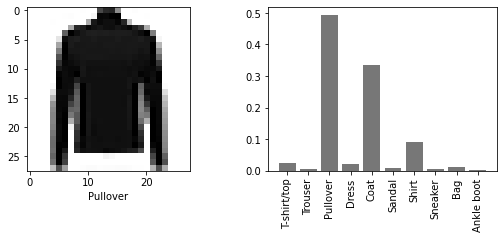

True
-------------------------------------------------


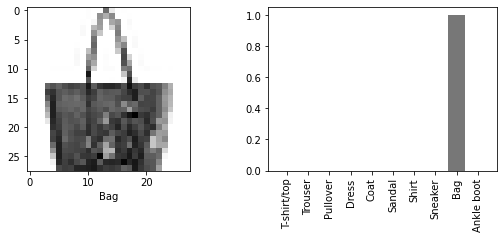

True
-------------------------------------------------


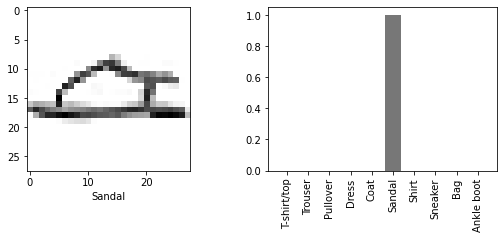

True
-------------------------------------------------


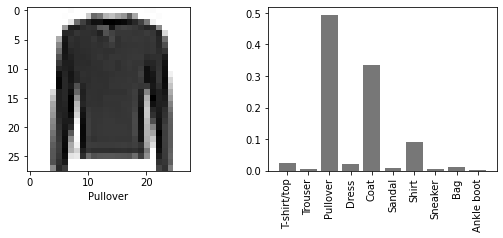

True
-------------------------------------------------


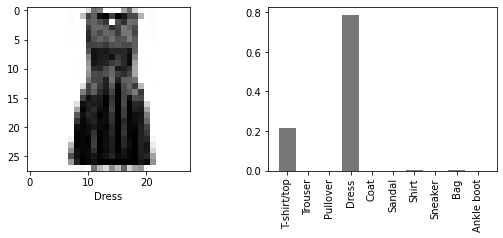

True
-------------------------------------------------


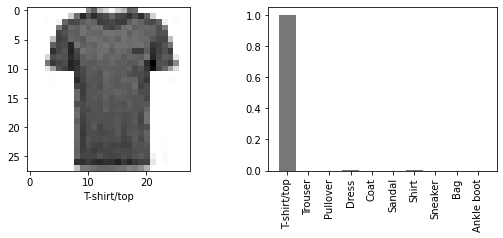

True
-------------------------------------------------


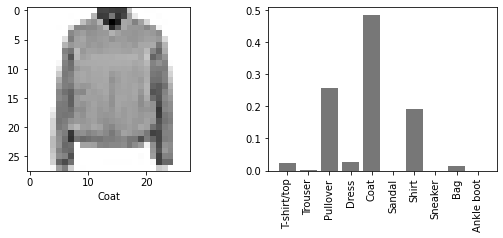

True
-------------------------------------------------


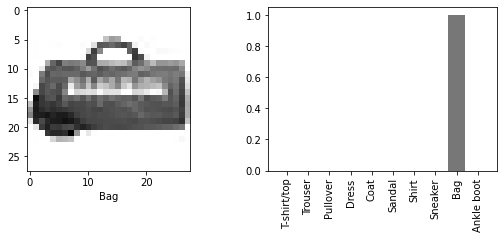

True
-------------------------------------------------


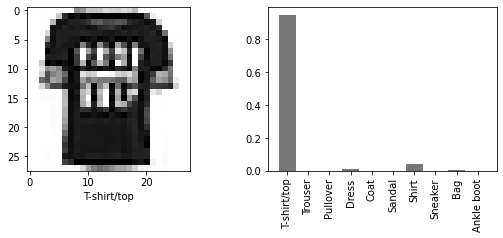

True
-------------------------------------------------


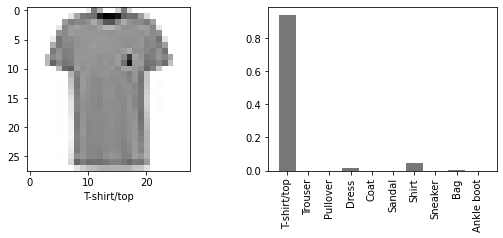

True
-------------------------------------------------


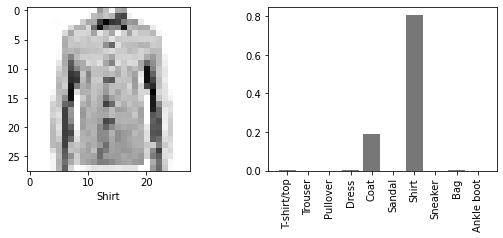

True
-------------------------------------------------


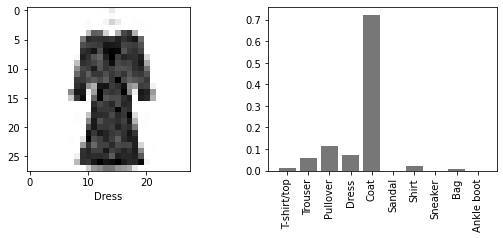

False
-------------------------------------------------


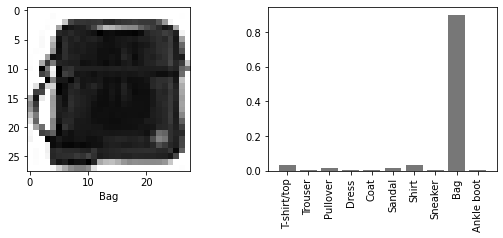

True
-------------------------------------------------


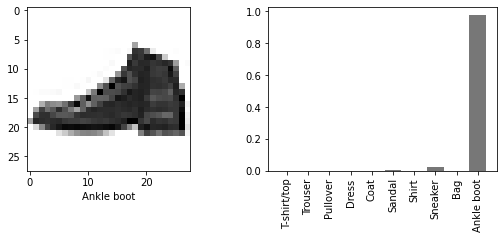

True
-------------------------------------------------


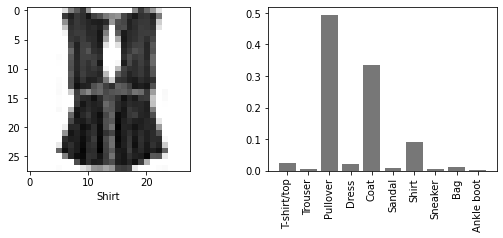

False
-------------------------------------------------


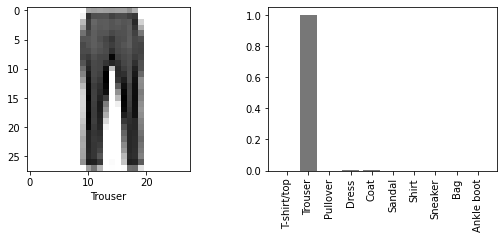

True
-------------------------------------------------


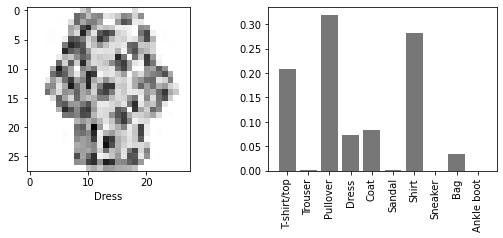

False
-------------------------------------------------


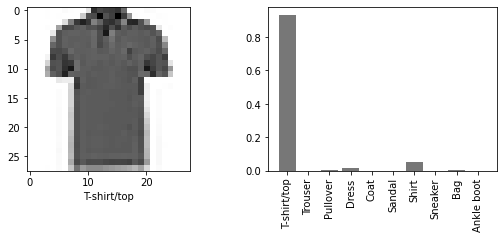

True
-------------------------------------------------


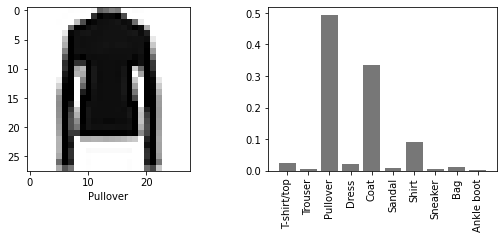

True
-------------------------------------------------


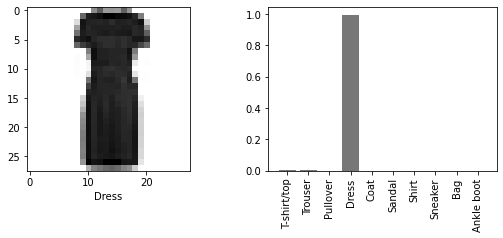

True
-------------------------------------------------


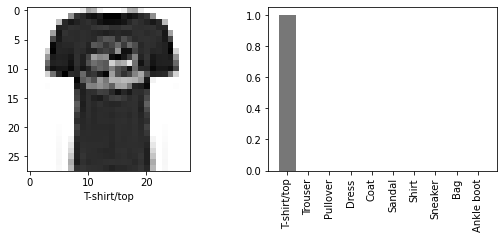

True
-------------------------------------------------


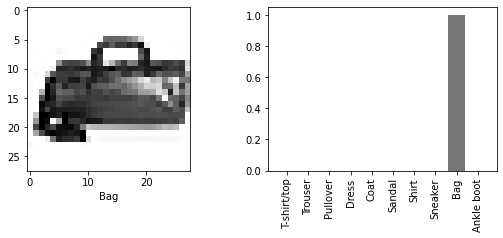

True
-------------------------------------------------


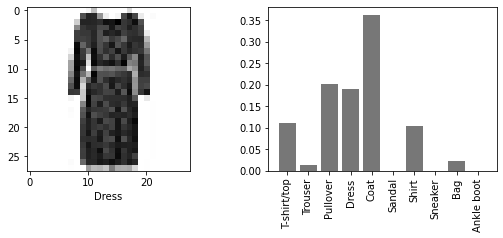

False
-------------------------------------------------


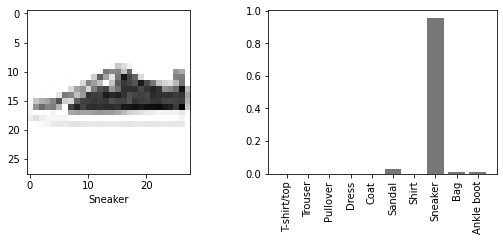

True
-------------------------------------------------


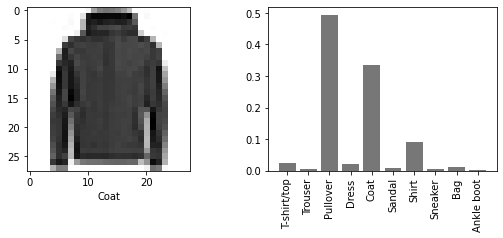

False
-------------------------------------------------


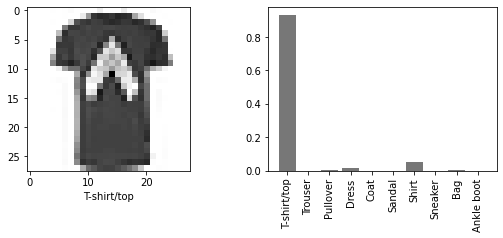

True
-------------------------------------------------


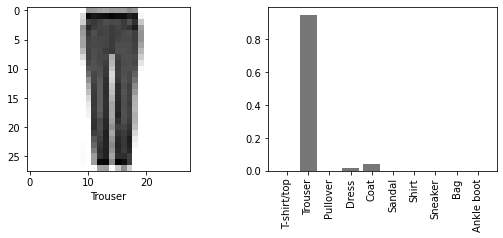

True
-------------------------------------------------


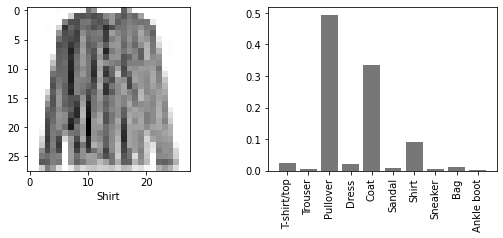

False
-------------------------------------------------


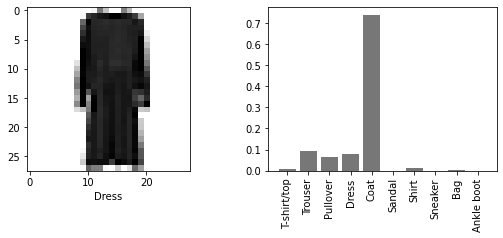

False
-------------------------------------------------


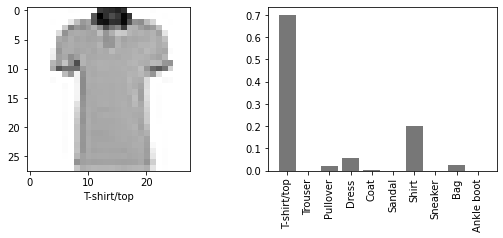

True
-------------------------------------------------


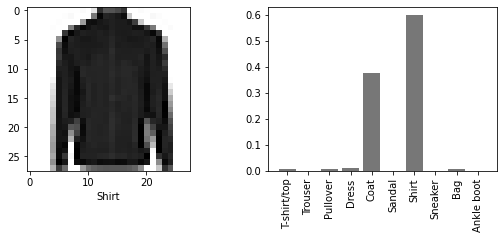

True
-------------------------------------------------


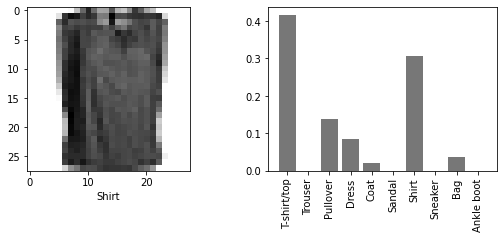

False
-------------------------------------------------


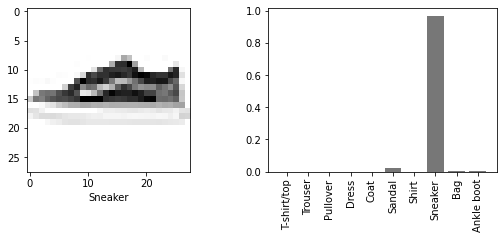

True
-------------------------------------------------


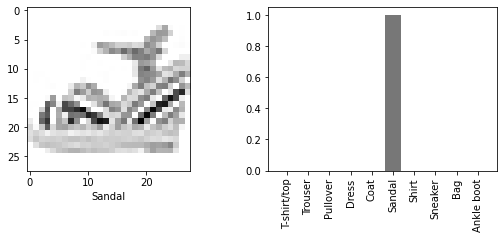

True
-------------------------------------------------


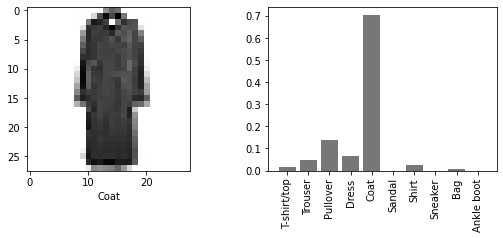

True
-------------------------------------------------


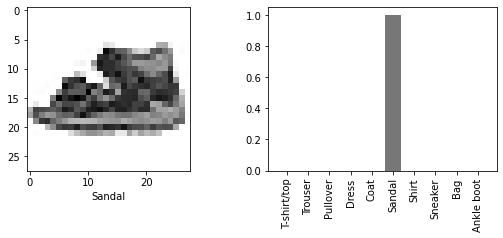

True
-------------------------------------------------


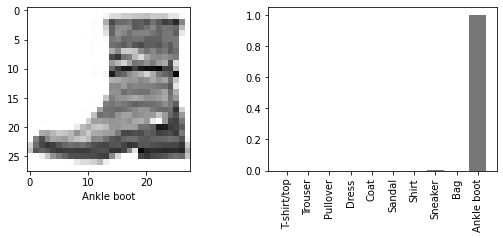

True
-------------------------------------------------


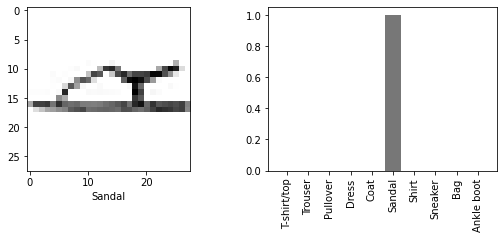

True
-------------------------------------------------


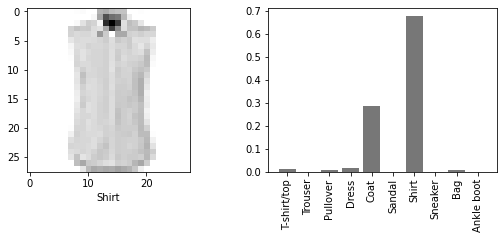

True
-------------------------------------------------


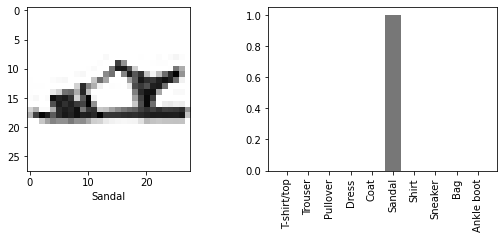

True
-------------------------------------------------


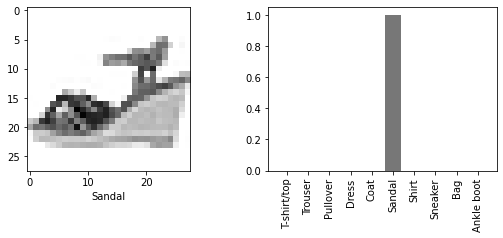

True
-------------------------------------------------


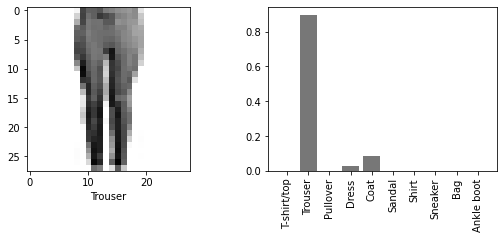

True
-------------------------------------------------


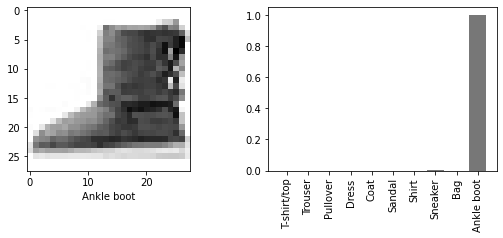

True
-------------------------------------------------


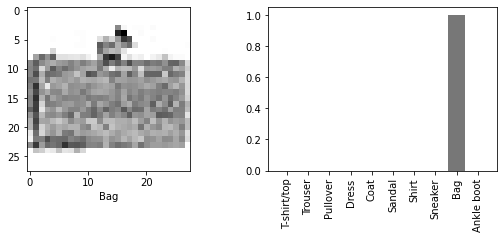

True
-------------------------------------------------


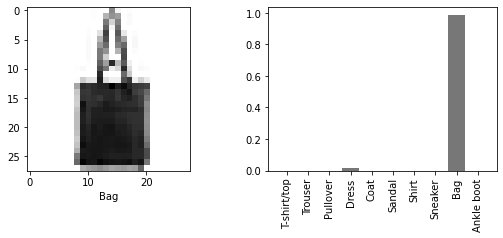

True
-------------------------------------------------


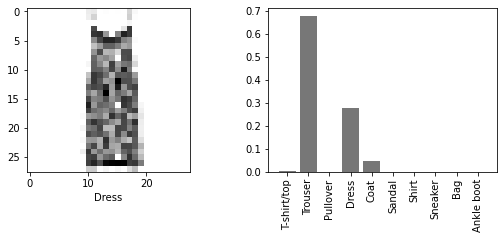

False
-------------------------------------------------


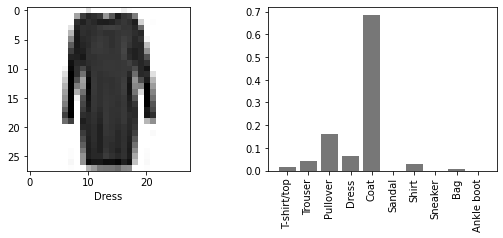

False
-------------------------------------------------


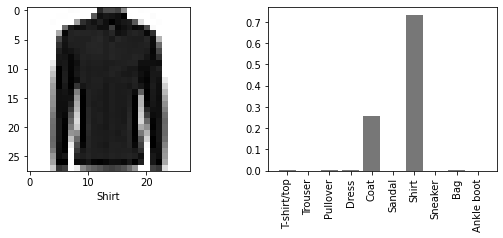

True
-------------------------------------------------


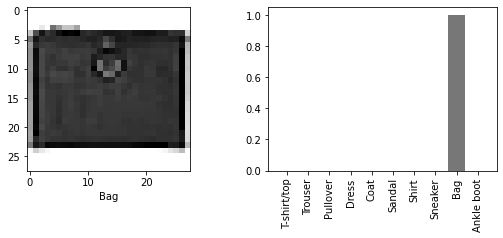

True
-------------------------------------------------


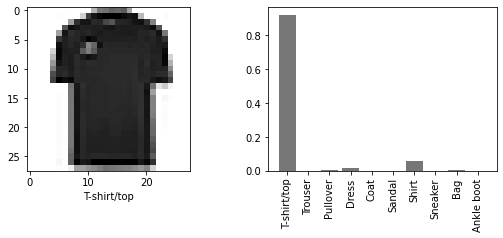

True
-------------------------------------------------


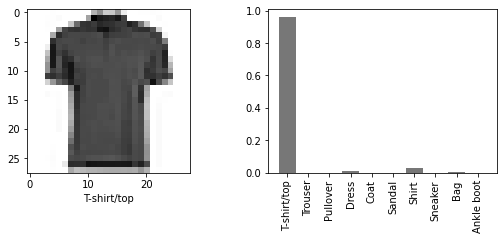

True
-------------------------------------------------


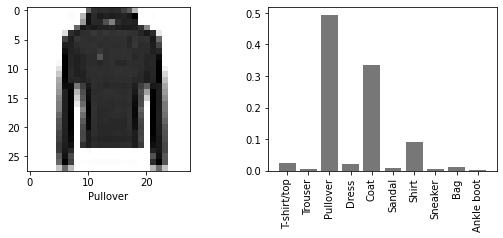

True
-------------------------------------------------


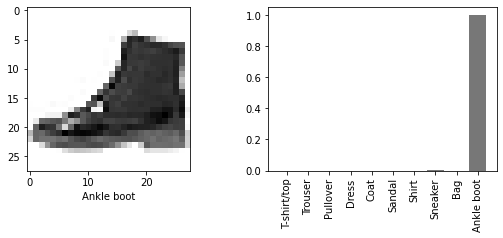

True
-------------------------------------------------


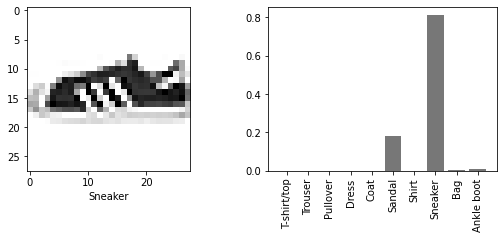

True
-------------------------------------------------


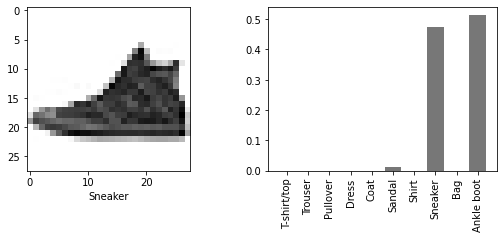

False
-------------------------------------------------


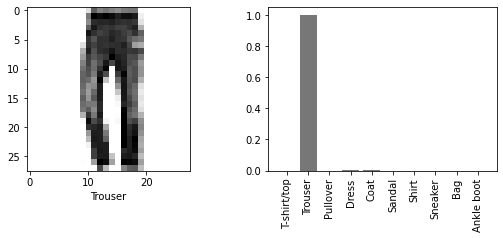

True
-------------------------------------------------


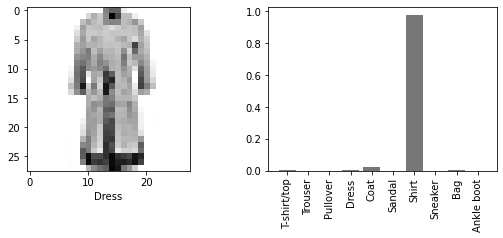

False
-------------------------------------------------


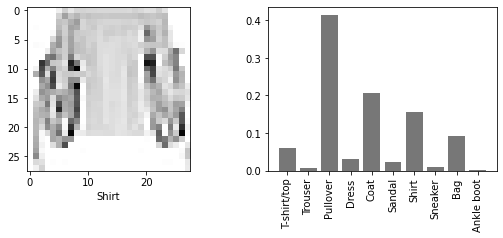

False
-------------------------------------------------


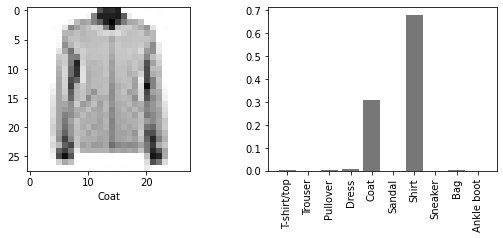

False
-------------------------------------------------


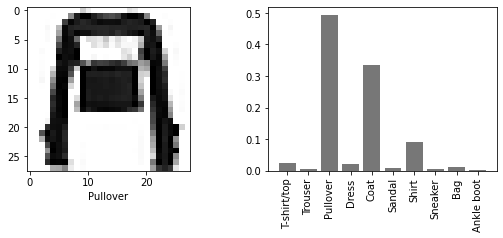

True
-------------------------------------------------


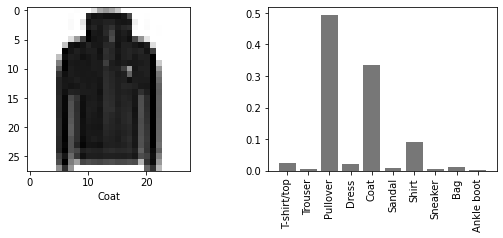

False
-------------------------------------------------


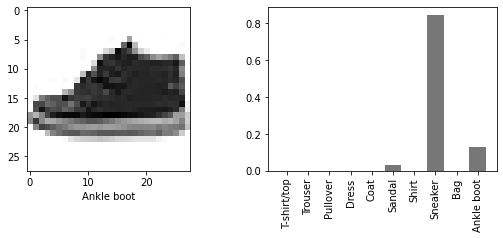

False
-------------------------------------------------


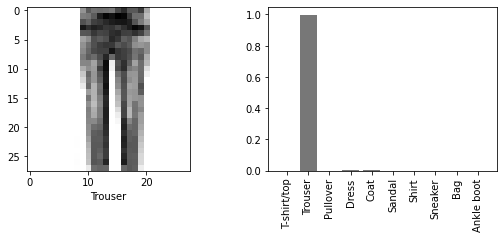

True
-------------------------------------------------


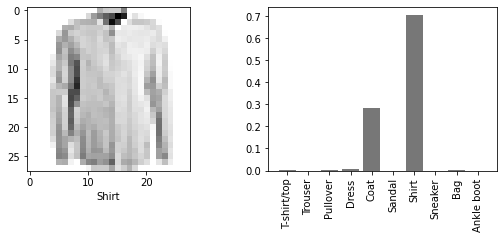

True
-------------------------------------------------


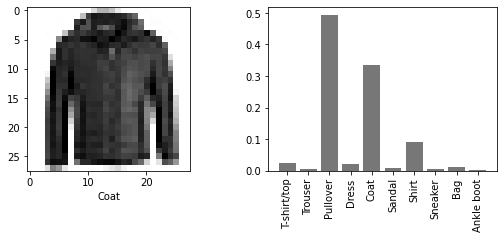

False
-------------------------------------------------


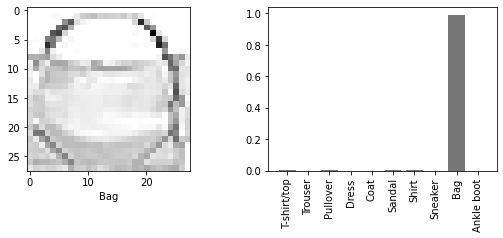

True
-------------------------------------------------


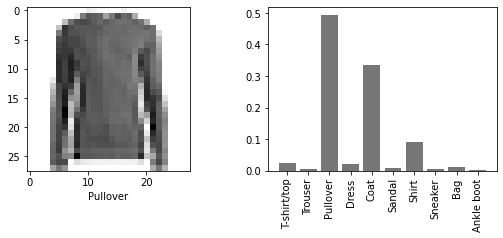

True
-------------------------------------------------


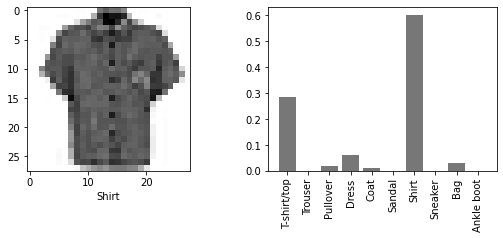

True
-------------------------------------------------


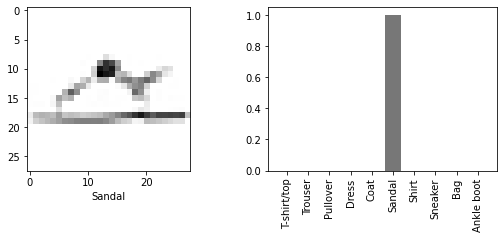

True
-------------------------------------------------


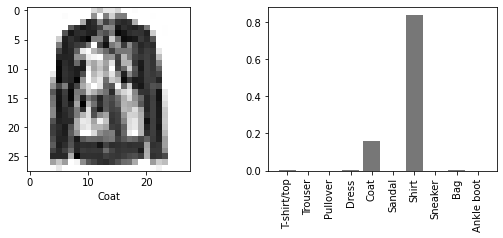

False
-------------------------------------------------


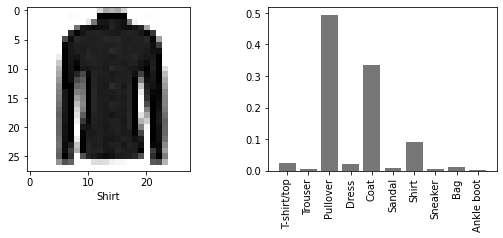

False
-------------------------------------------------


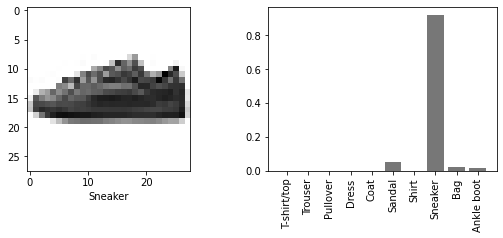

True
-------------------------------------------------


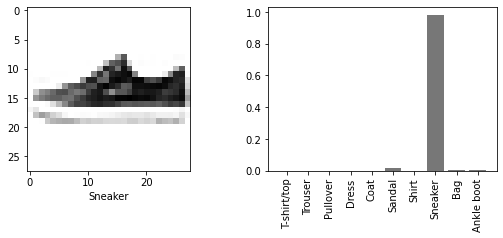

True
-------------------------------------------------


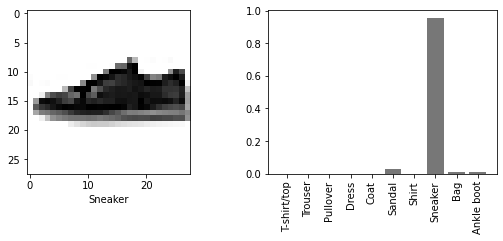

True
-------------------------------------------------


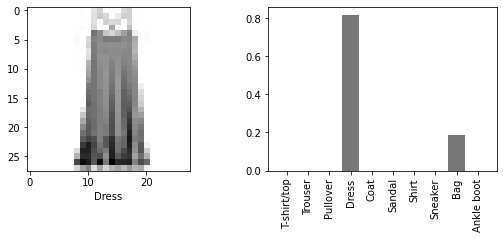

True
-------------------------------------------------


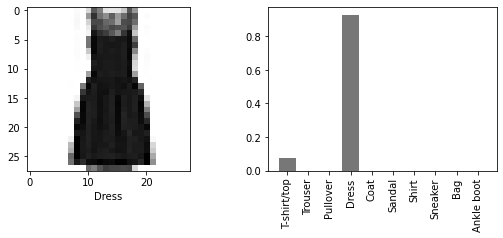

True
-------------------------------------------------


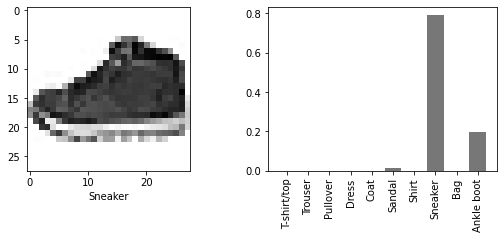

True
-------------------------------------------------


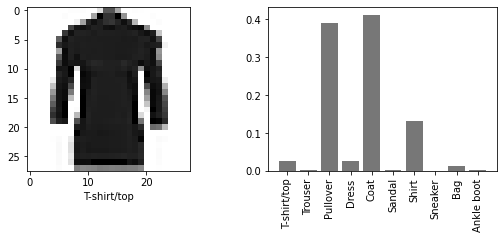

False
-------------------------------------------------


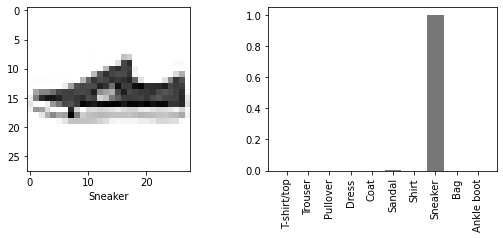

True
-------------------------------------------------


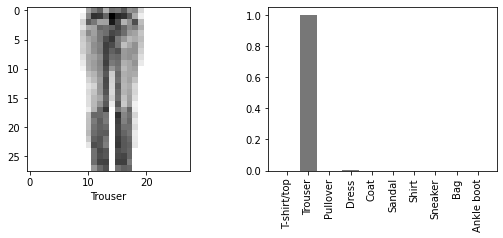

True
-------------------------------------------------


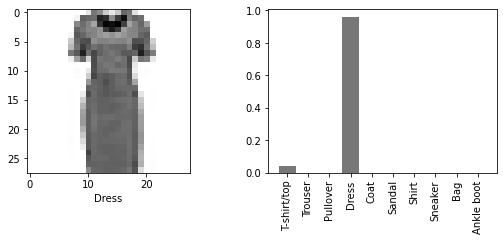

True
-------------------------------------------------


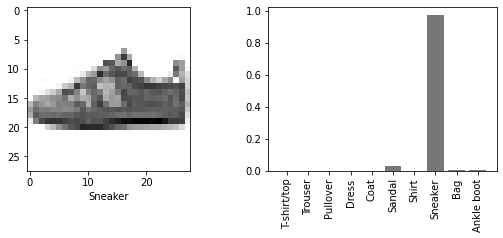

True
-------------------------------------------------


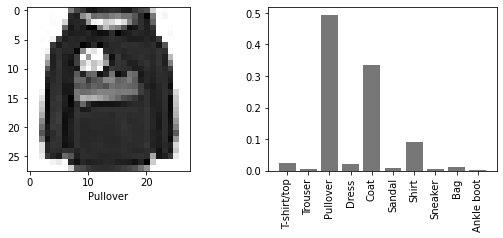

True
-------------------------------------------------


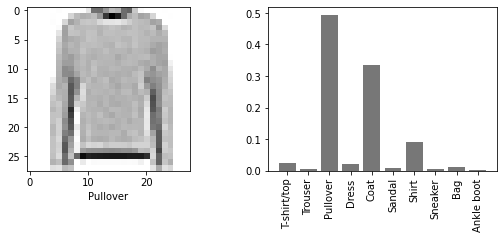

True
-------------------------------------------------


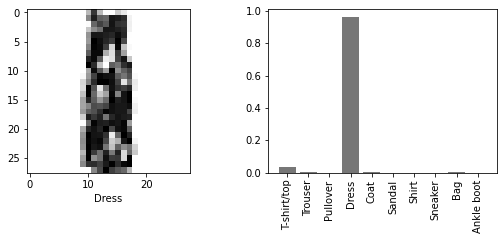

True
-------------------------------------------------


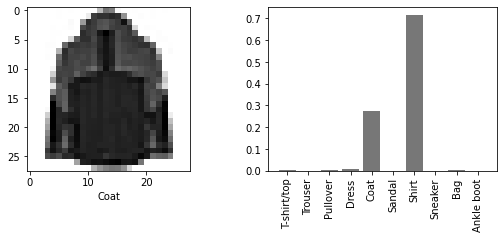

False
-------------------------------------------------


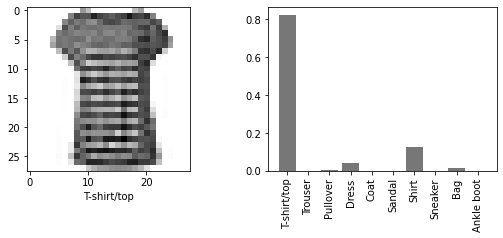

True
-------------------------------------------------


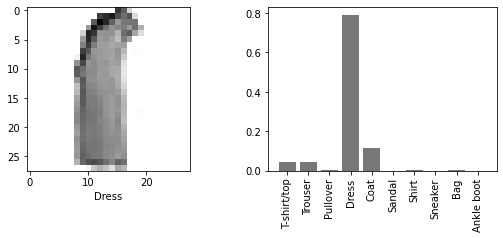

True
-------------------------------------------------


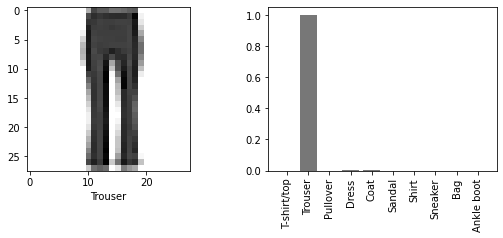

True
-------------------------------------------------


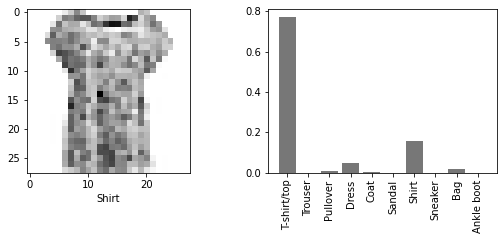

False
-------------------------------------------------


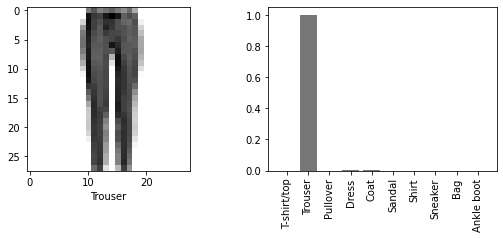

True
-------------------------------------------------


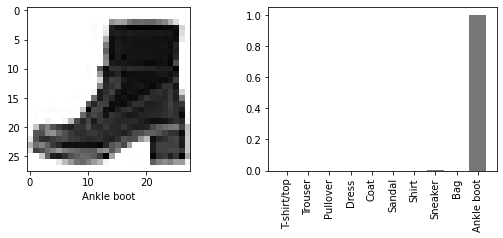

True
-------------------------------------------------


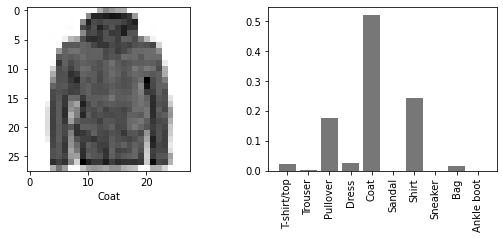

True
-------------------------------------------------


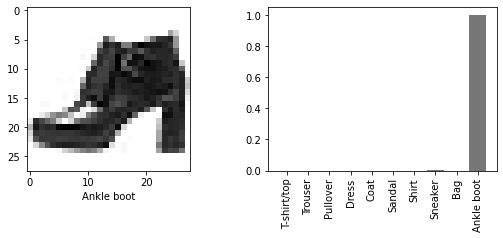

True
-------------------------------------------------


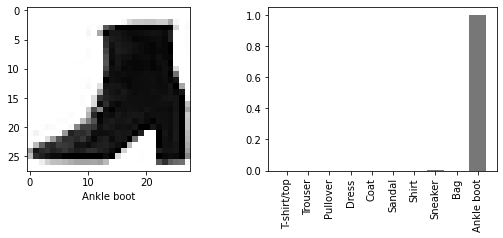

True
-------------------------------------------------


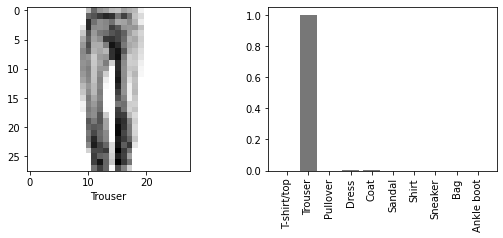

True
-------------------------------------------------


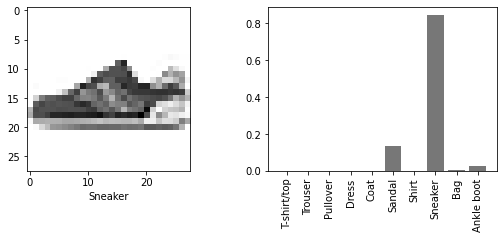

True
-------------------------------------------------


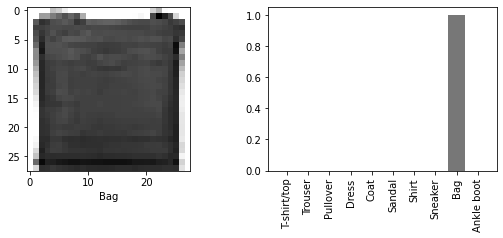

True
-------------------------------------------------


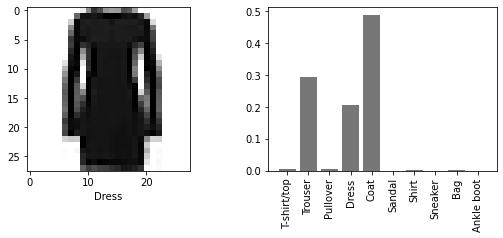

False
-------------------------------------------------


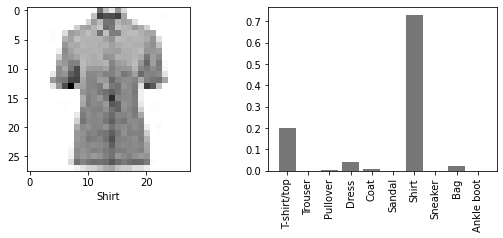

True
-------------------------------------------------


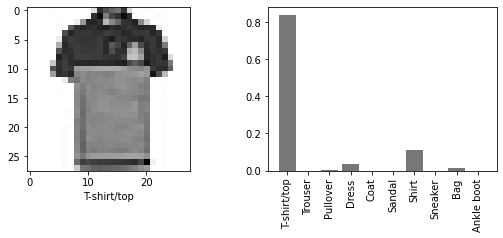

True
-------------------------------------------------


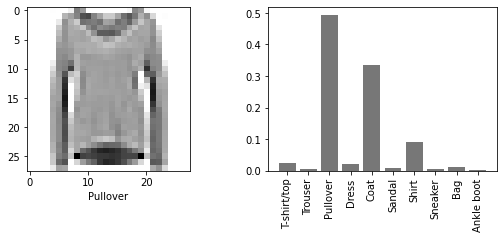

True
-------------------------------------------------


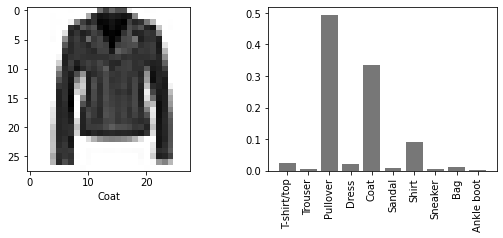

False
-------------------------------------------------


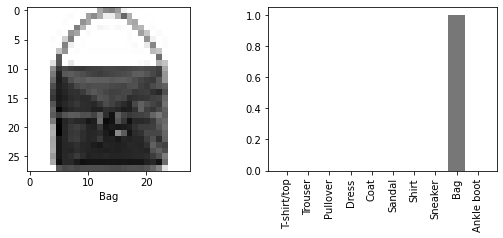

True
-------------------------------------------------


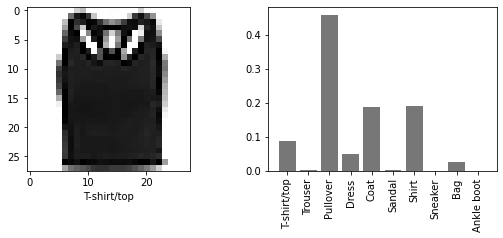

False
-------------------------------------------------


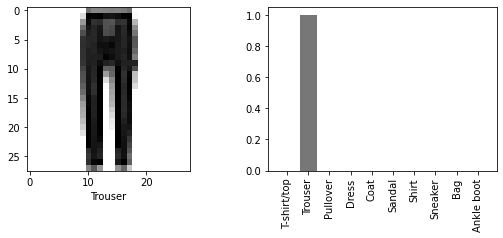

True
-------------------------------------------------


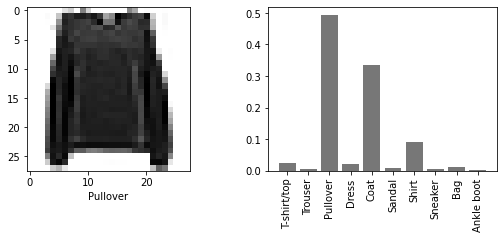

True
-------------------------------------------------


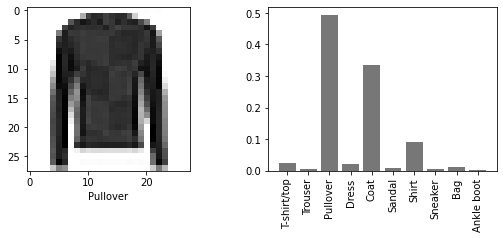

True
-------------------------------------------------


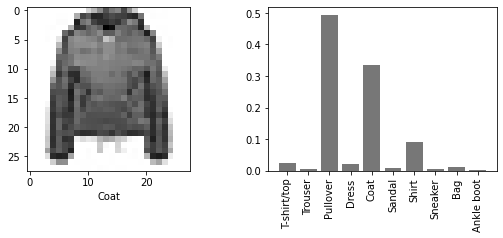

False
-------------------------------------------------


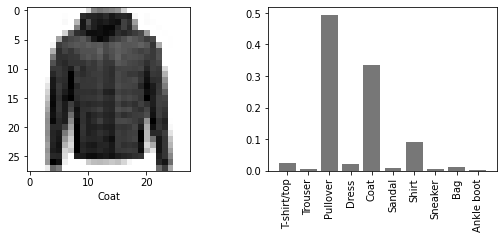

False
-------------------------------------------------


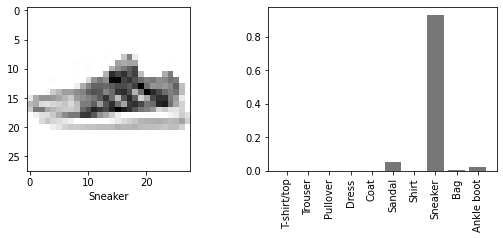

True
-------------------------------------------------


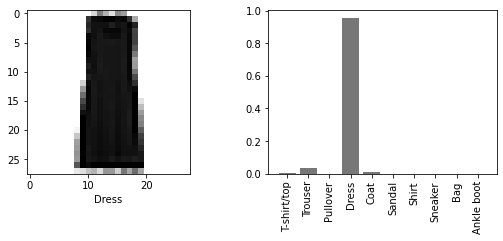

True
-------------------------------------------------


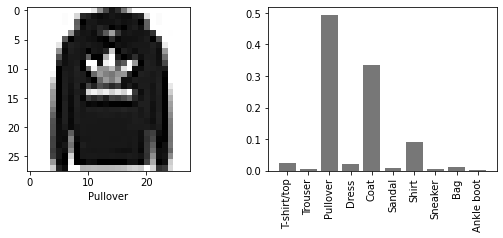

True
-------------------------------------------------


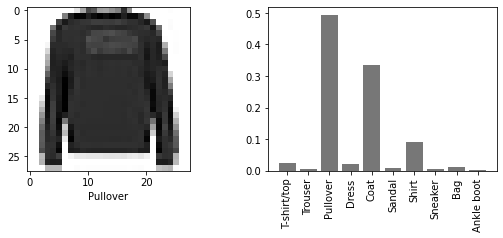

True
-------------------------------------------------


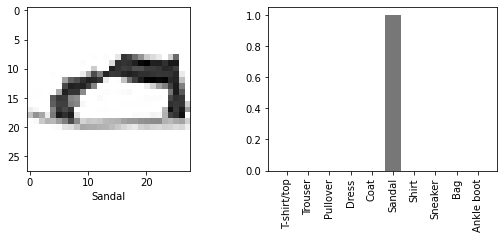

True
-------------------------------------------------


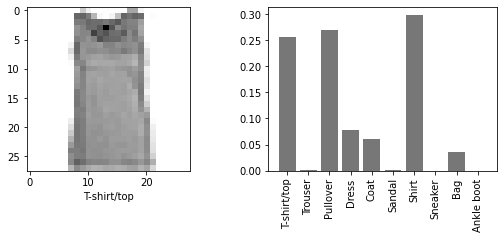

False
-------------------------------------------------


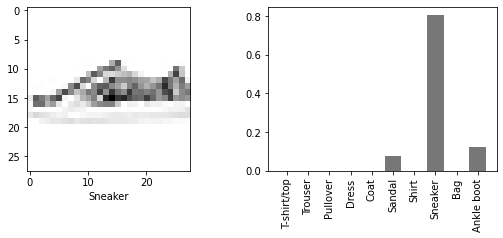

True
-------------------------------------------------


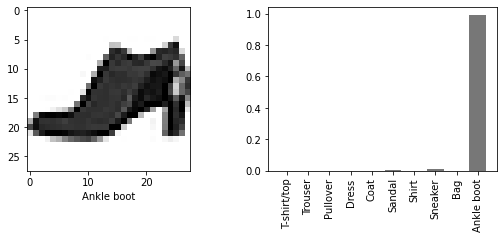

True
-------------------------------------------------


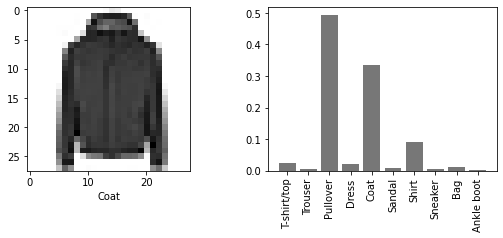

False
-------------------------------------------------


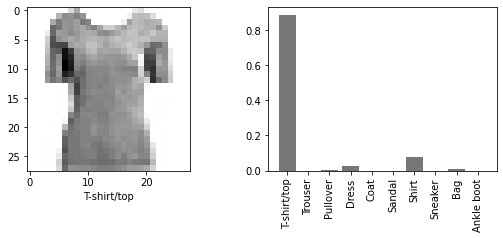

True
-------------------------------------------------


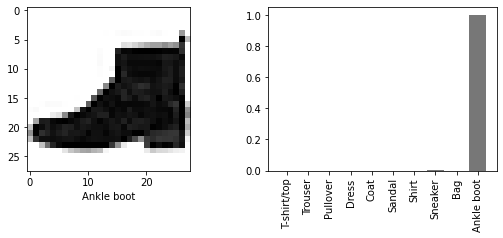

True
-------------------------------------------------


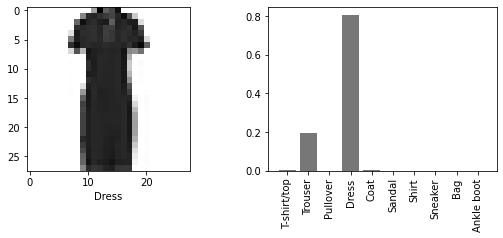

True
-------------------------------------------------


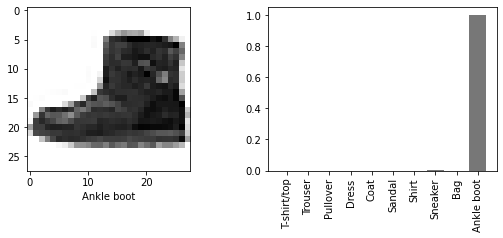

True
-------------------------------------------------


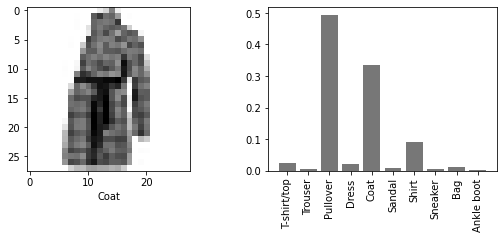

False
-------------------------------------------------


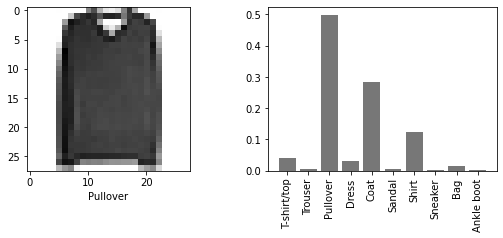

True
-------------------------------------------------


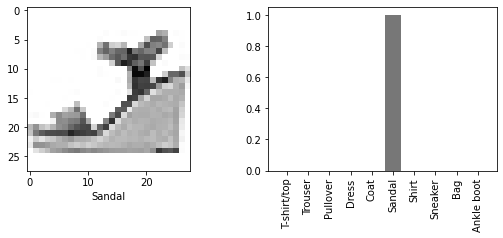

True
-------------------------------------------------


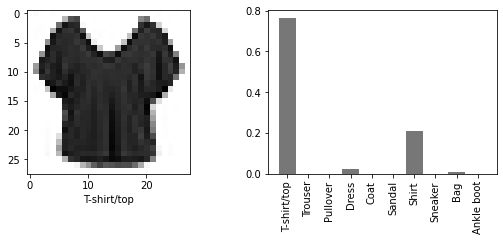

True
-------------------------------------------------


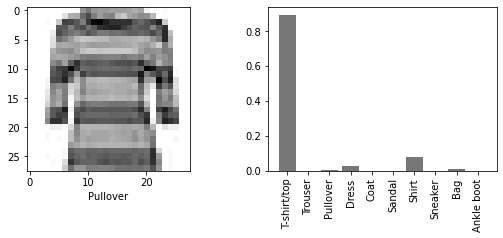

False
-------------------------------------------------


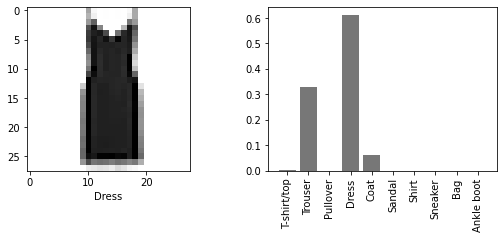

True
-------------------------------------------------


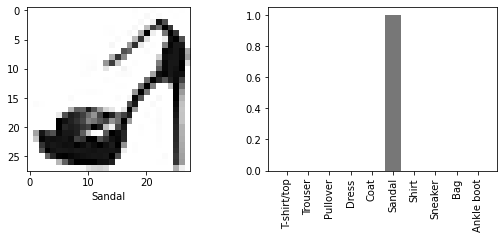

True
-------------------------------------------------


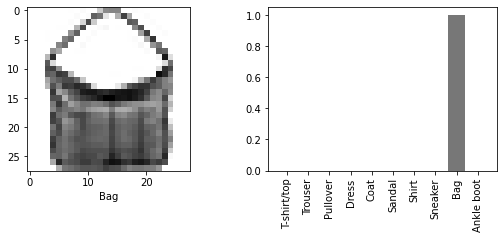

True
-------------------------------------------------


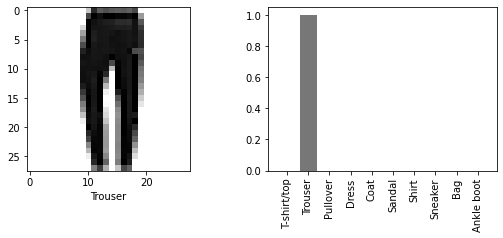

True
-------------------------------------------------


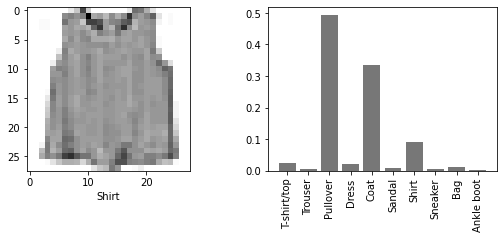

False
-------------------------------------------------


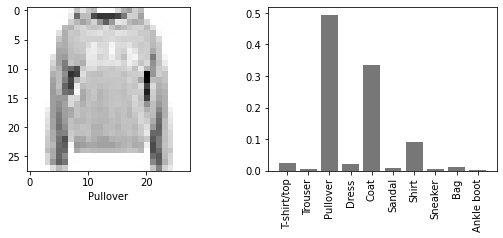

True
-------------------------------------------------


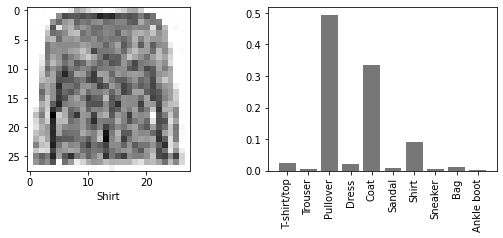

False
-------------------------------------------------


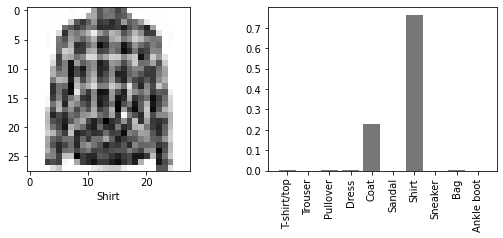

True
-------------------------------------------------


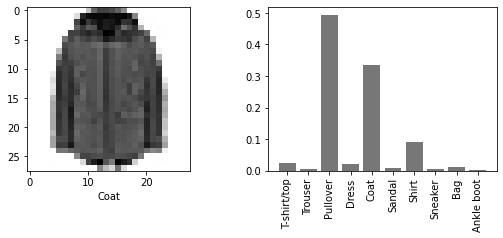

False
-------------------------------------------------


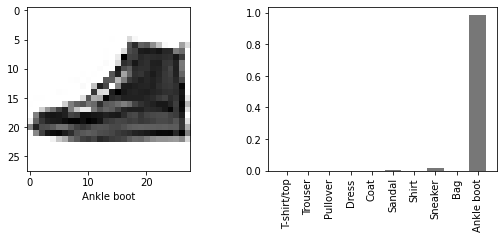

True
-------------------------------------------------


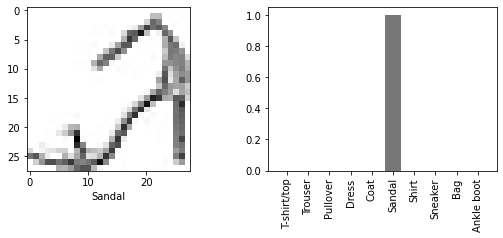

True
-------------------------------------------------


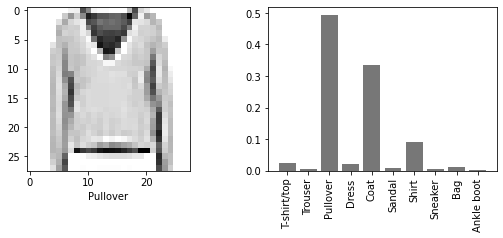

True
-------------------------------------------------


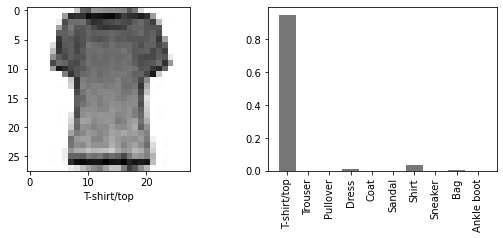

True
-------------------------------------------------


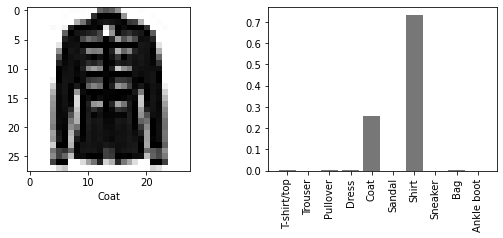

False
-------------------------------------------------


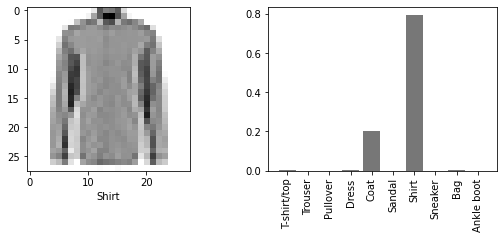

True
-------------------------------------------------


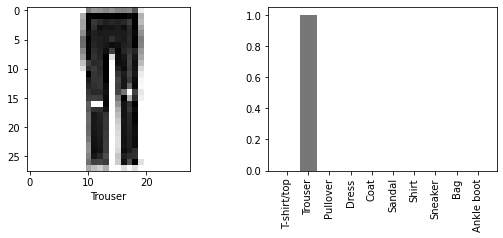

True
-------------------------------------------------


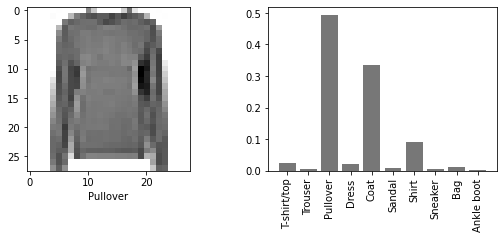

True
-------------------------------------------------


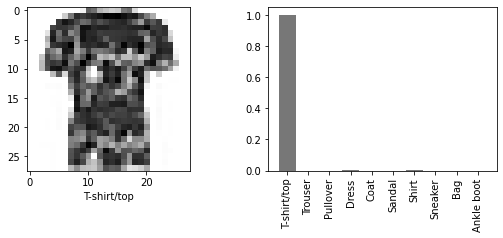

True
-------------------------------------------------


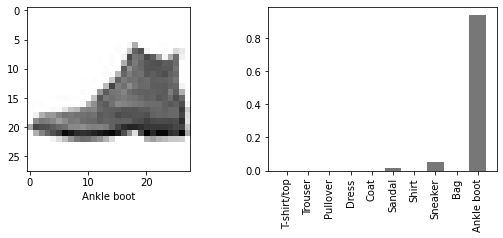

True
-------------------------------------------------


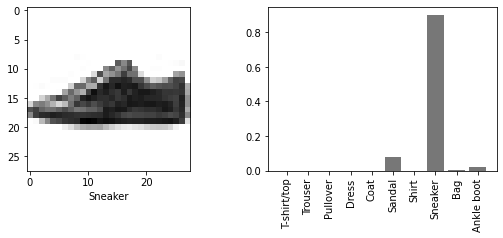

True
-------------------------------------------------


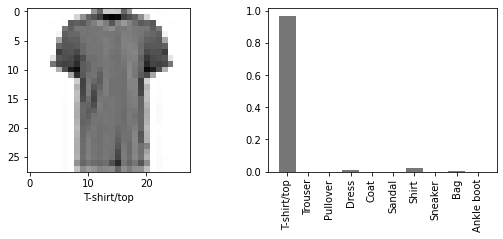

True
-------------------------------------------------


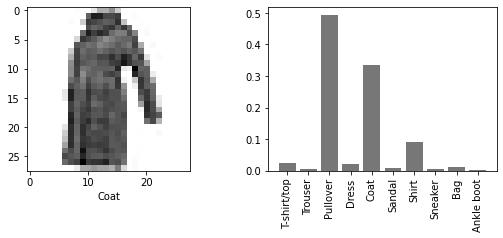

False
-------------------------------------------------


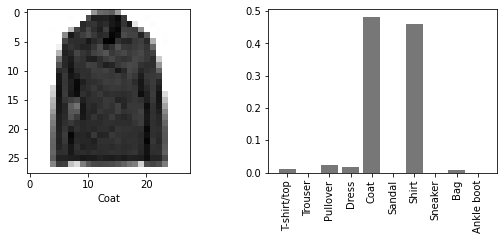

True
-------------------------------------------------


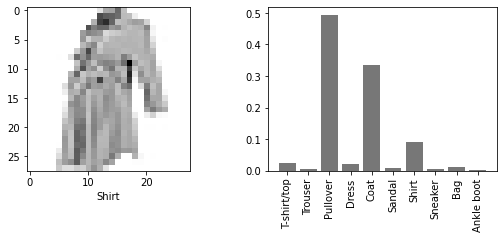

False
-------------------------------------------------


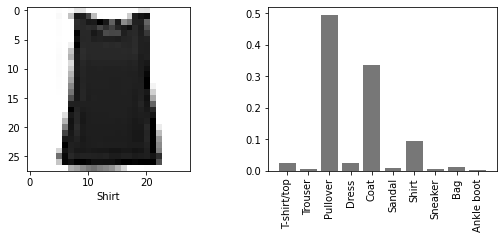

False
-------------------------------------------------


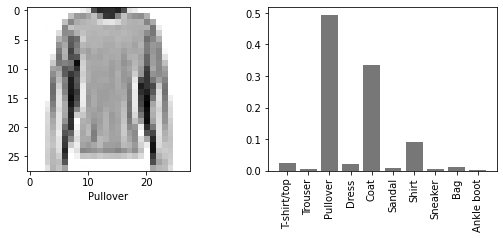

True
-------------------------------------------------


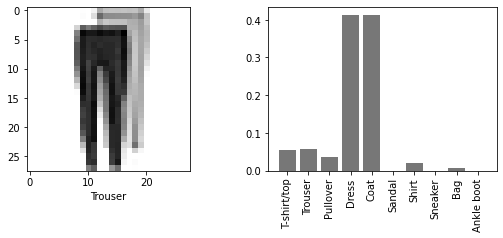

False
-------------------------------------------------


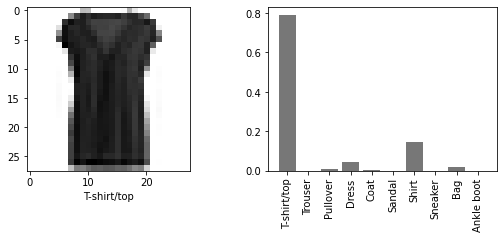

True
-------------------------------------------------


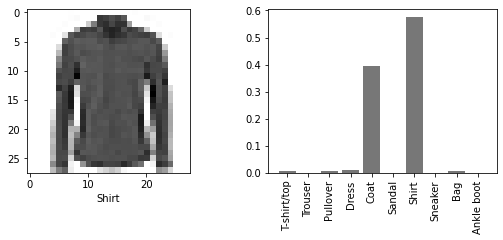

True
-------------------------------------------------


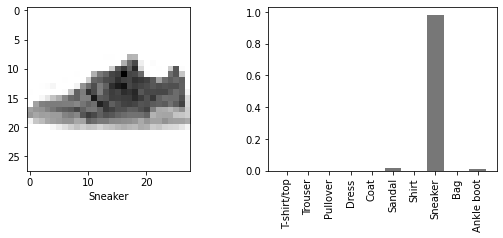

True
-------------------------------------------------


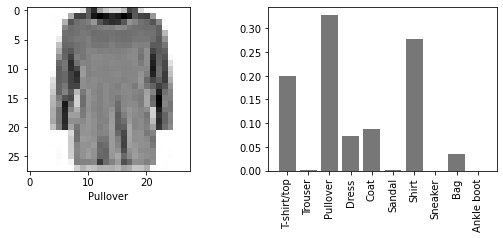

True
-------------------------------------------------


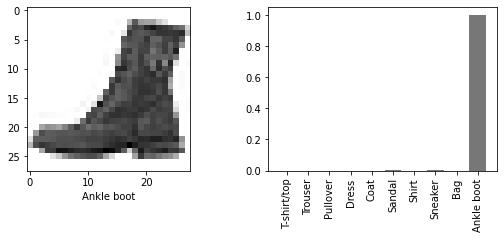

True
-------------------------------------------------


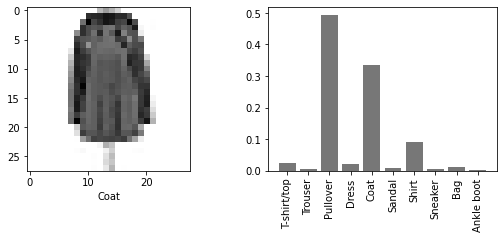

False
-------------------------------------------------


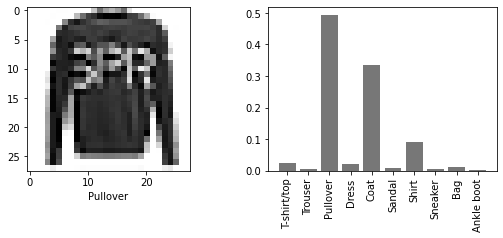

True
-------------------------------------------------


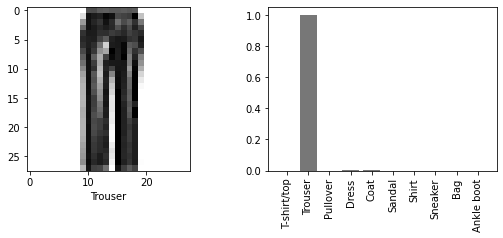

True
-------------------------------------------------


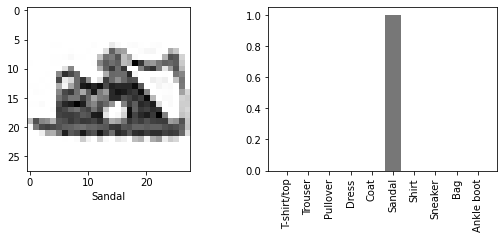

True
-------------------------------------------------


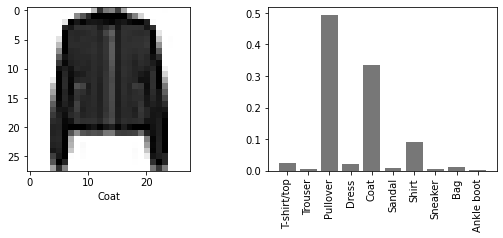

False
-------------------------------------------------


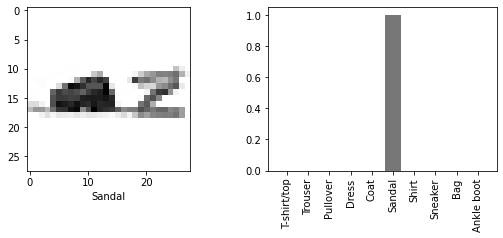

True
-------------------------------------------------


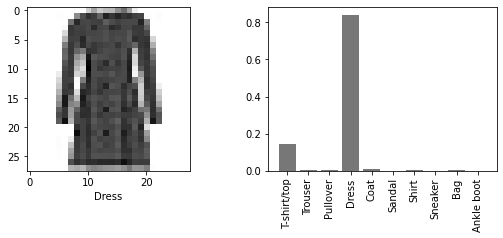

True
-------------------------------------------------


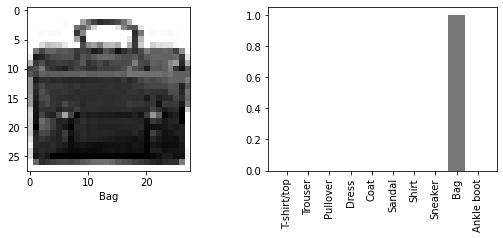

True
-------------------------------------------------


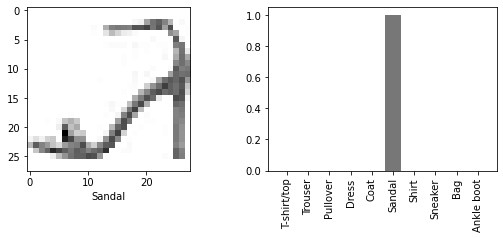

True
-------------------------------------------------


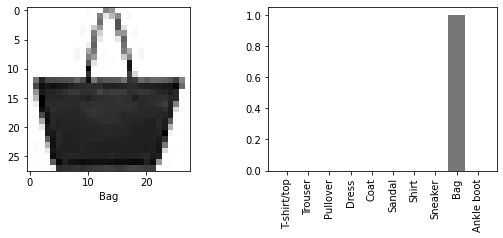

True
-------------------------------------------------


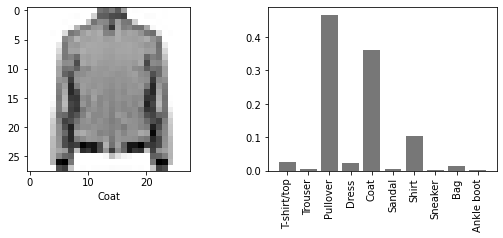

False
-------------------------------------------------


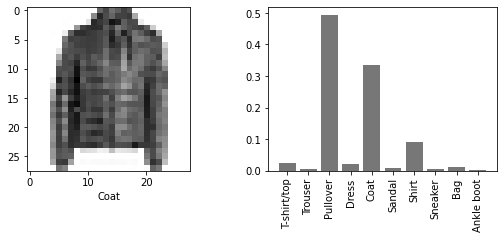

False
-------------------------------------------------


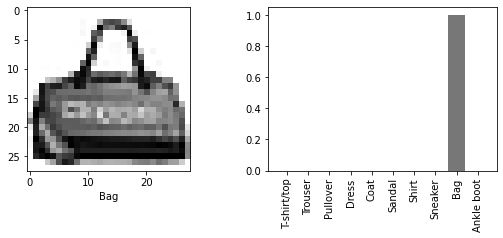

True
-------------------------------------------------


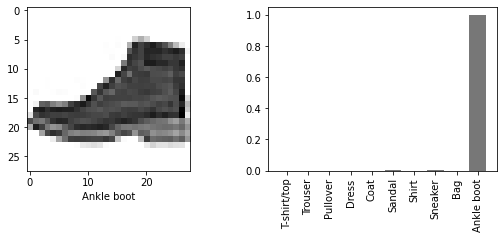

True
-------------------------------------------------


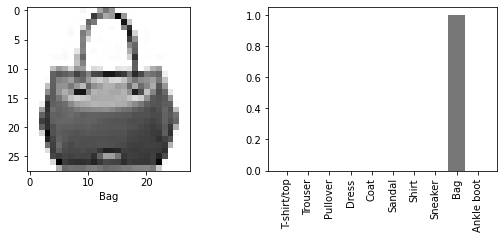

True
-------------------------------------------------


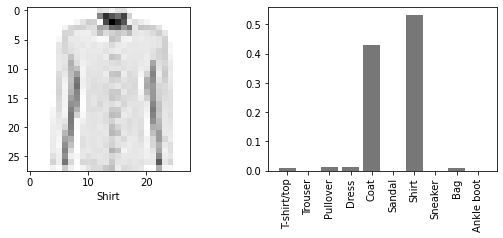

True
-------------------------------------------------


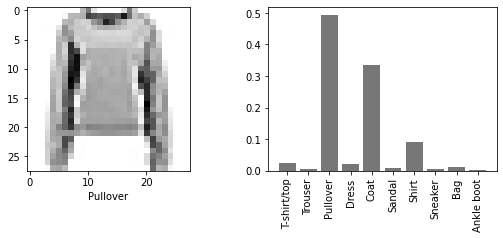

True
-------------------------------------------------


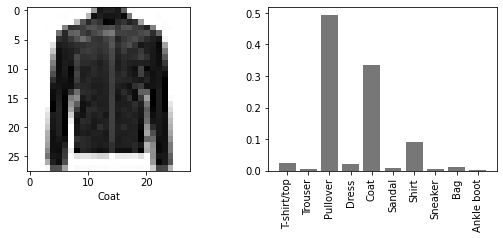

False
-------------------------------------------------


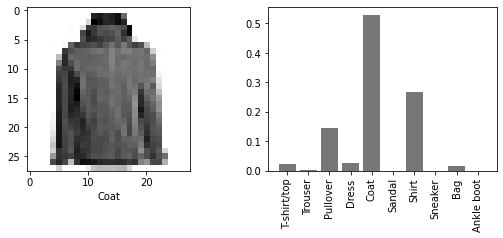

True
-------------------------------------------------


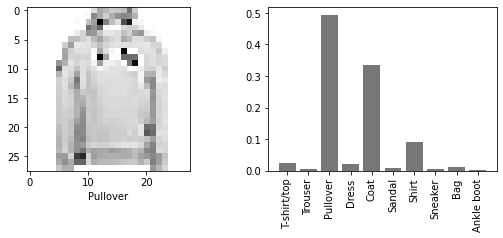

True
-------------------------------------------------


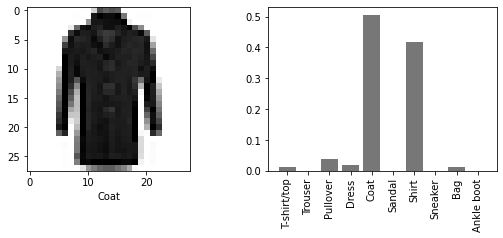

True
-------------------------------------------------


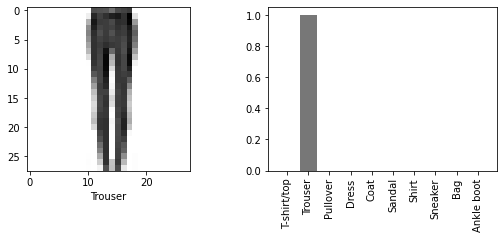

True
-------------------------------------------------


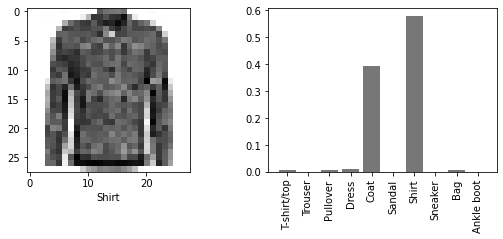

True
-------------------------------------------------


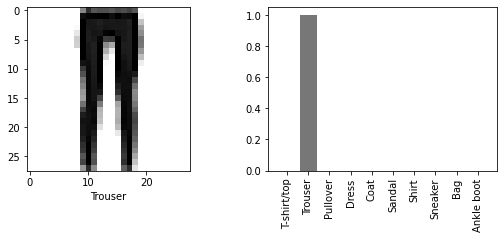

True
-------------------------------------------------


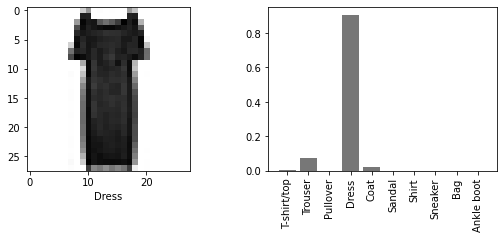

True
-------------------------------------------------


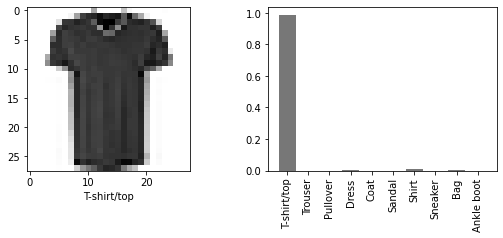

True
-------------------------------------------------


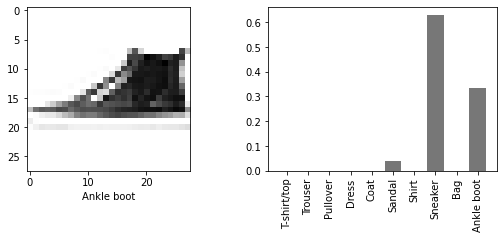

False
-------------------------------------------------


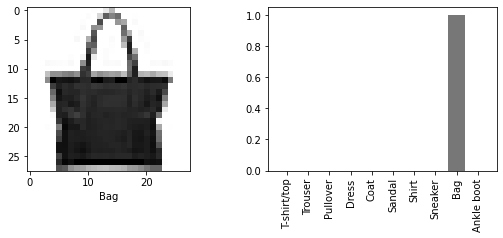

True
-------------------------------------------------


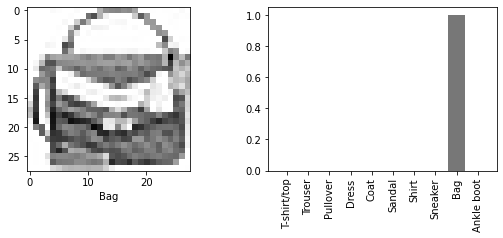

True
-------------------------------------------------


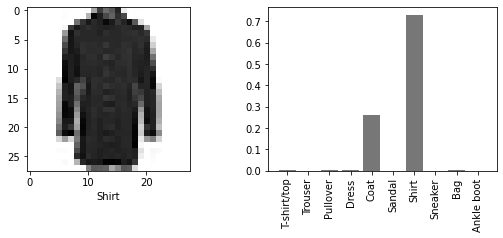

True
-------------------------------------------------


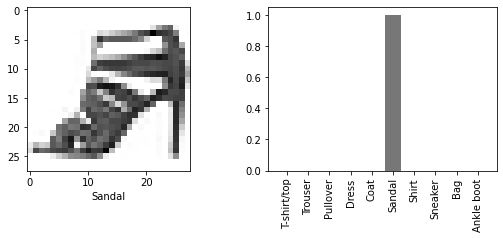

True
-------------------------------------------------


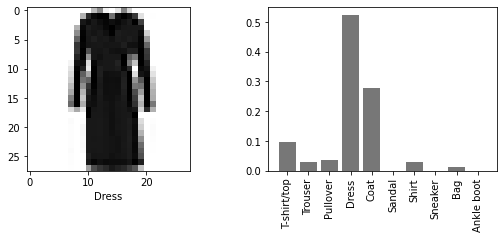

True
-------------------------------------------------


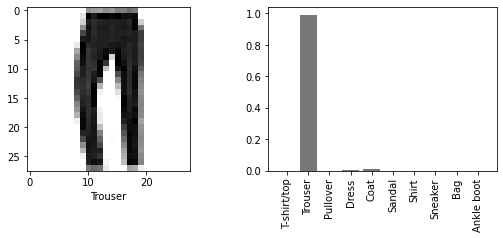

True
-------------------------------------------------


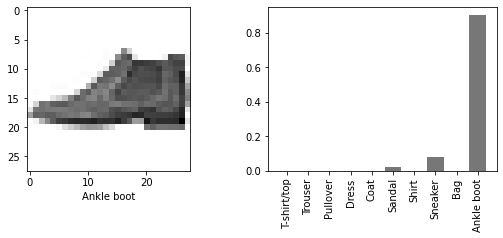

True
-------------------------------------------------


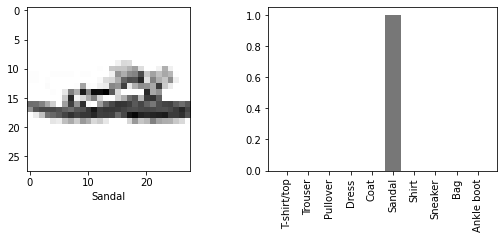

True
-------------------------------------------------


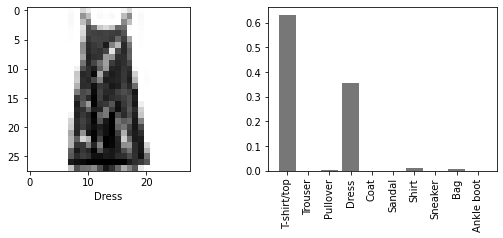

False
-------------------------------------------------


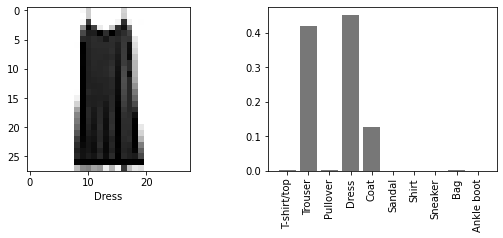

True
-------------------------------------------------


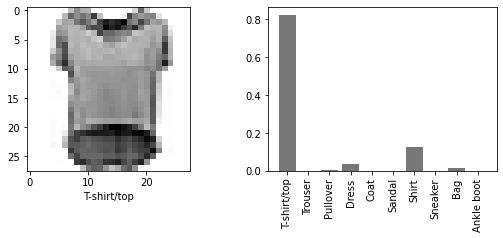

True
-------------------------------------------------


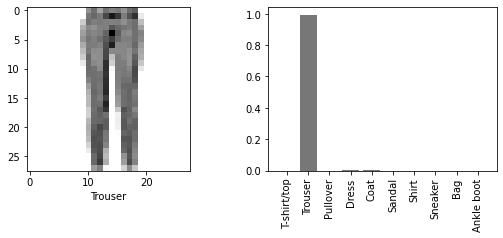

True
-------------------------------------------------


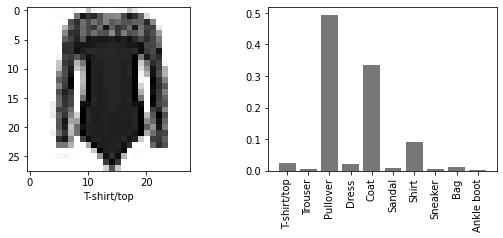

False
-------------------------------------------------


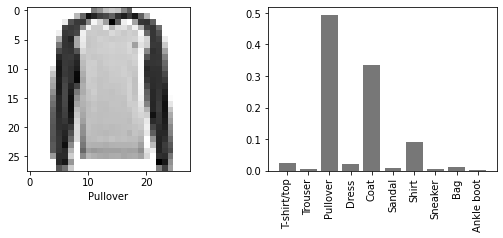

True
-------------------------------------------------


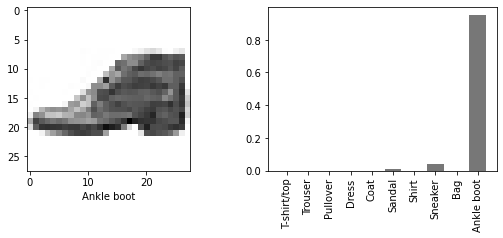

True
-------------------------------------------------


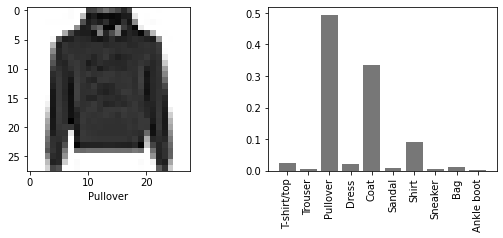

True
-------------------------------------------------


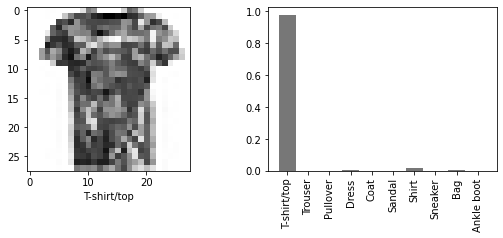

True
-------------------------------------------------


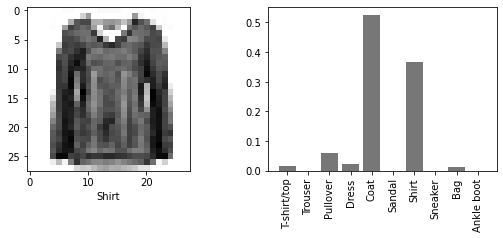

False
-------------------------------------------------


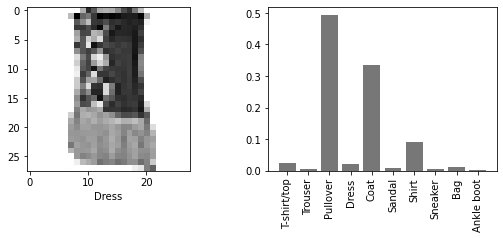

False
-------------------------------------------------


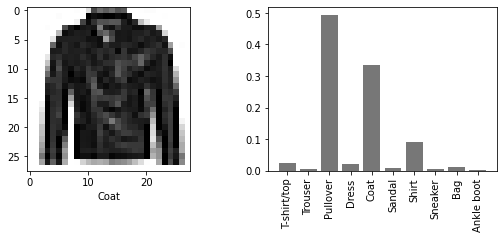

False
-------------------------------------------------


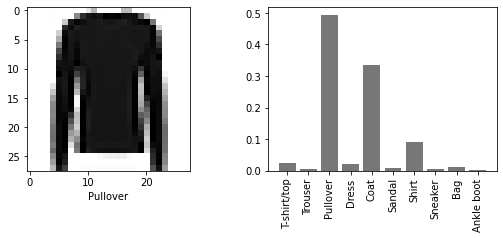

True
-------------------------------------------------


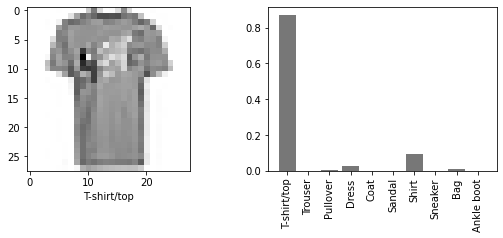

True
-------------------------------------------------


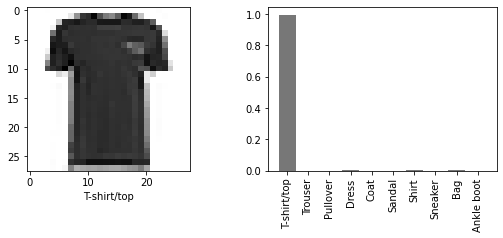

True
-------------------------------------------------


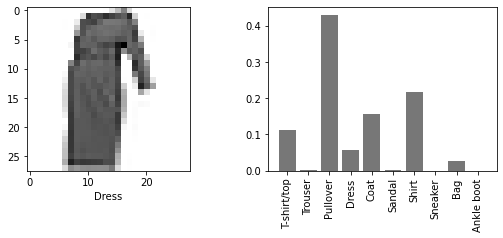

False
-------------------------------------------------


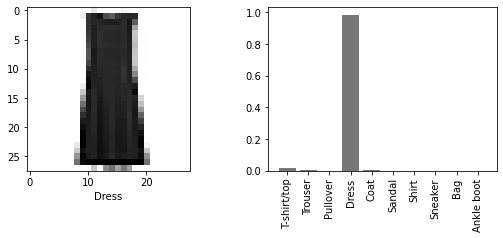

True
-------------------------------------------------


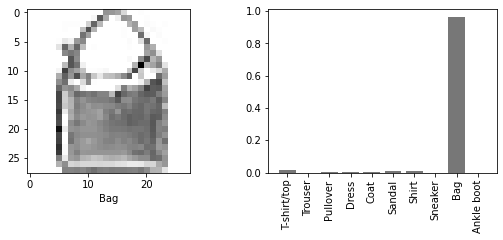

True
-------------------------------------------------


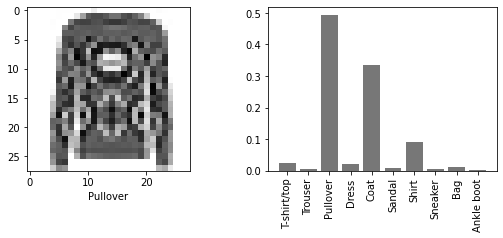

True
-------------------------------------------------


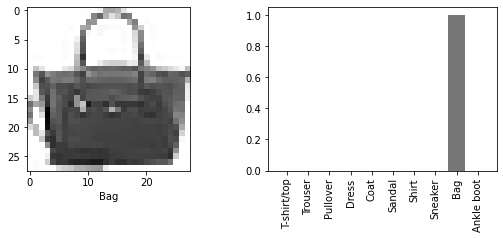

True
-------------------------------------------------


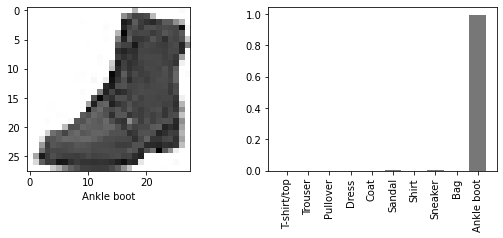

True
-------------------------------------------------


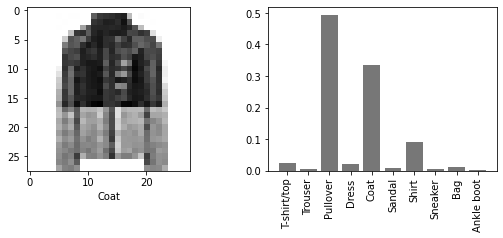

False
-------------------------------------------------


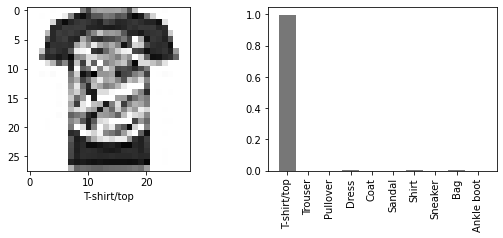

True
-------------------------------------------------


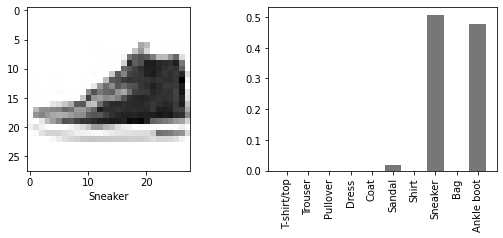

True
-------------------------------------------------


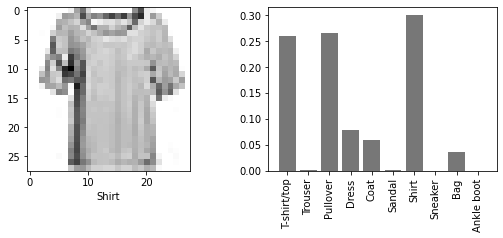

True
-------------------------------------------------


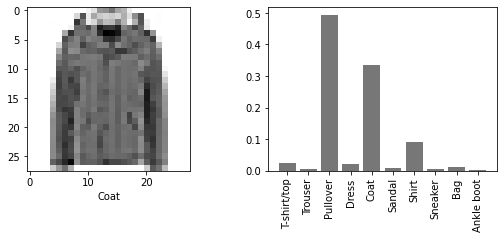

False
-------------------------------------------------


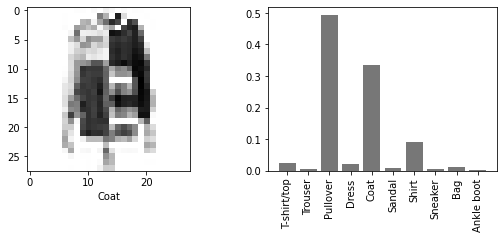

False
-------------------------------------------------


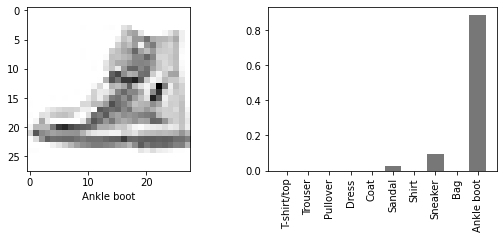

True
-------------------------------------------------


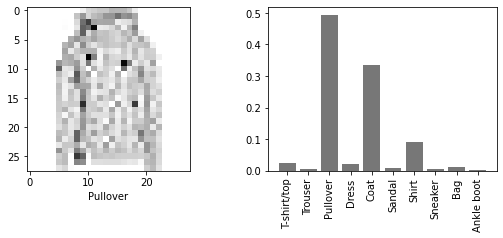

True
-------------------------------------------------


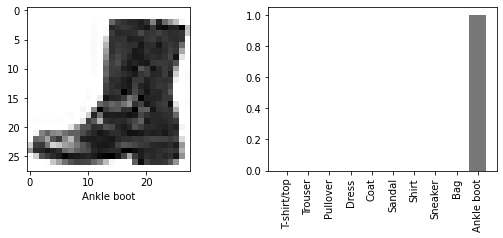

True
-------------------------------------------------


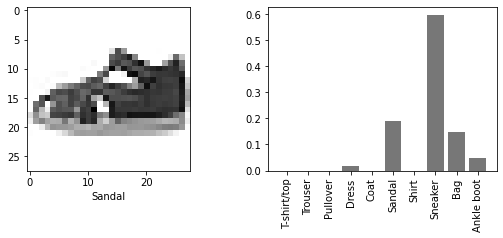

False
-------------------------------------------------


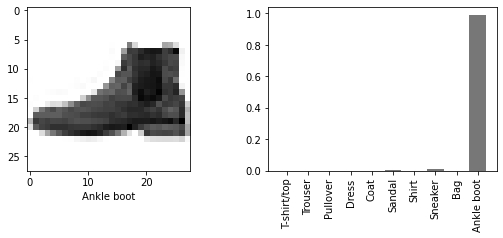

True
-------------------------------------------------


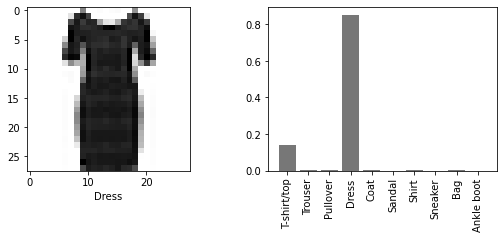

True
-------------------------------------------------


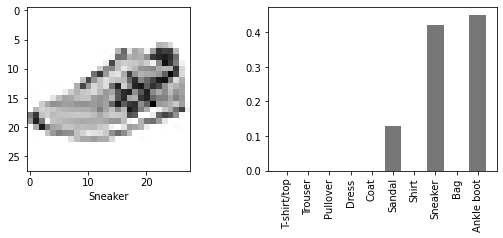

False
-------------------------------------------------


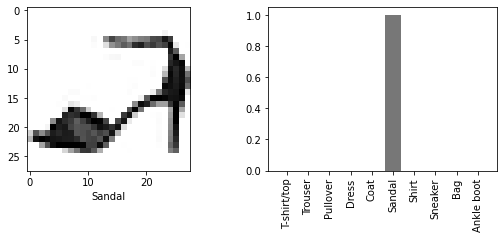

True
-------------------------------------------------


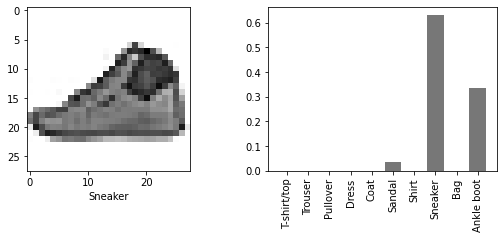

True
-------------------------------------------------


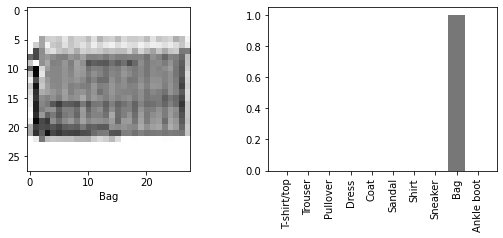

True
-------------------------------------------------


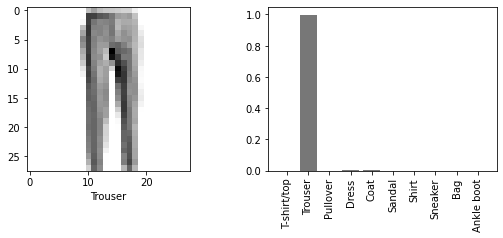

True
-------------------------------------------------


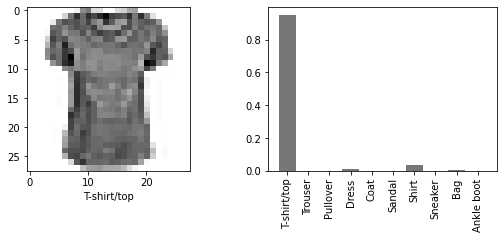

True
-------------------------------------------------


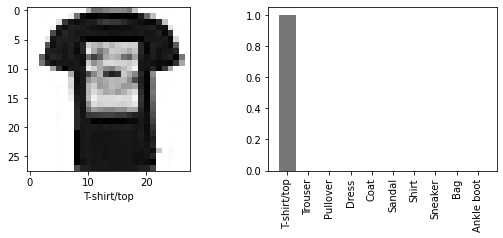

True
-------------------------------------------------


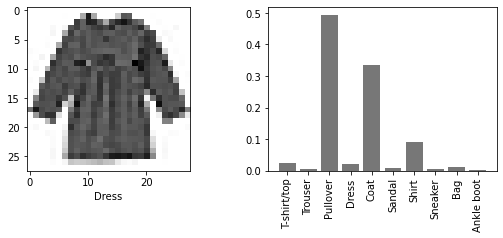

False
-------------------------------------------------


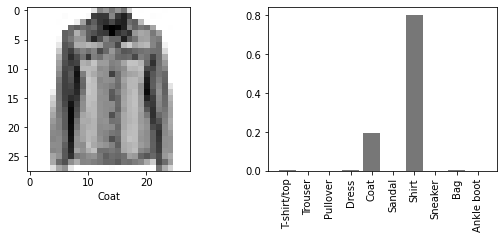

False
-------------------------------------------------


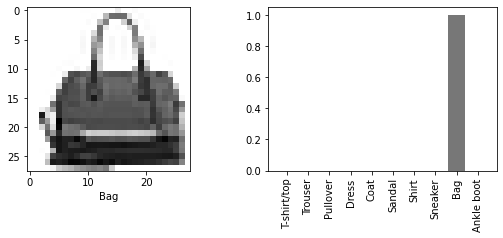

True
-------------------------------------------------


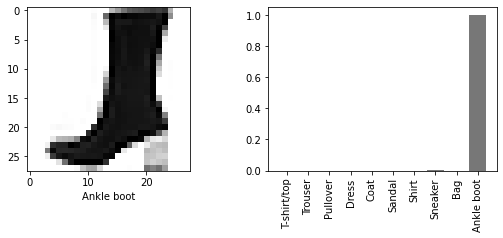

True
-------------------------------------------------


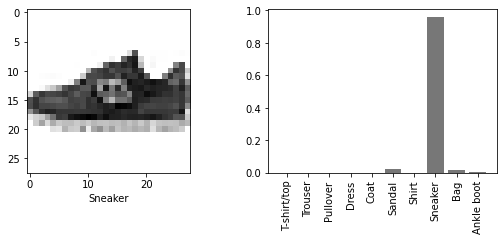

True
-------------------------------------------------


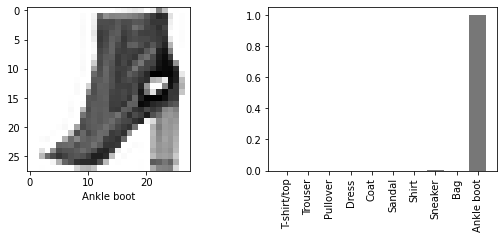

True
-------------------------------------------------


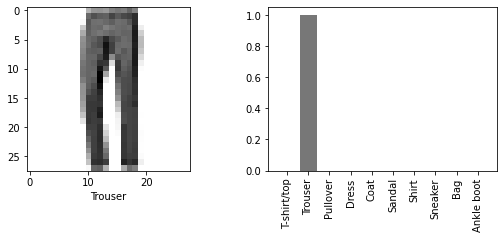

True
-------------------------------------------------


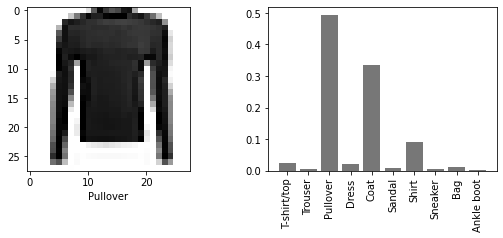

True
-------------------------------------------------


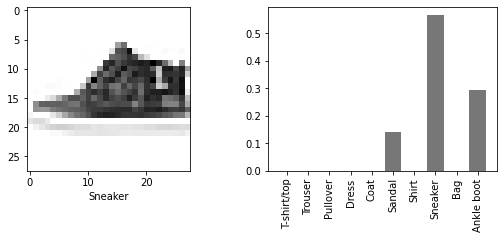

True
-------------------------------------------------


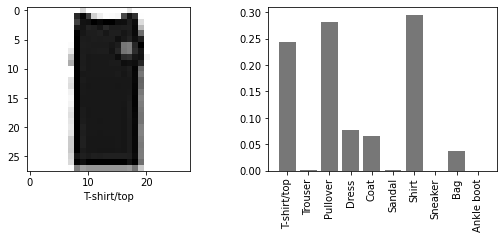

False
-------------------------------------------------


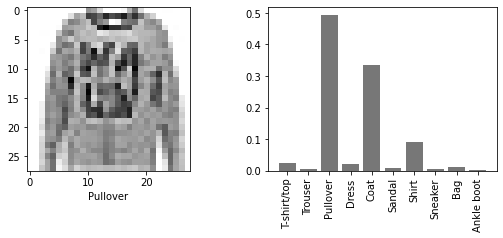

True
-------------------------------------------------


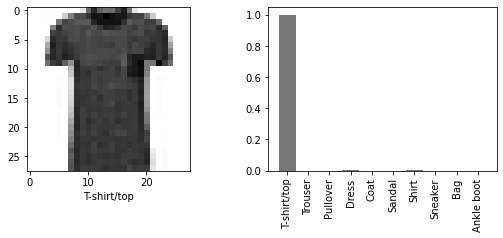

True
-------------------------------------------------


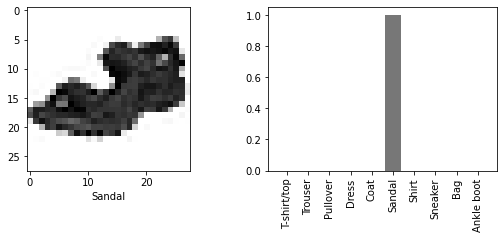

True
-------------------------------------------------


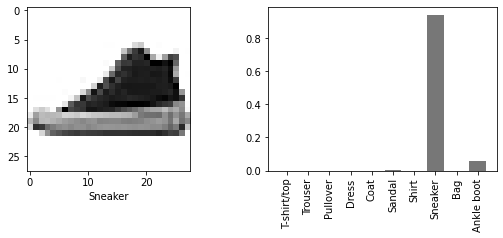

True
-------------------------------------------------


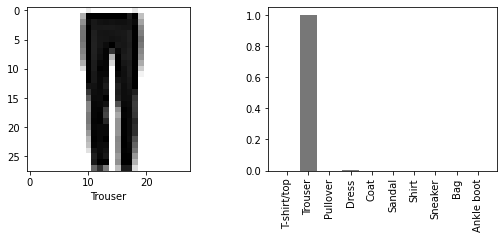

True
-------------------------------------------------


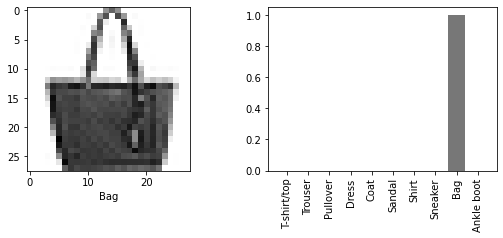

True
-------------------------------------------------


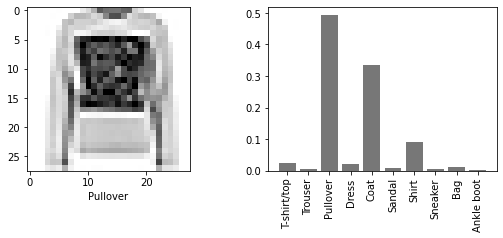

True
-------------------------------------------------


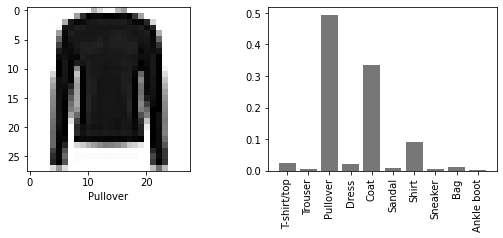

True
-------------------------------------------------


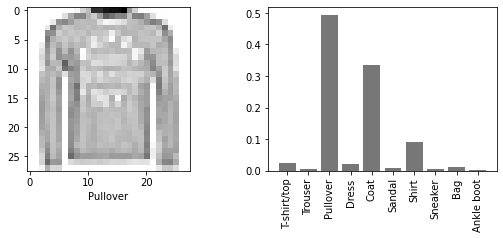

True
-------------------------------------------------


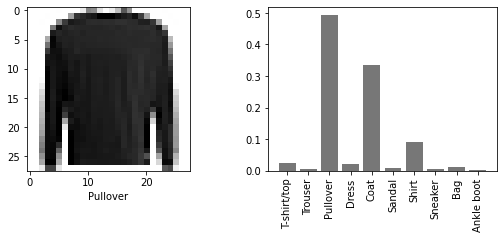

True
-------------------------------------------------


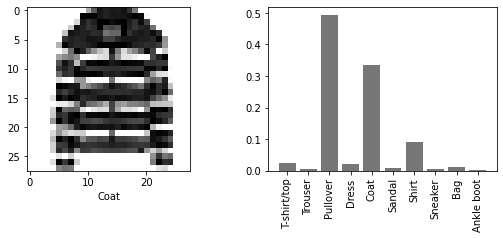

False
-------------------------------------------------


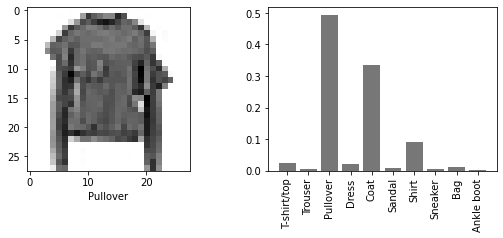

True
-------------------------------------------------


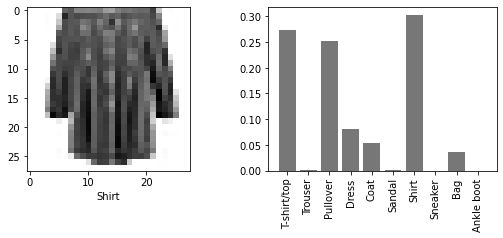

True
-------------------------------------------------


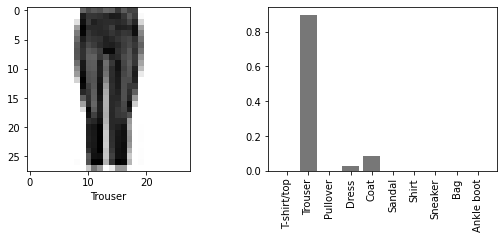

True
-------------------------------------------------


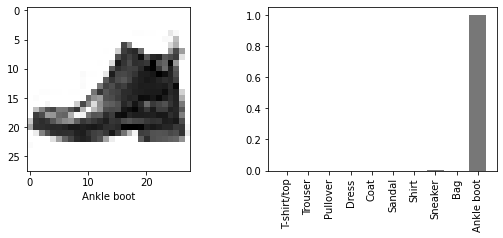

True
-------------------------------------------------


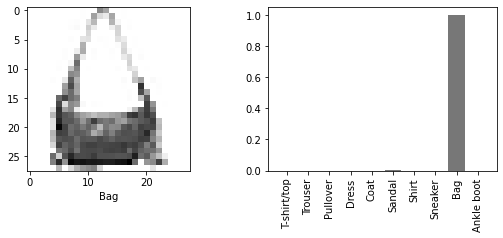

True
-------------------------------------------------


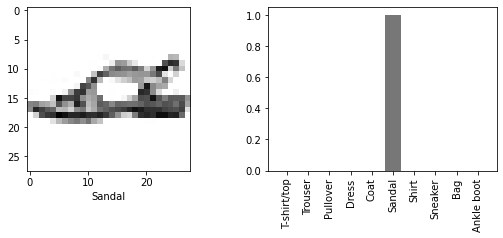

True
-------------------------------------------------


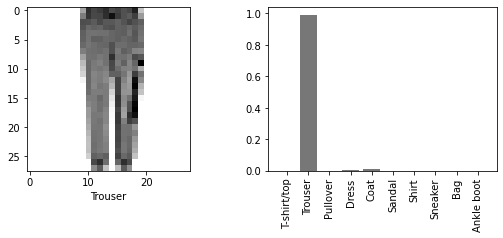

True
-------------------------------------------------


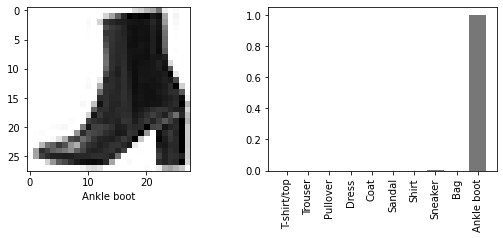

True
-------------------------------------------------


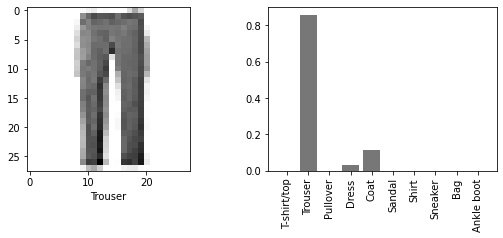

True
-------------------------------------------------


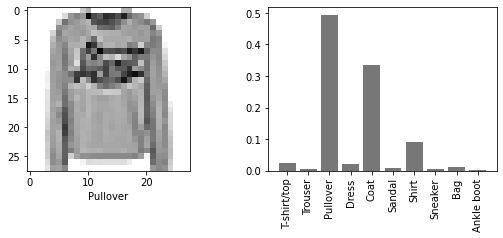

True
-------------------------------------------------


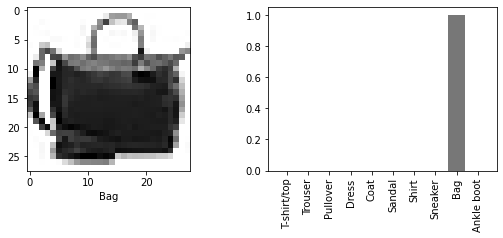

True
-------------------------------------------------


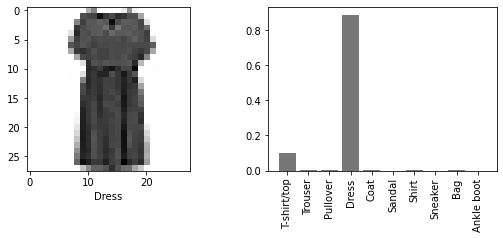

True
-------------------------------------------------


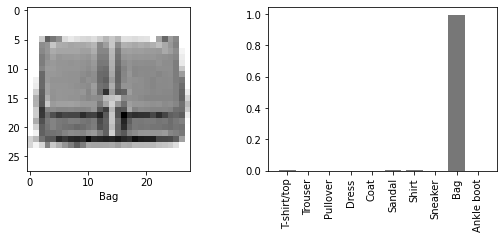

True
-------------------------------------------------


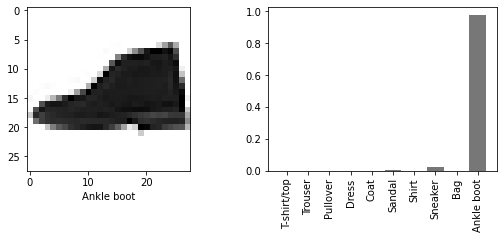

True
-------------------------------------------------


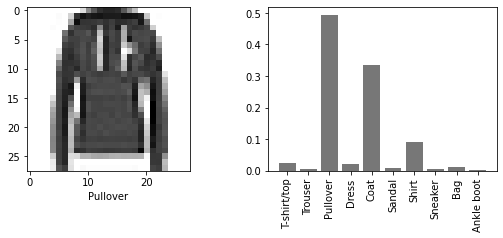

True
-------------------------------------------------


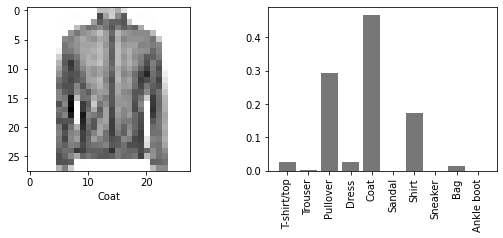

True
-------------------------------------------------


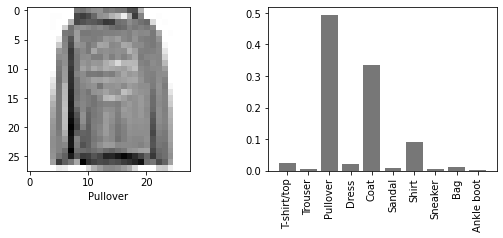

True
-------------------------------------------------


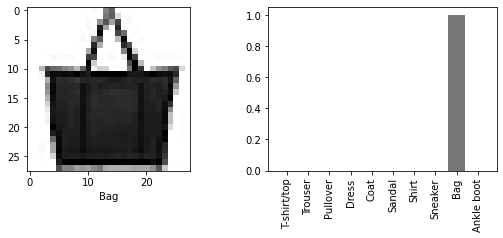

True
-------------------------------------------------


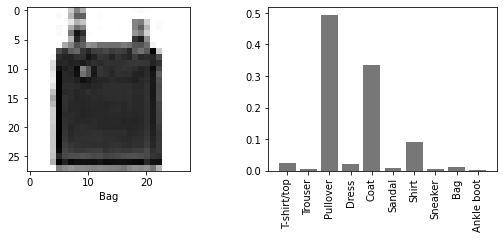

False
-------------------------------------------------


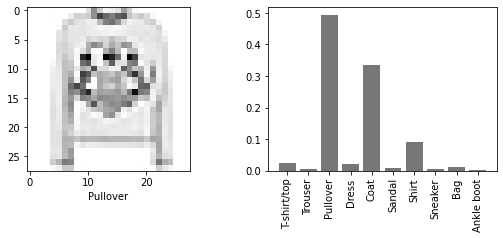

True
-------------------------------------------------


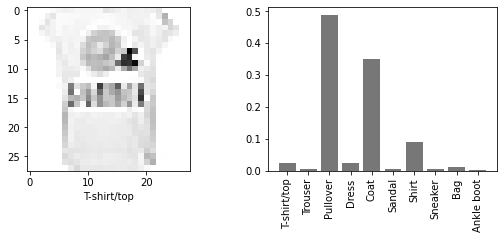

False
-------------------------------------------------


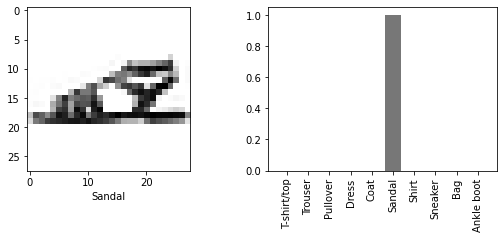

True
-------------------------------------------------


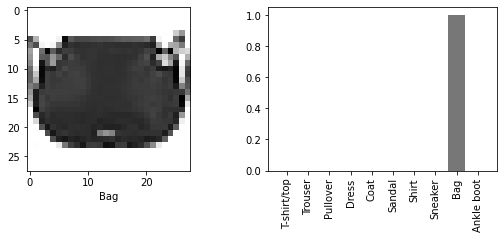

True
-------------------------------------------------


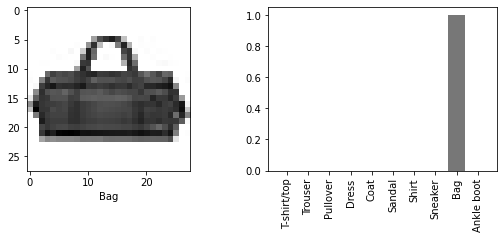

True
-------------------------------------------------


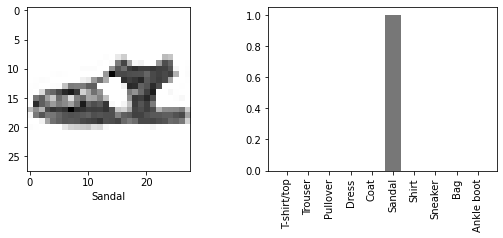

True
-------------------------------------------------


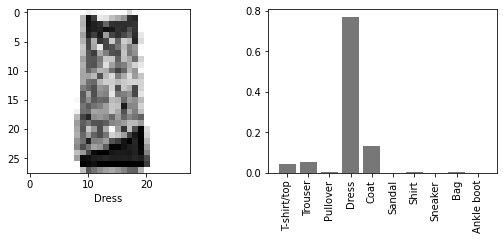

True
-------------------------------------------------


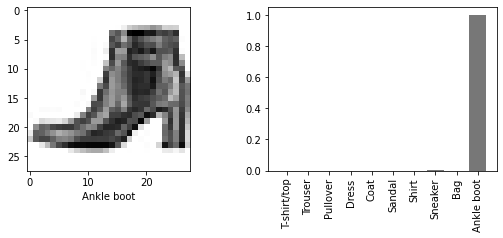

True
-------------------------------------------------


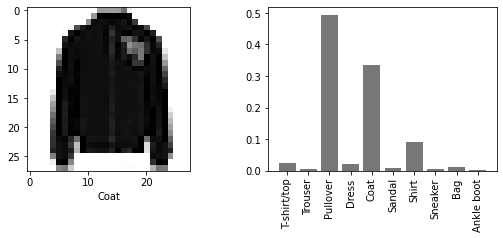

False
-------------------------------------------------


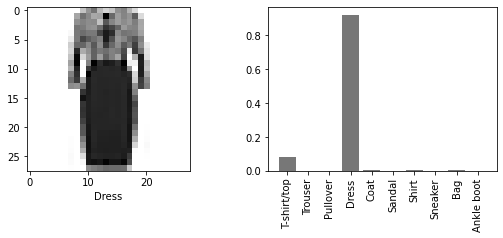

True
-------------------------------------------------


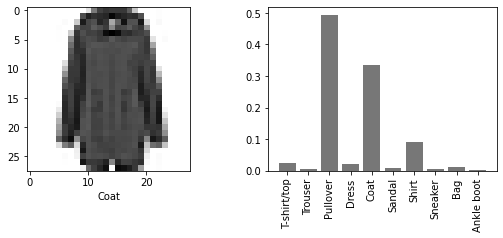

False
-------------------------------------------------


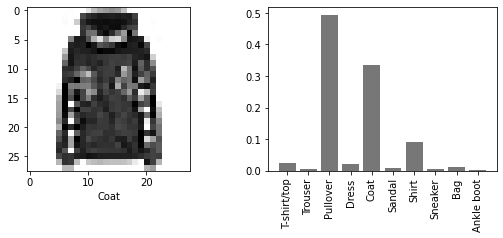

False
-------------------------------------------------


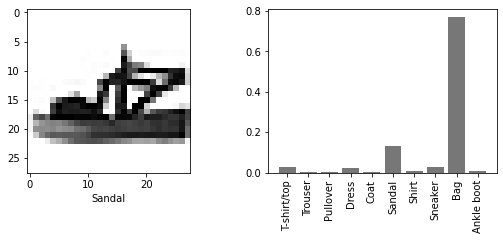

False
-------------------------------------------------


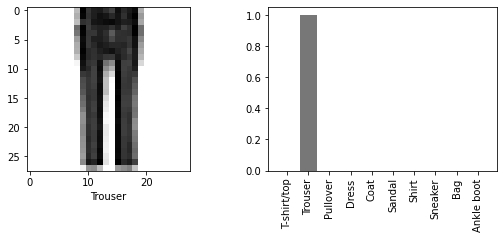

True
-------------------------------------------------


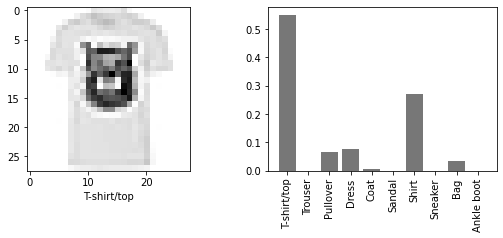

True
-------------------------------------------------


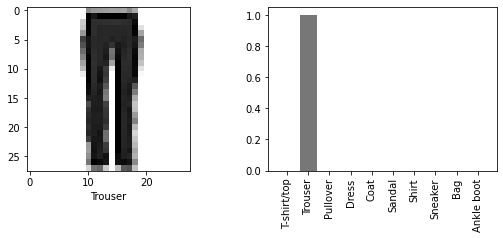

True
-------------------------------------------------


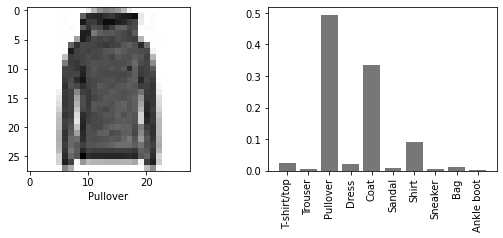

True
-------------------------------------------------


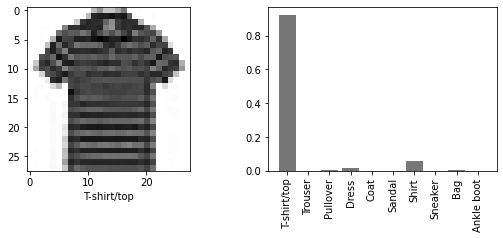

True
-------------------------------------------------


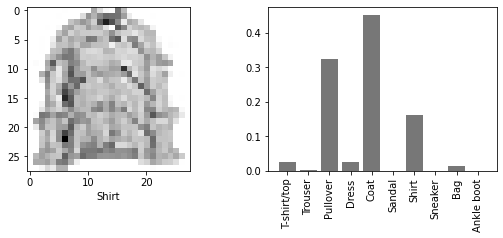

False
-------------------------------------------------


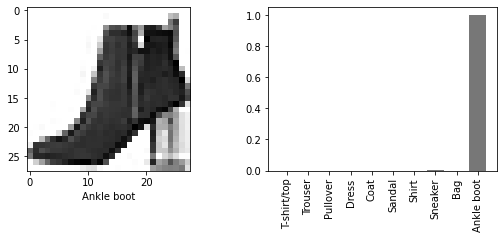

True
-------------------------------------------------


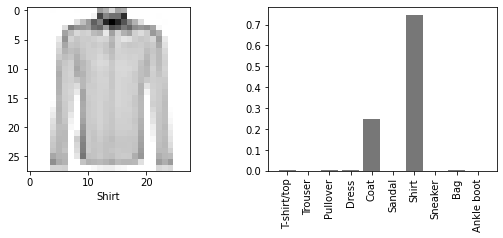

True
-------------------------------------------------


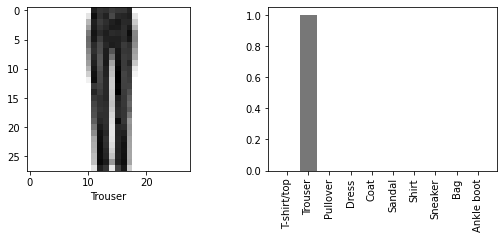

True
-------------------------------------------------


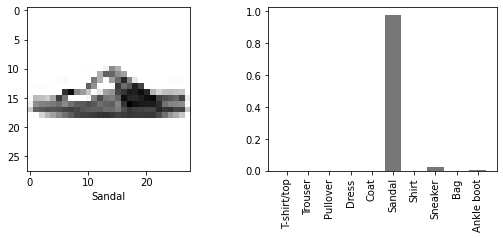

True
-------------------------------------------------


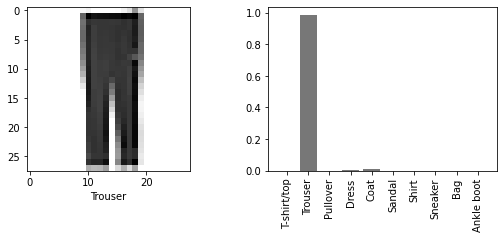

True
-------------------------------------------------


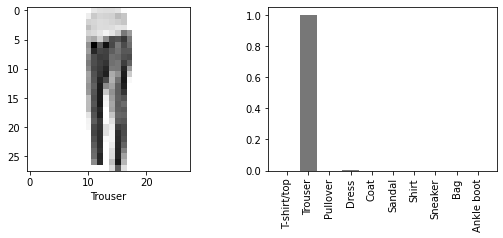

True
-------------------------------------------------


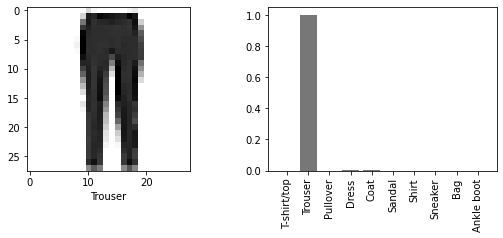

True
-------------------------------------------------


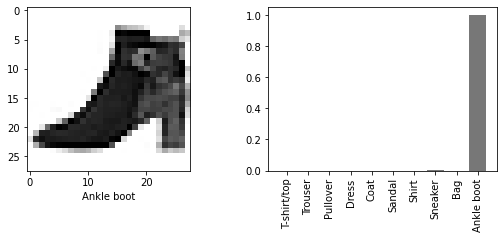

True
-------------------------------------------------


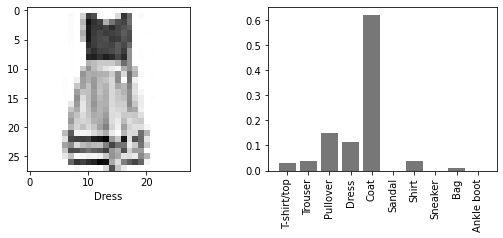

False
-------------------------------------------------


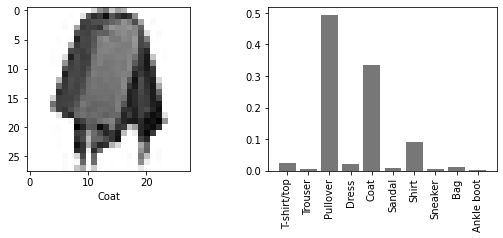

False
-------------------------------------------------


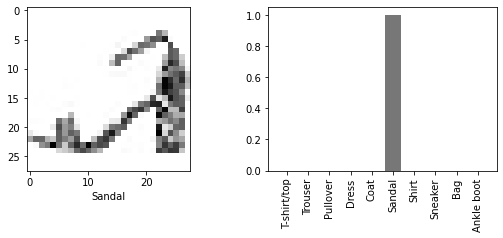

True
-------------------------------------------------


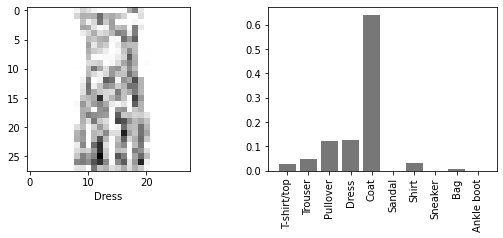

False
-------------------------------------------------


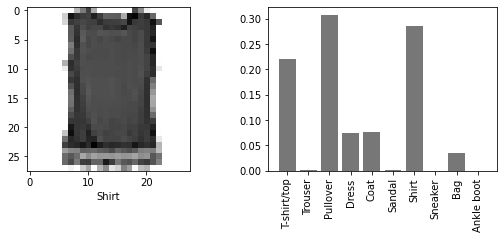

False
-------------------------------------------------


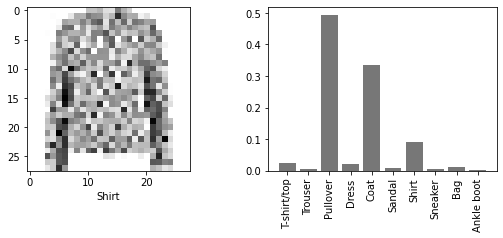

False
-------------------------------------------------


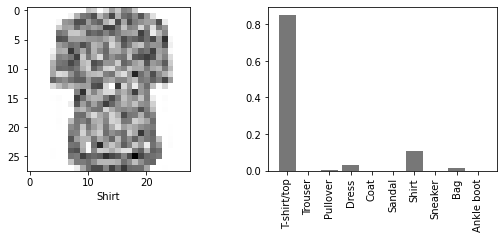

False
-------------------------------------------------


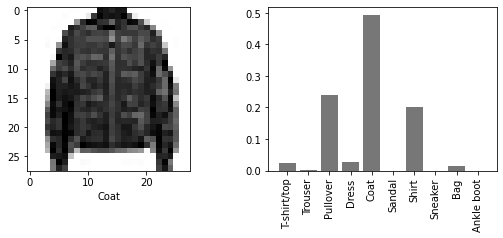

True
-------------------------------------------------


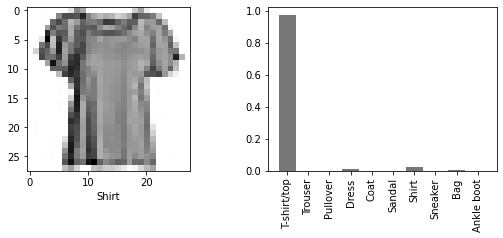

False
-------------------------------------------------


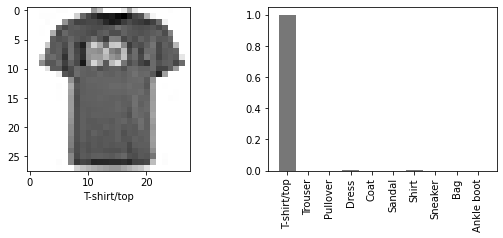

True
-------------------------------------------------


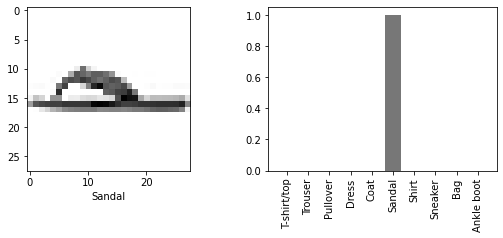

True
-------------------------------------------------


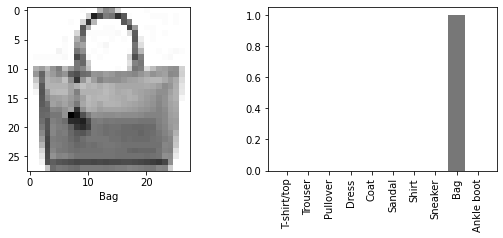

True
-------------------------------------------------


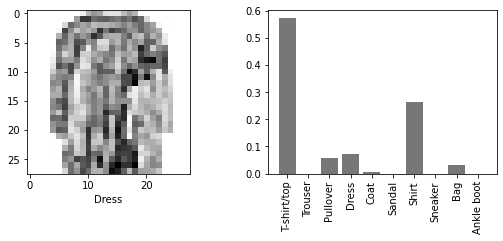

False
-------------------------------------------------


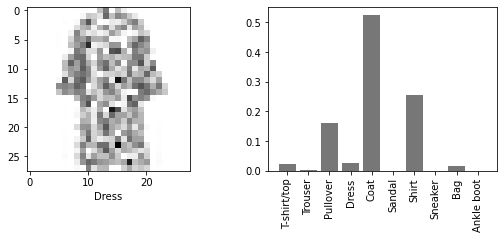

False
-------------------------------------------------


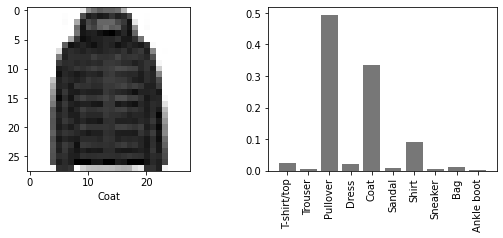

False
-------------------------------------------------


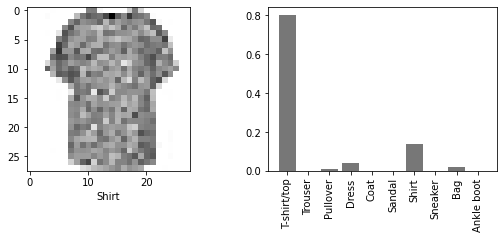

False
-------------------------------------------------


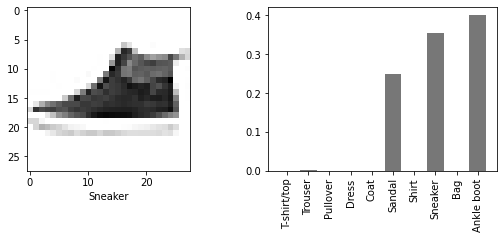

False
-------------------------------------------------


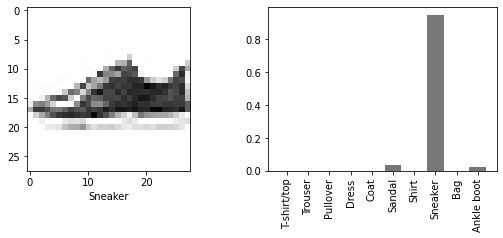

True
-------------------------------------------------


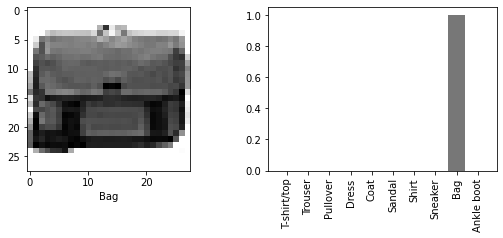

True
-------------------------------------------------


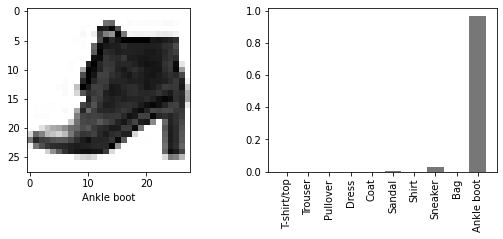

True
-------------------------------------------------


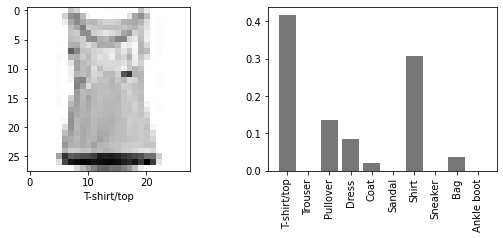

True
-------------------------------------------------


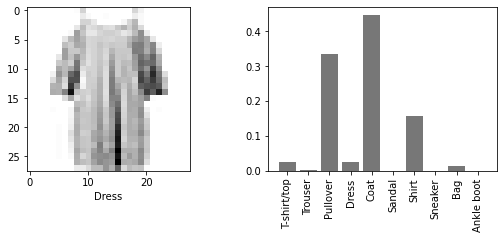

False
-------------------------------------------------


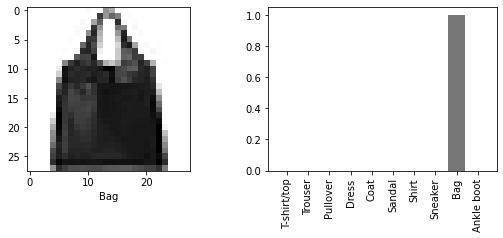

True
-------------------------------------------------


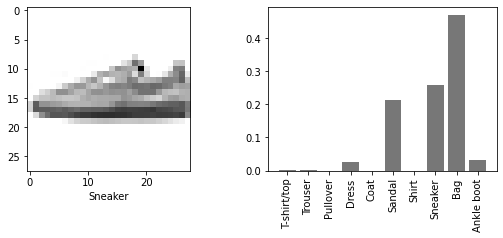

False
-------------------------------------------------


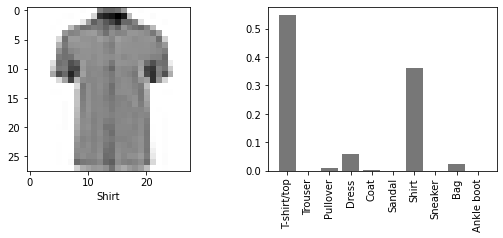

False
-------------------------------------------------


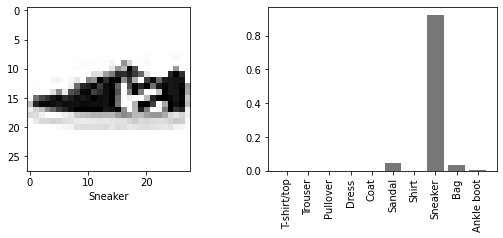

True
-------------------------------------------------


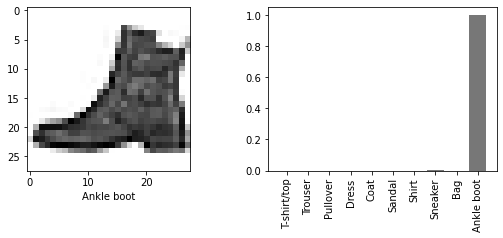

True
-------------------------------------------------


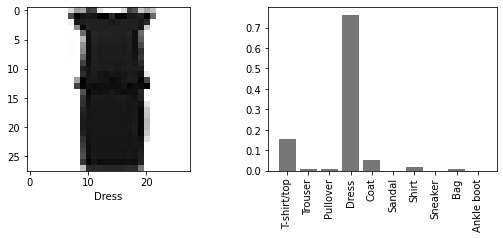

True
-------------------------------------------------


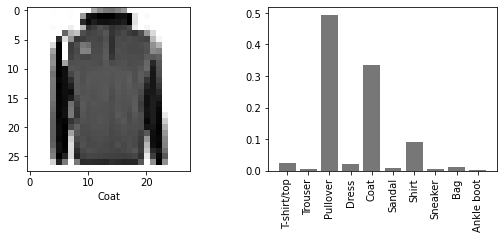

False
-------------------------------------------------


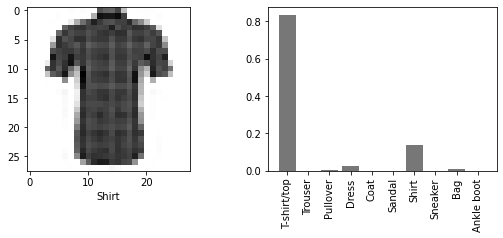

False
-------------------------------------------------


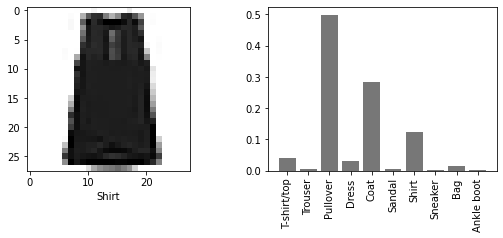

False
-------------------------------------------------


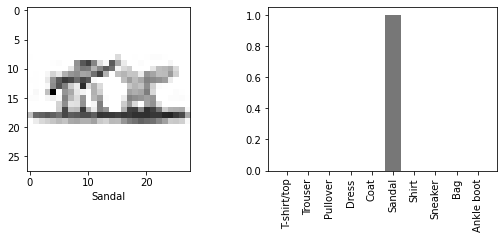

True
-------------------------------------------------


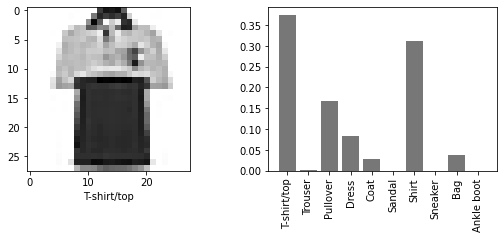

True
-------------------------------------------------


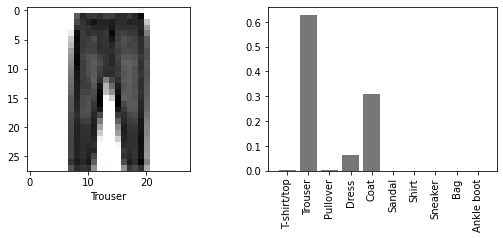

True
-------------------------------------------------


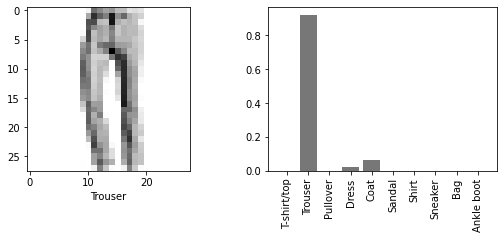

True
-------------------------------------------------


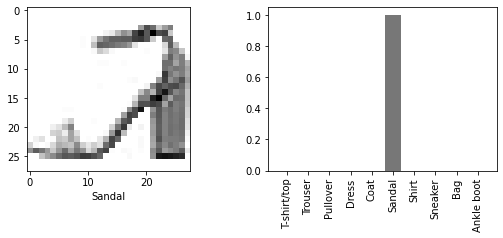

True
-------------------------------------------------


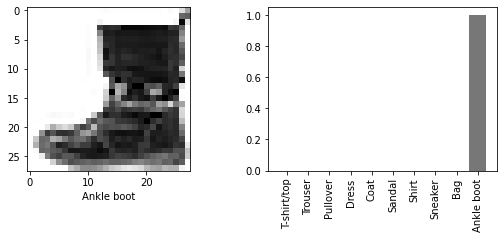

True
-------------------------------------------------


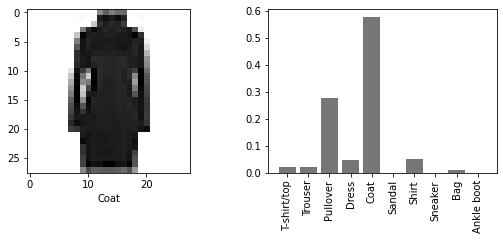

True
-------------------------------------------------


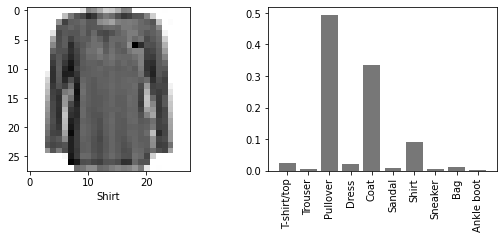

False
-------------------------------------------------


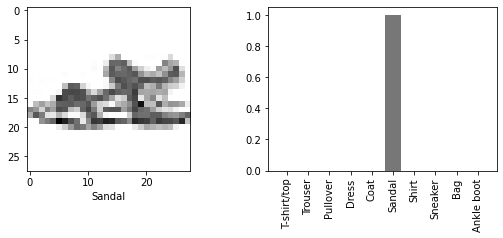

True
-------------------------------------------------


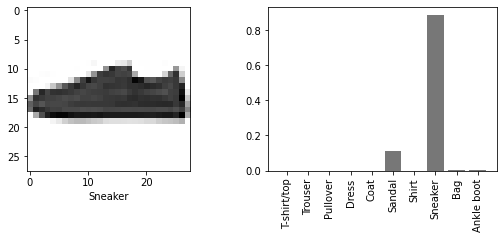

True
-------------------------------------------------


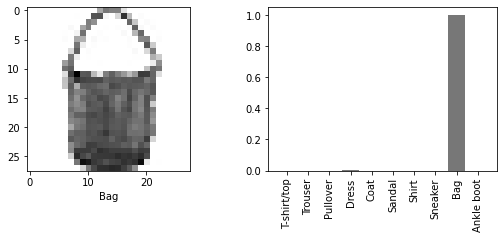

True
-------------------------------------------------


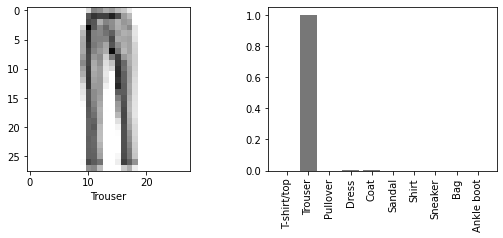

True
-------------------------------------------------


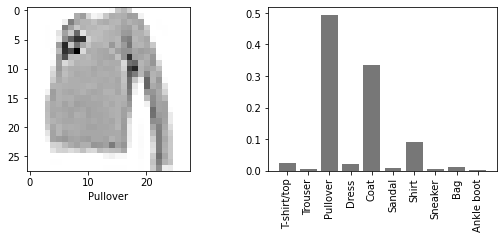

True
-------------------------------------------------


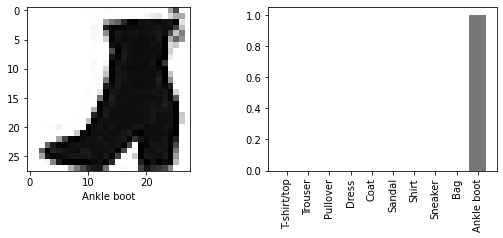

True
-------------------------------------------------


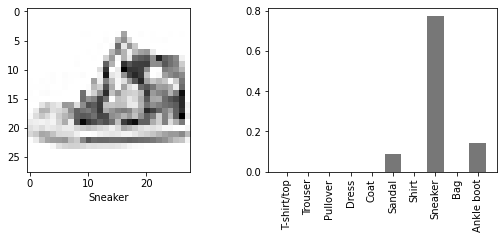

True
-------------------------------------------------


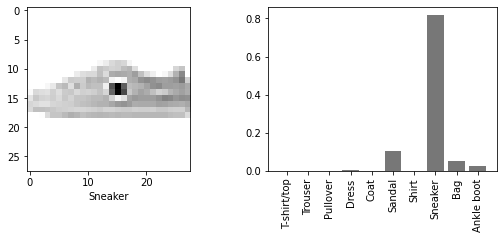

True
-------------------------------------------------


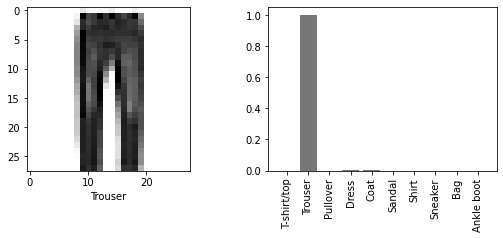

True
-------------------------------------------------


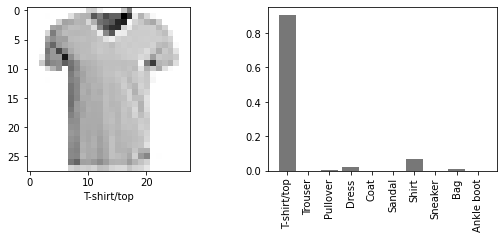

True
-------------------------------------------------


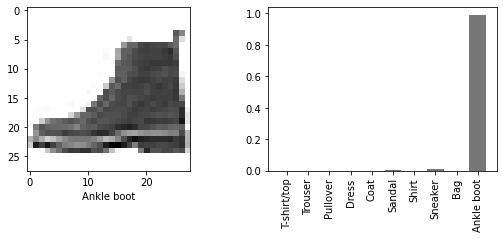

True
-------------------------------------------------


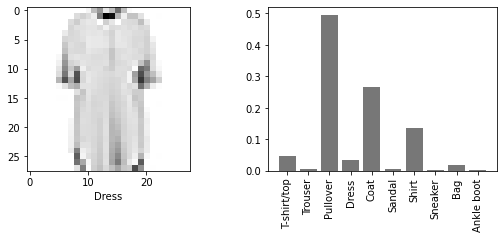

False
-------------------------------------------------


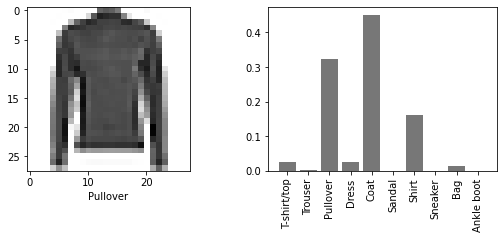

False
-------------------------------------------------


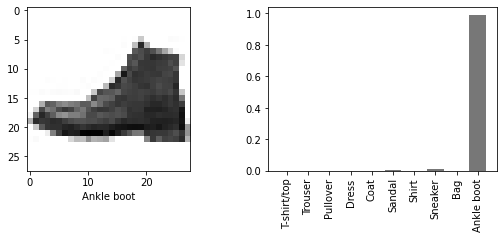

True
-------------------------------------------------


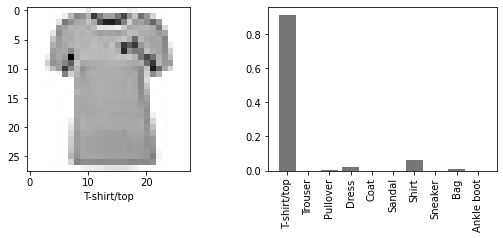

True
-------------------------------------------------


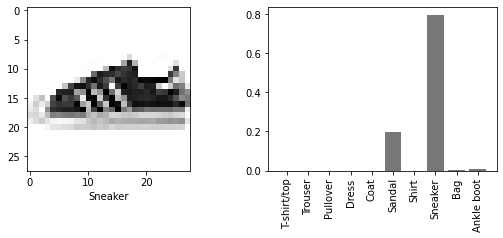

True
-------------------------------------------------


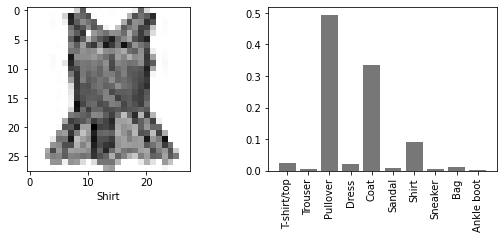

False
-------------------------------------------------


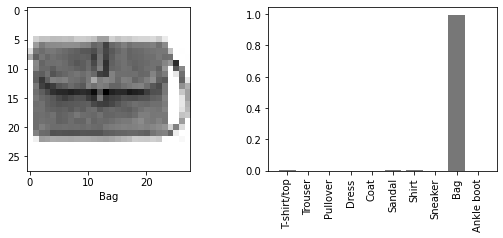

True
-------------------------------------------------


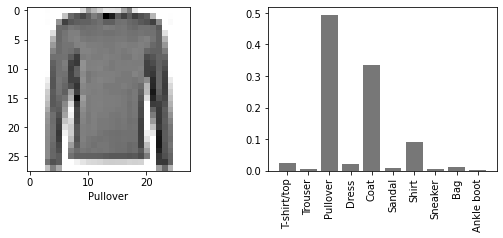

True
-------------------------------------------------


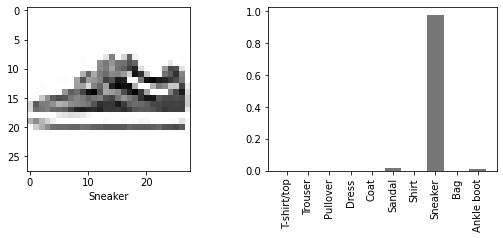

True
-------------------------------------------------


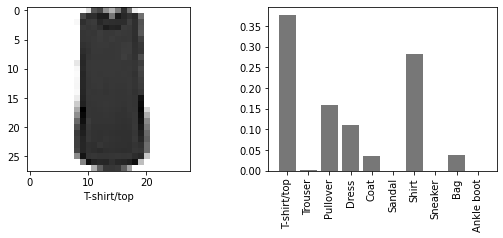

True
-------------------------------------------------


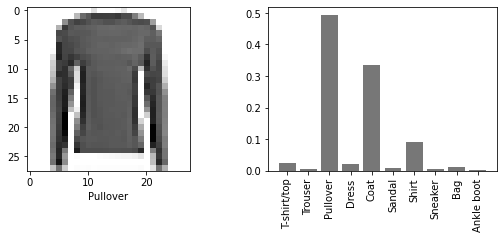

True
-------------------------------------------------


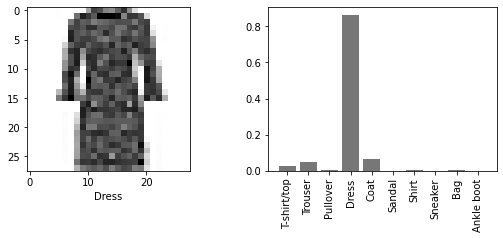

True
-------------------------------------------------


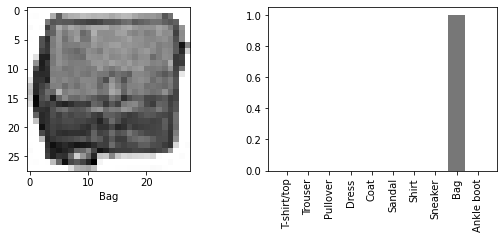

True
-------------------------------------------------


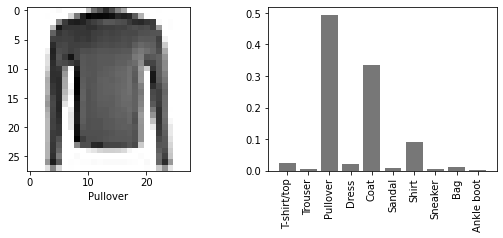

True
-------------------------------------------------


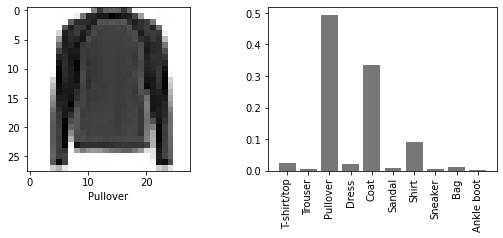

True
-------------------------------------------------


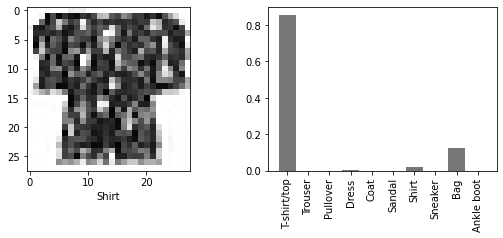

False
-------------------------------------------------


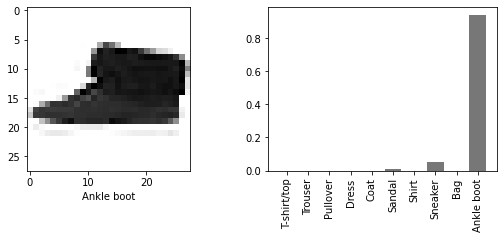

True
-------------------------------------------------


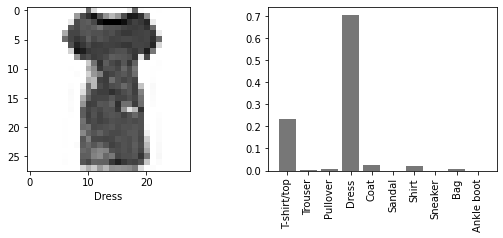

True
-------------------------------------------------


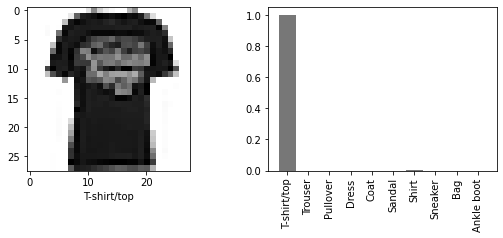

True
-------------------------------------------------


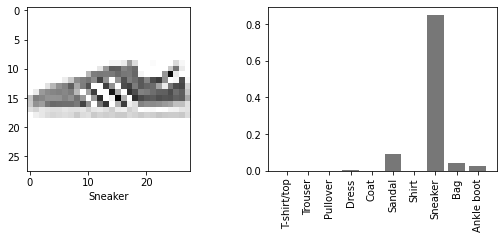

True
-------------------------------------------------


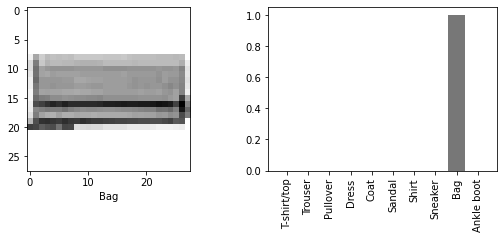

True
-------------------------------------------------


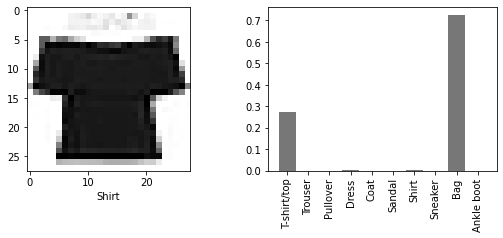

False
-------------------------------------------------


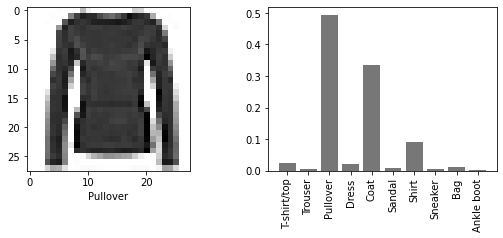

True
-------------------------------------------------


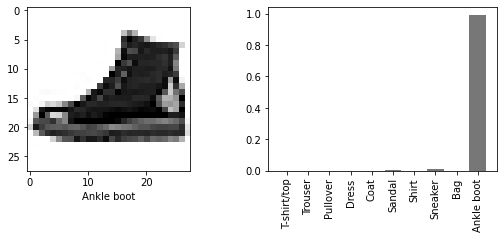

True
-------------------------------------------------


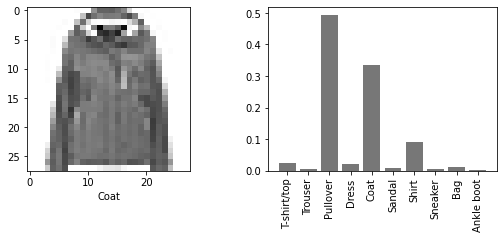

False
-------------------------------------------------


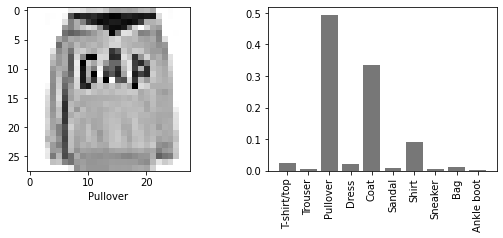

True
-------------------------------------------------


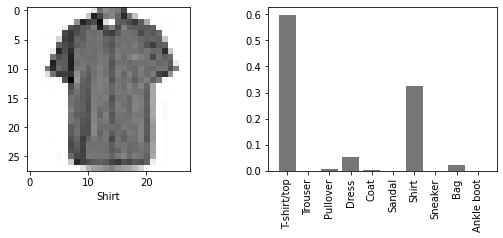

False
-------------------------------------------------


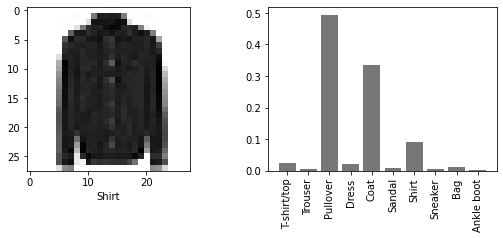

False
-------------------------------------------------


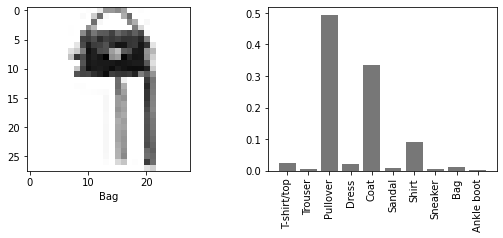

False
-------------------------------------------------


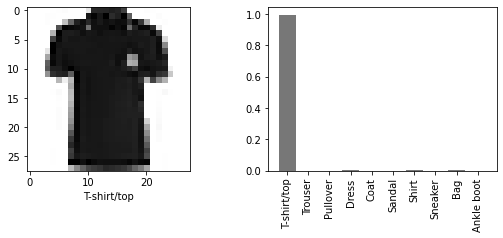

True
-------------------------------------------------


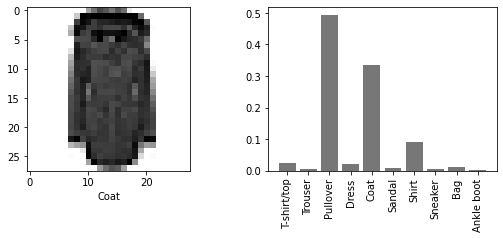

False
-------------------------------------------------


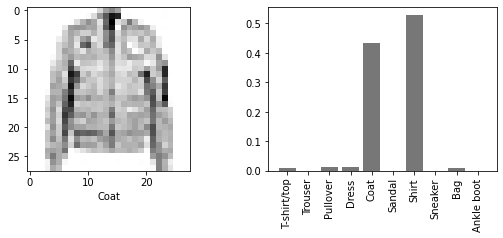

False
-------------------------------------------------


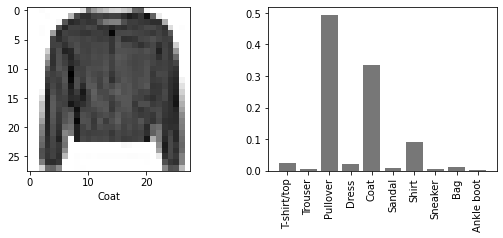

False
-------------------------------------------------


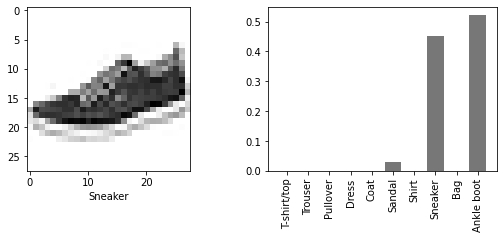

False
-------------------------------------------------


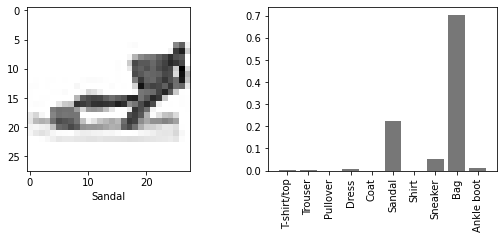

False
-------------------------------------------------


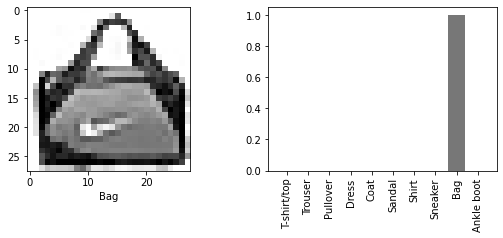

True
-------------------------------------------------


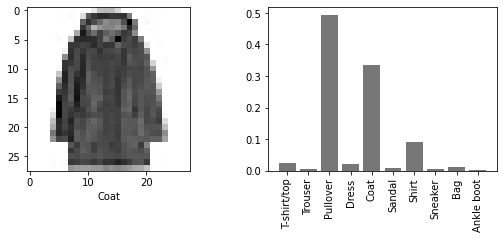

False
-------------------------------------------------


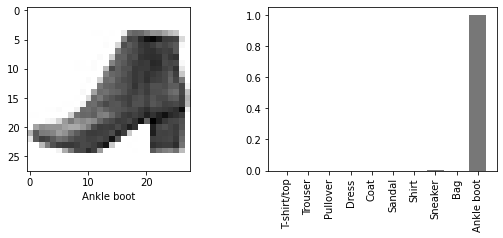

True
-------------------------------------------------


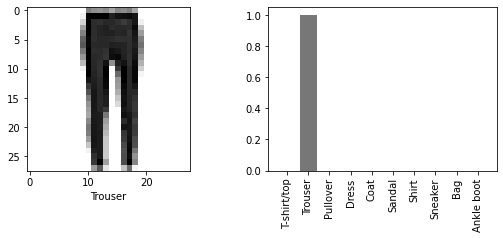

True
-------------------------------------------------


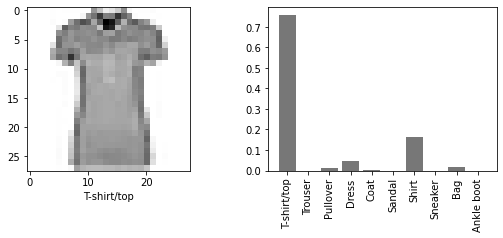

True
-------------------------------------------------


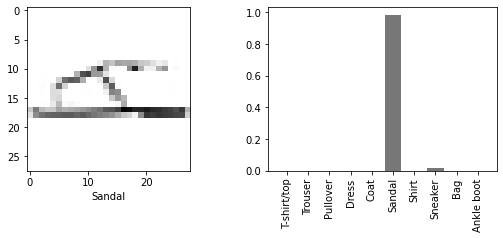

True
-------------------------------------------------


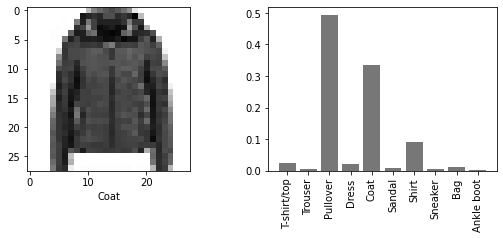

False
-------------------------------------------------


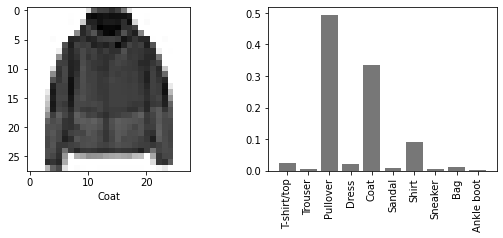

False
-------------------------------------------------


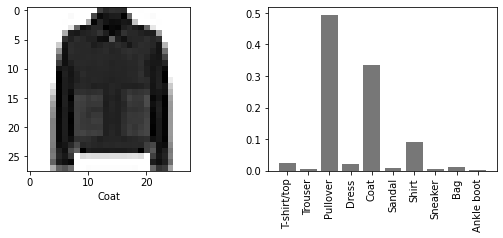

False
-------------------------------------------------


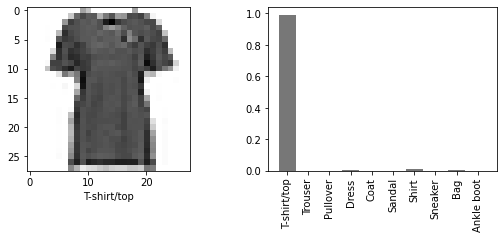

True
-------------------------------------------------


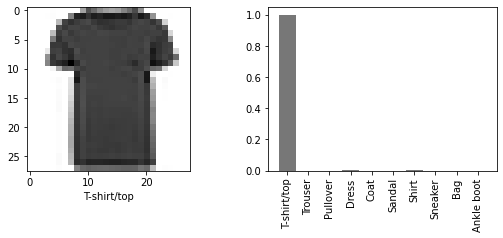

True
-------------------------------------------------


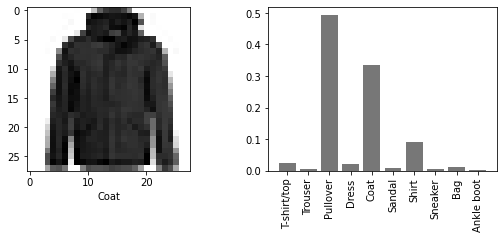

False
-------------------------------------------------


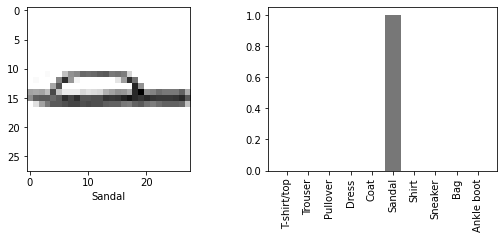

True
-------------------------------------------------


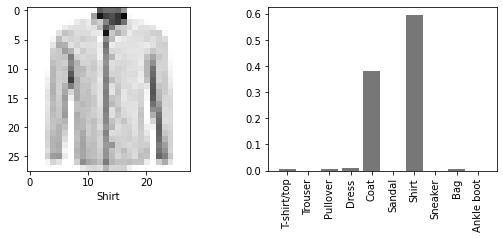

True
-------------------------------------------------


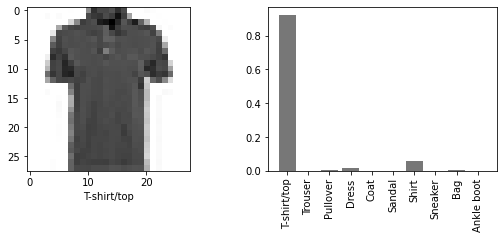

True
-------------------------------------------------


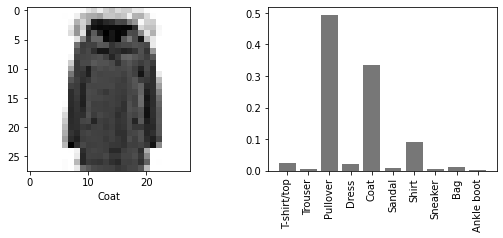

False
-------------------------------------------------


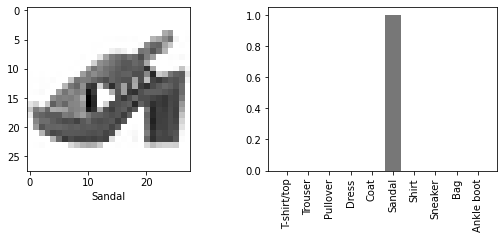

True
-------------------------------------------------


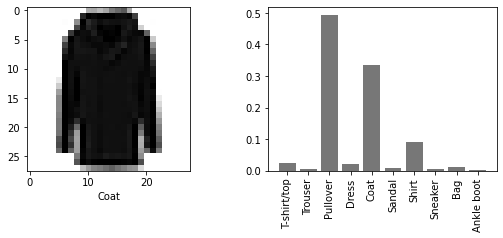

False
-------------------------------------------------


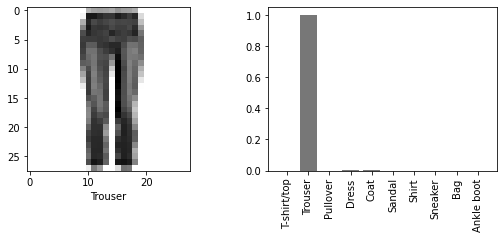

True
-------------------------------------------------


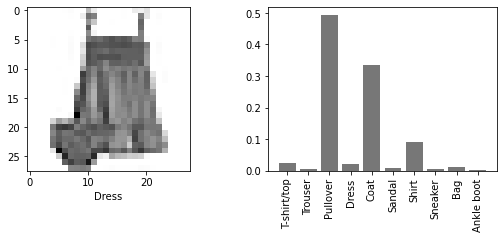

False
-------------------------------------------------


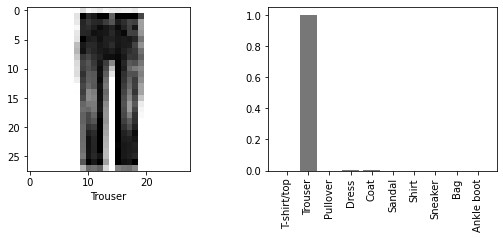

True
-------------------------------------------------


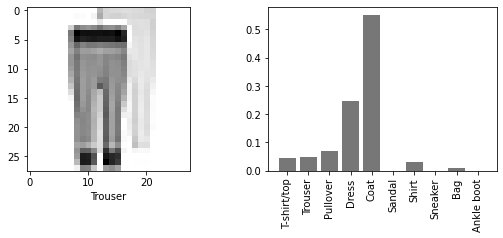

False
-------------------------------------------------


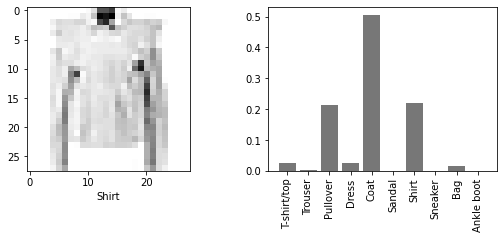

False
-------------------------------------------------


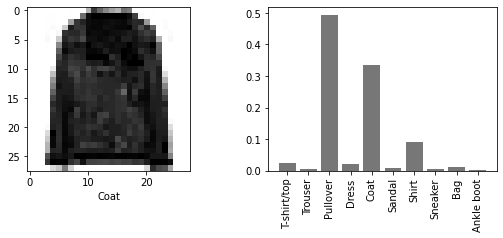

False
-------------------------------------------------


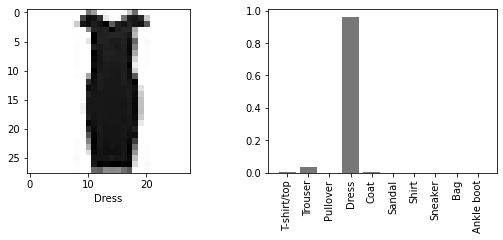

True
-------------------------------------------------


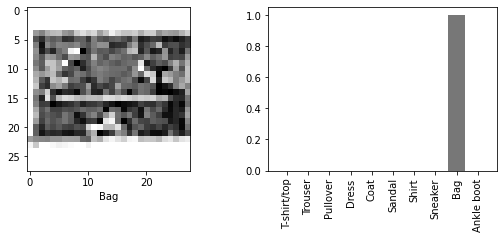

True
-------------------------------------------------


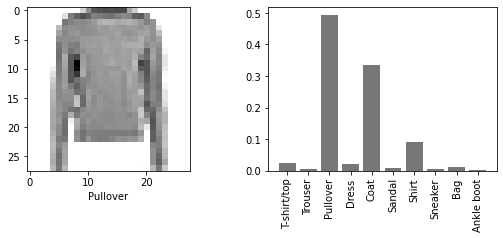

True
-------------------------------------------------


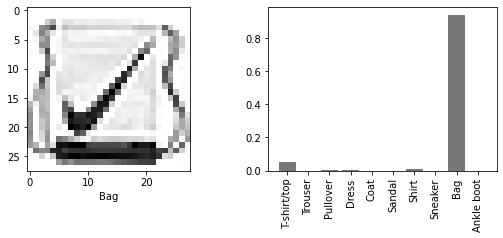

True
-------------------------------------------------


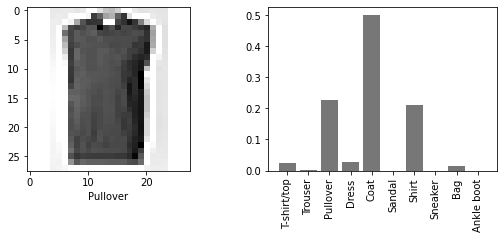

False
-------------------------------------------------


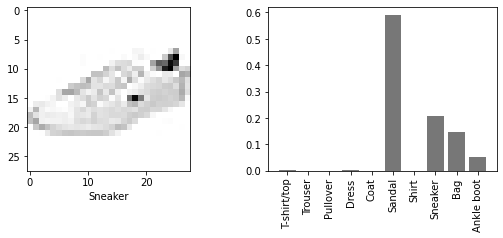

False
-------------------------------------------------


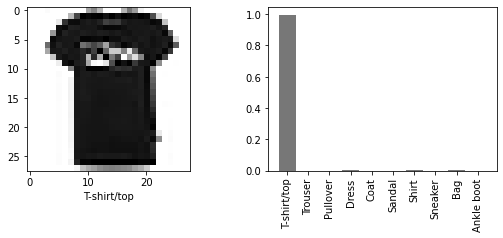

True
-------------------------------------------------


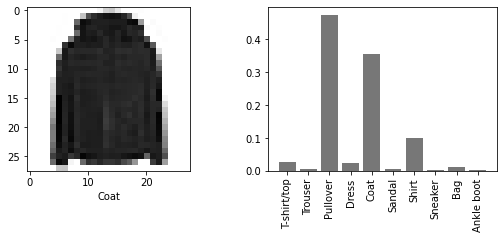

False
-------------------------------------------------


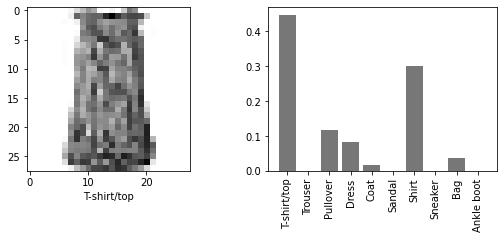

True
-------------------------------------------------


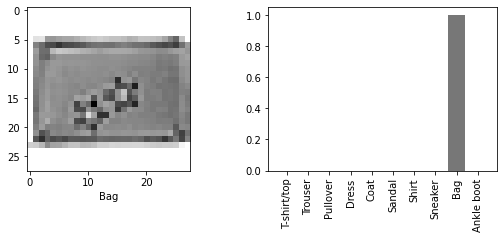

True
-------------------------------------------------


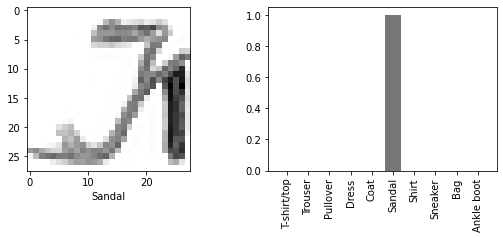

True
-------------------------------------------------


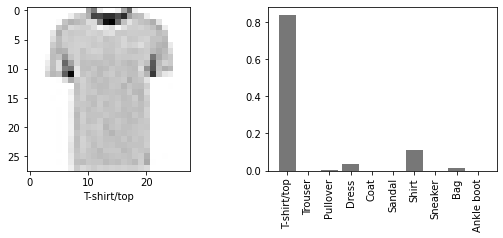

True
-------------------------------------------------


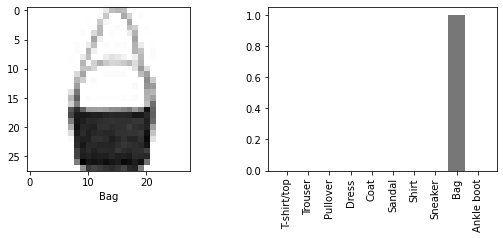

True
-------------------------------------------------


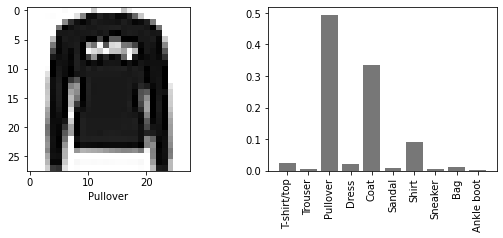

True
-------------------------------------------------


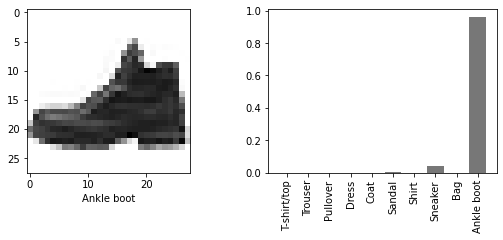

True
-------------------------------------------------


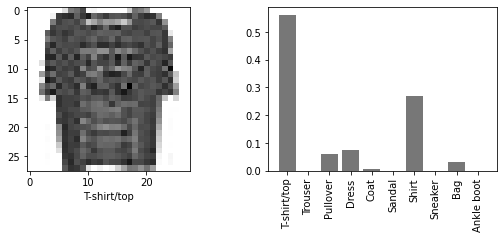

True
-------------------------------------------------


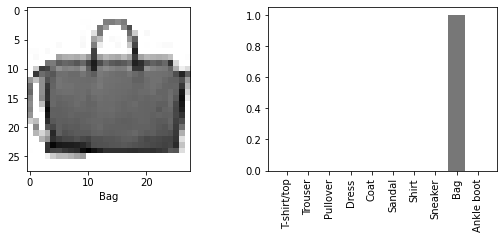

True
-------------------------------------------------


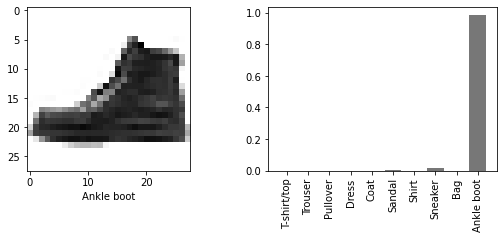

True
-------------------------------------------------


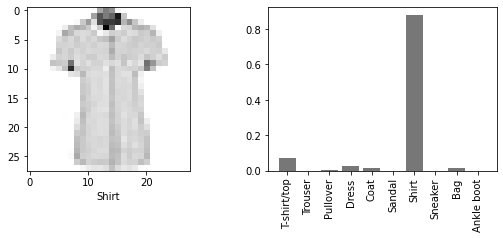

True
-------------------------------------------------


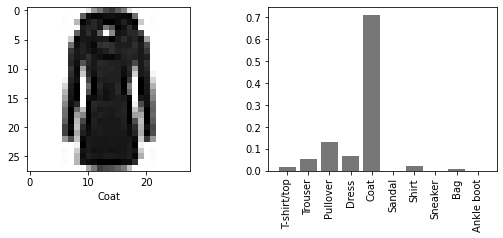

True
-------------------------------------------------


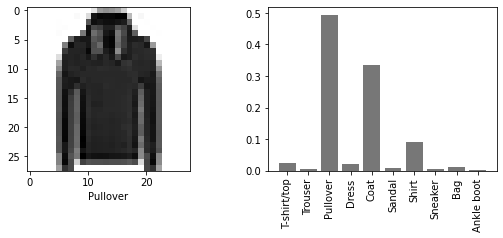

True
-------------------------------------------------


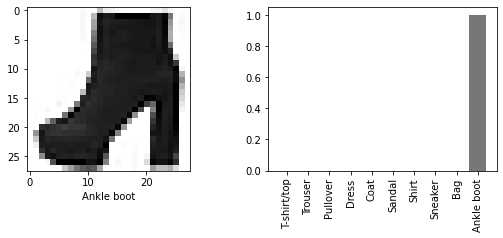

True
-------------------------------------------------


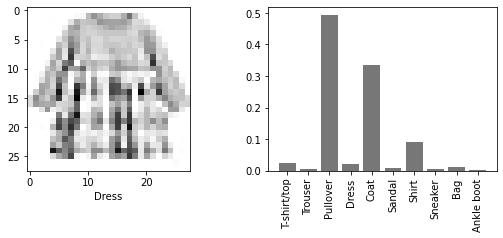

False
-------------------------------------------------


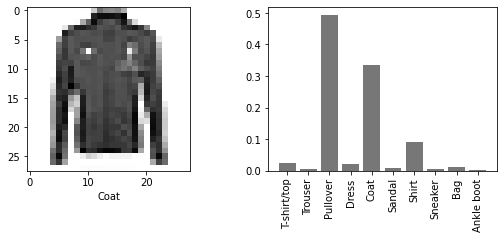

False
-------------------------------------------------


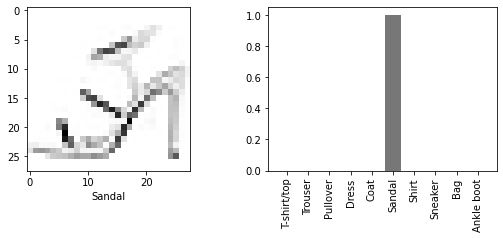

True
-------------------------------------------------


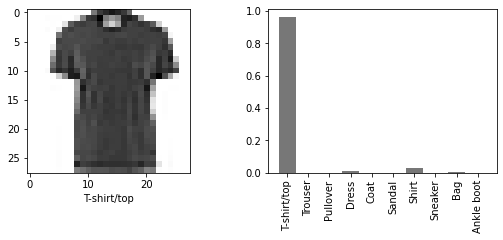

True
-------------------------------------------------


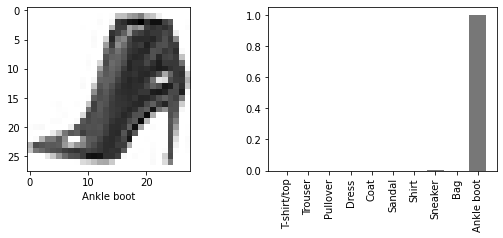

True
-------------------------------------------------


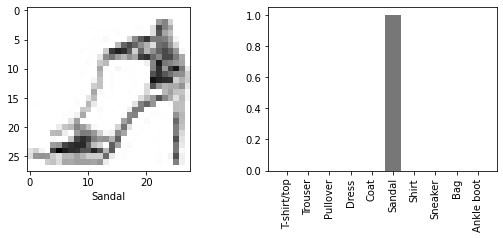

True
-------------------------------------------------


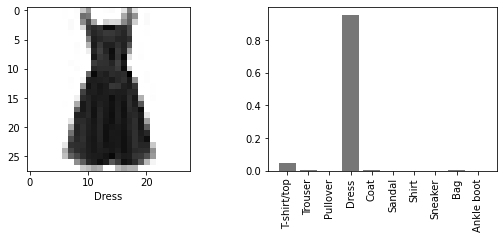

True
-------------------------------------------------


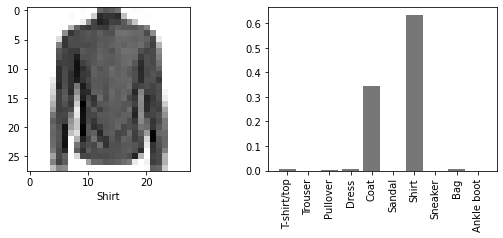

True
-------------------------------------------------


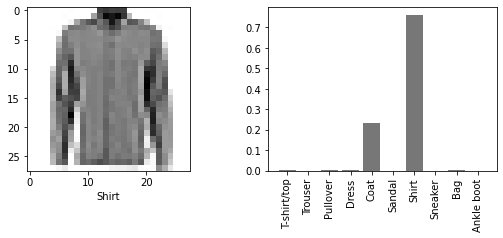

True
-------------------------------------------------


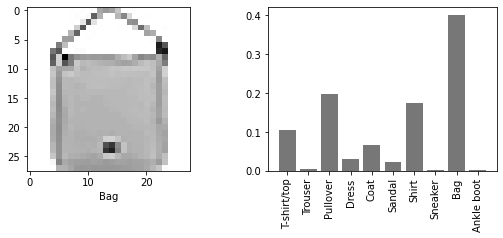

True
-------------------------------------------------


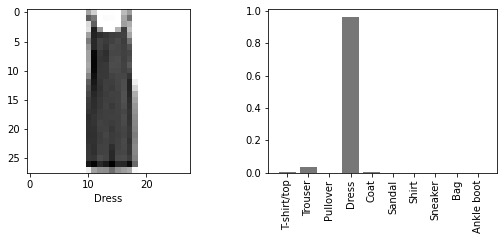

True
-------------------------------------------------


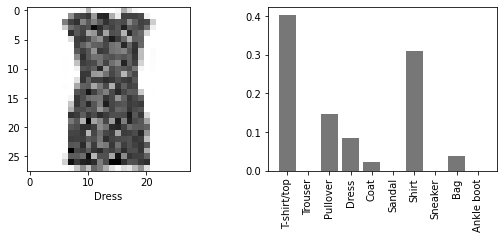

False
-------------------------------------------------


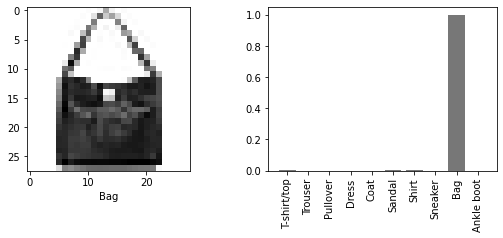

True
-------------------------------------------------


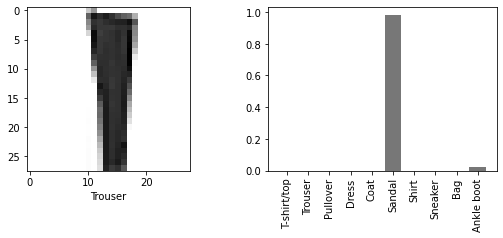

False
-------------------------------------------------


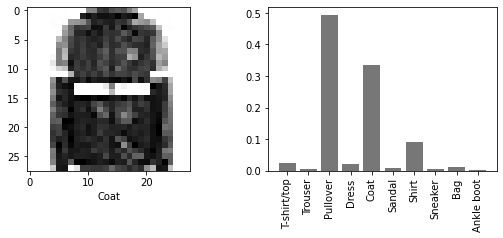

False
-------------------------------------------------


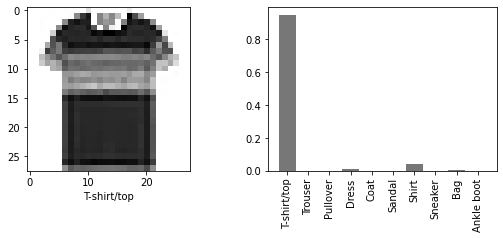

True
-------------------------------------------------


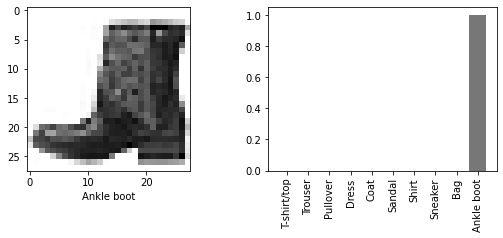

True
-------------------------------------------------


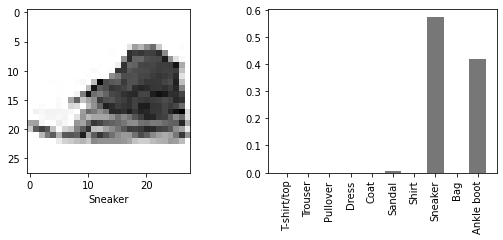

True
-------------------------------------------------


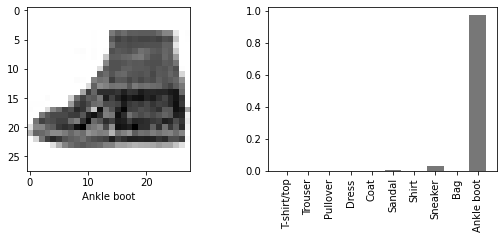

True
-------------------------------------------------


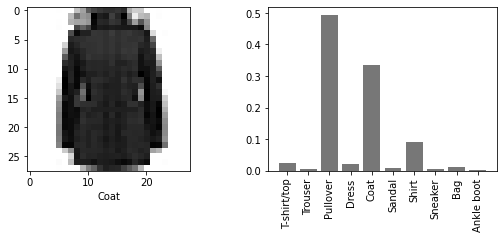

False
-------------------------------------------------


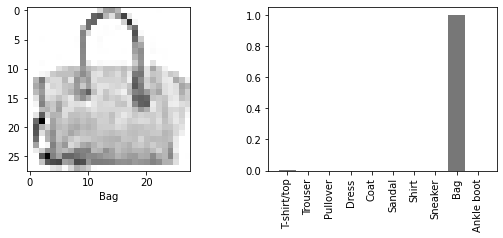

True
-------------------------------------------------


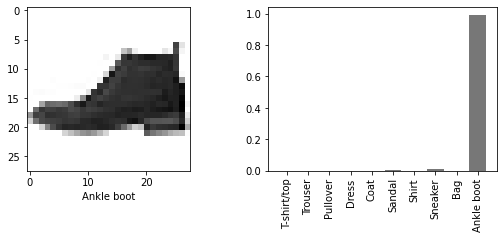

True
-------------------------------------------------


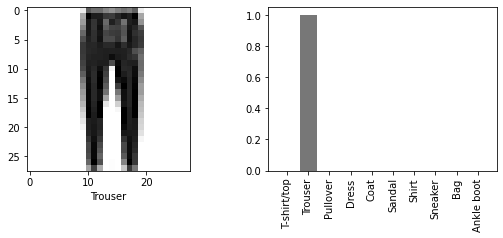

True
-------------------------------------------------


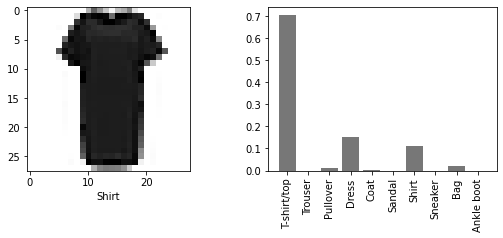

False
-------------------------------------------------


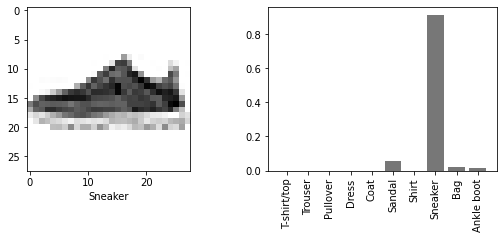

True
-------------------------------------------------


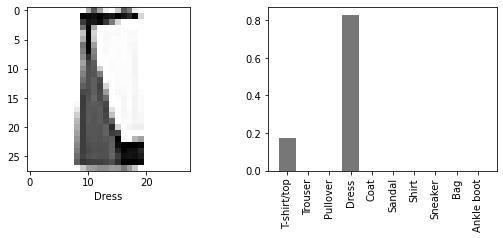

True
-------------------------------------------------


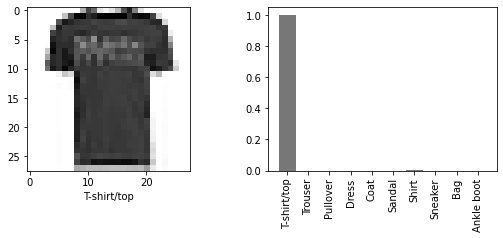

True
-------------------------------------------------


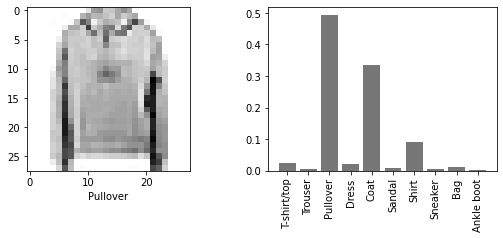

True
-------------------------------------------------


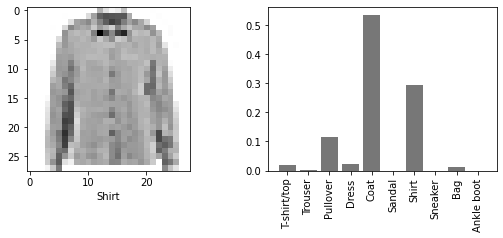

False
-------------------------------------------------


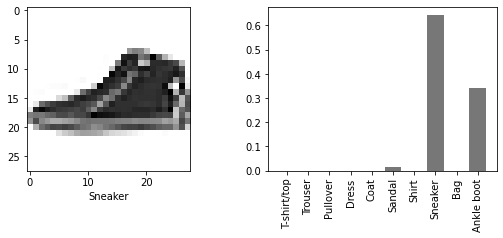

True
-------------------------------------------------


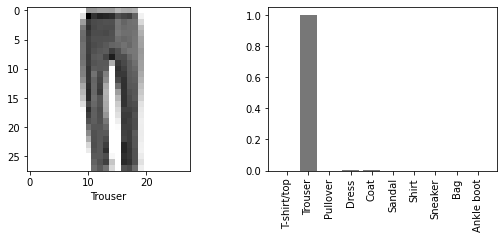

True
-------------------------------------------------


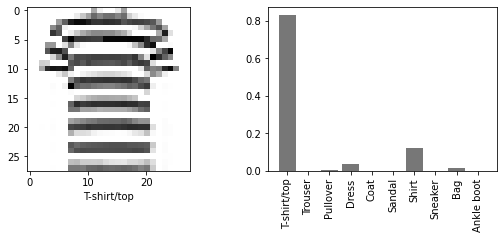

True
-------------------------------------------------


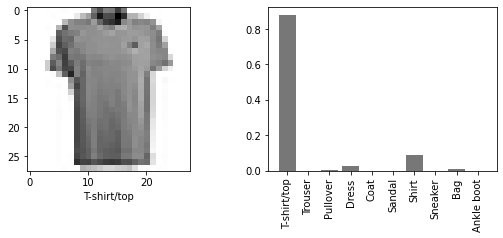

True
-------------------------------------------------


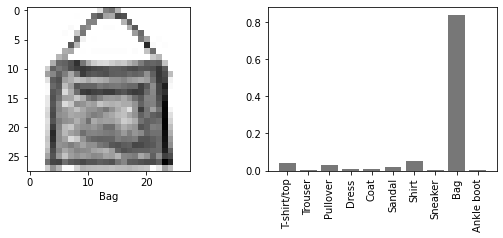

True
-------------------------------------------------


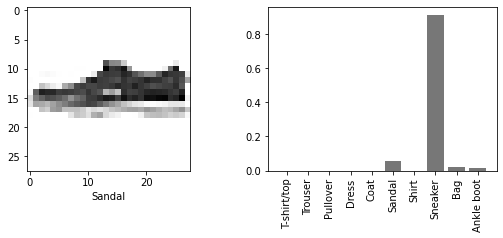

False
-------------------------------------------------


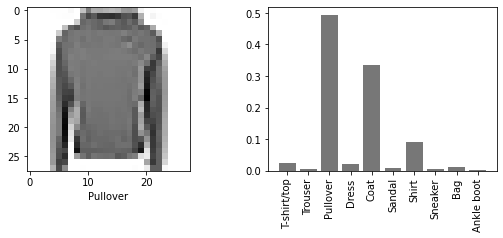

True
-------------------------------------------------


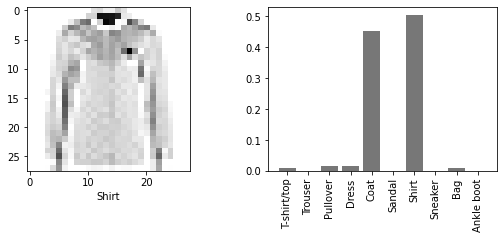

True
-------------------------------------------------


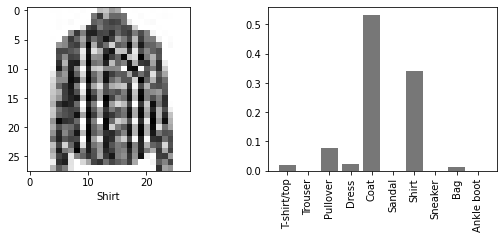

False
-------------------------------------------------


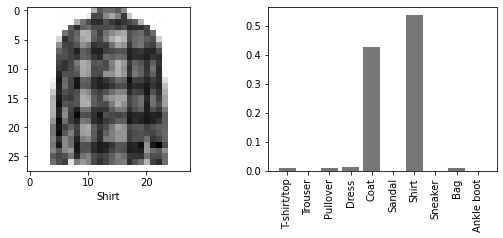

True
-------------------------------------------------


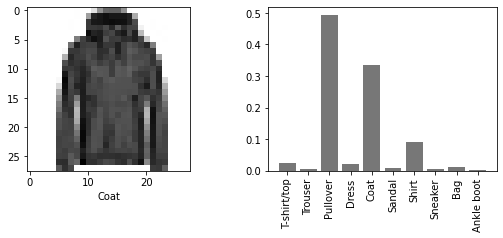

False
-------------------------------------------------


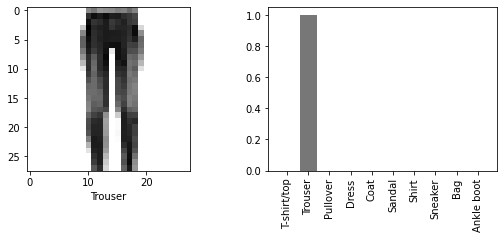

True
-------------------------------------------------


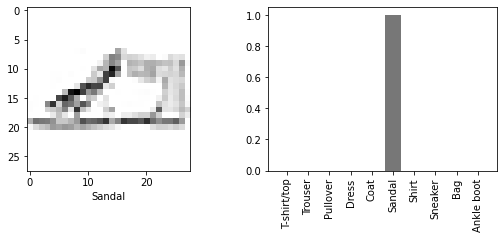

True
-------------------------------------------------


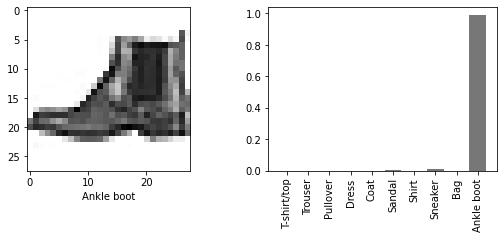

True
-------------------------------------------------


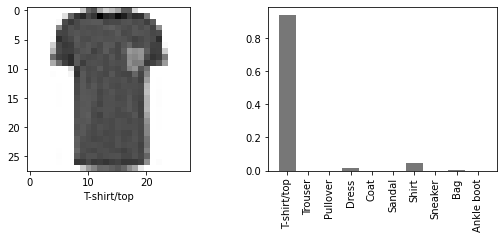

True
-------------------------------------------------


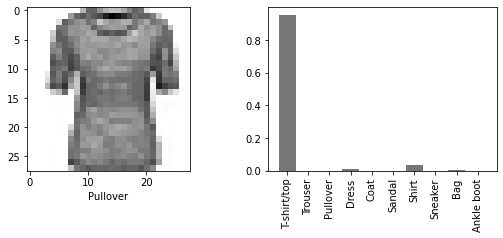

False
-------------------------------------------------


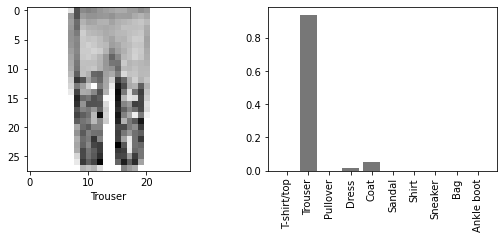

True
-------------------------------------------------


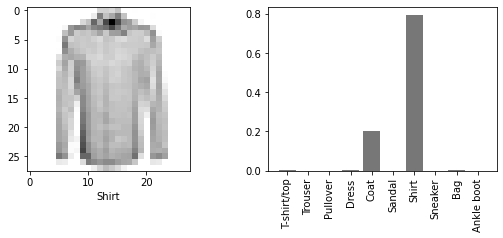

True
-------------------------------------------------


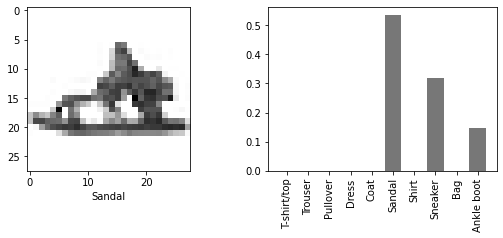

True
-------------------------------------------------


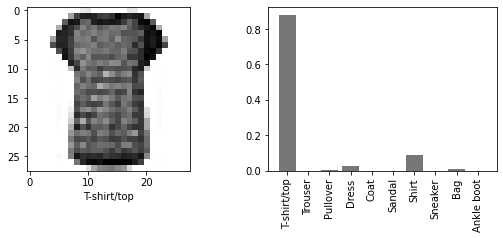

True
-------------------------------------------------


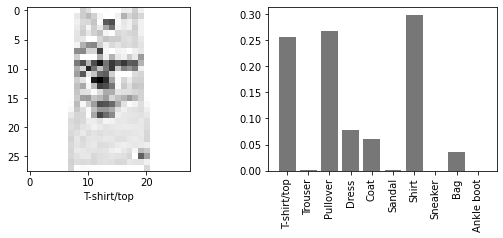

False
-------------------------------------------------


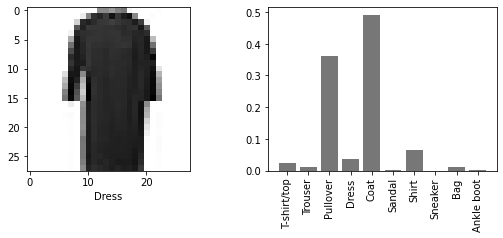

False
-------------------------------------------------


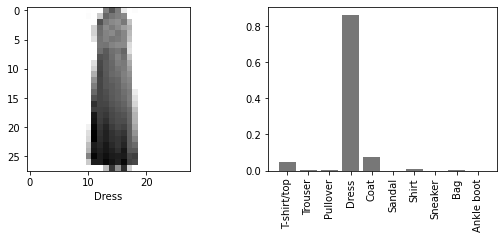

True
-------------------------------------------------


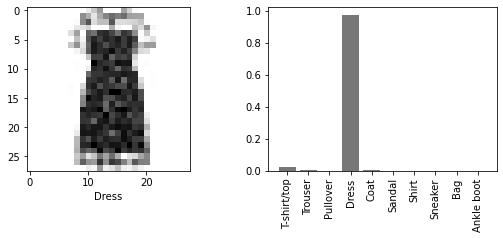

True
-------------------------------------------------


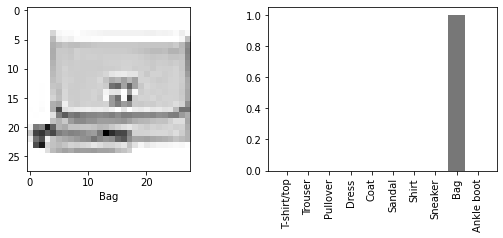

True
-------------------------------------------------


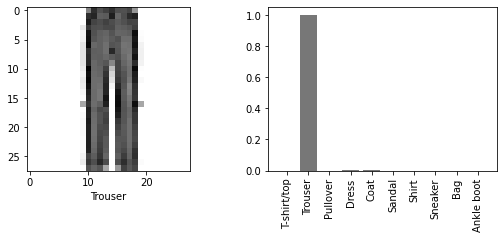

True
-------------------------------------------------


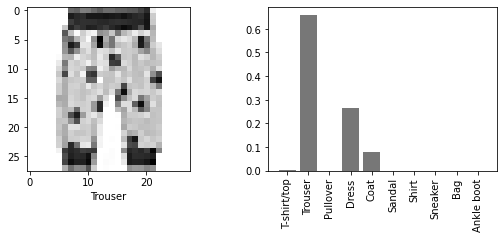

True
-------------------------------------------------


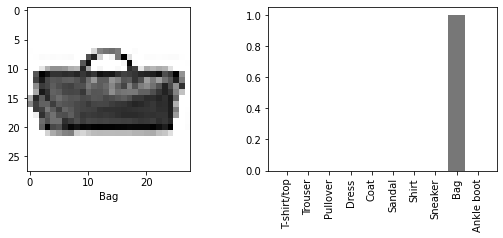

True
-------------------------------------------------


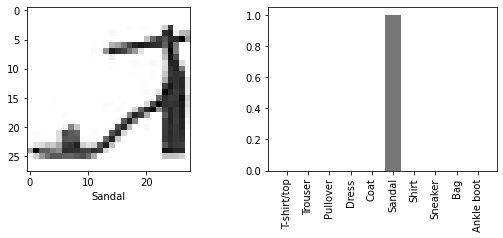

True
-------------------------------------------------


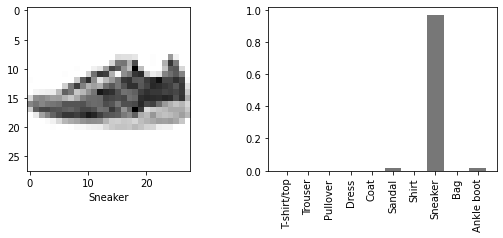

True
-------------------------------------------------


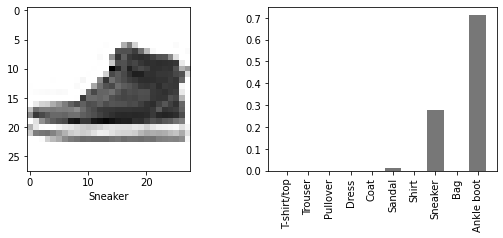

False
-------------------------------------------------


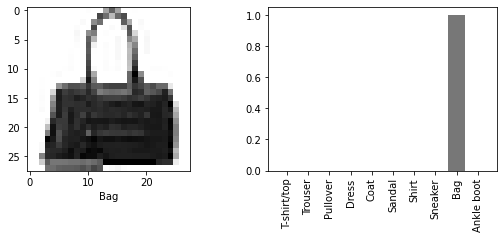

True
-------------------------------------------------


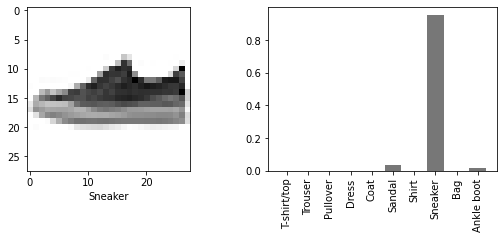

True
-------------------------------------------------


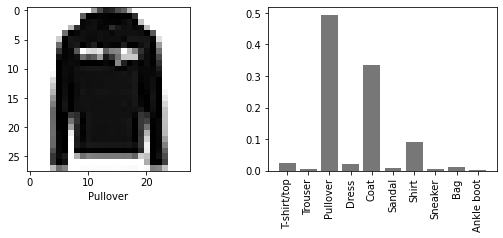

True
-------------------------------------------------


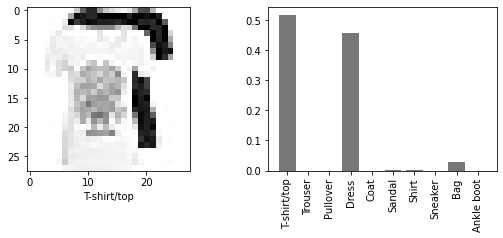

True
-------------------------------------------------


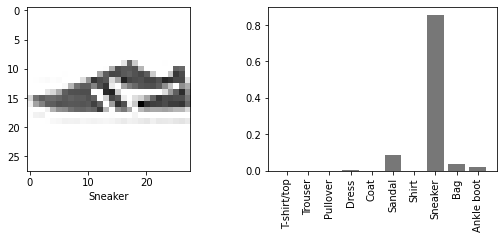

True
-------------------------------------------------


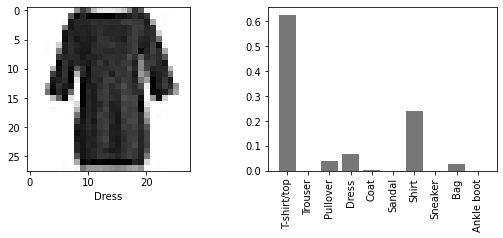

False
-------------------------------------------------


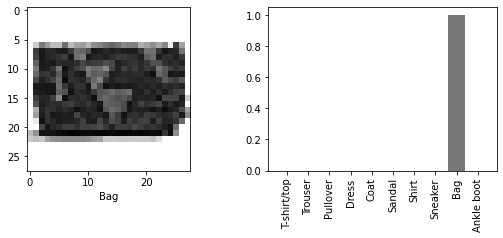

True
-------------------------------------------------


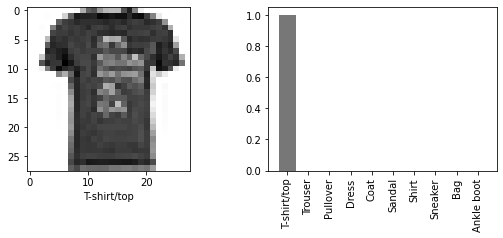

True
-------------------------------------------------


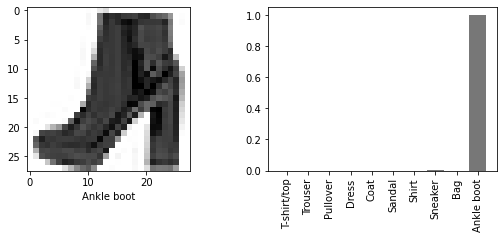

True
-------------------------------------------------


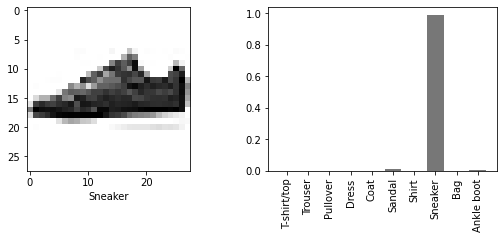

True
-------------------------------------------------


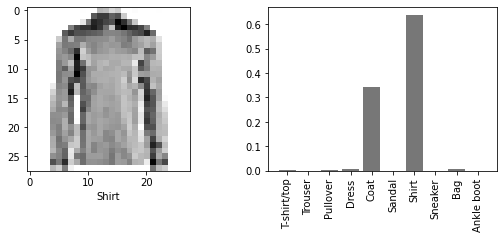

True
-------------------------------------------------


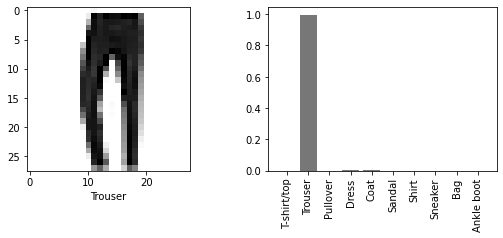

True
-------------------------------------------------


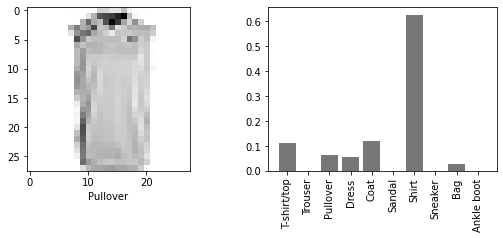

False
-------------------------------------------------


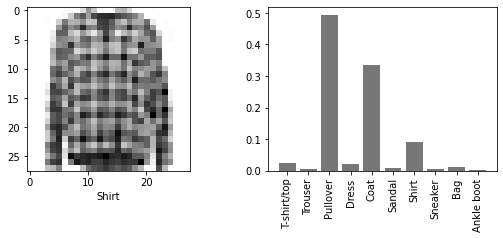

False
-------------------------------------------------


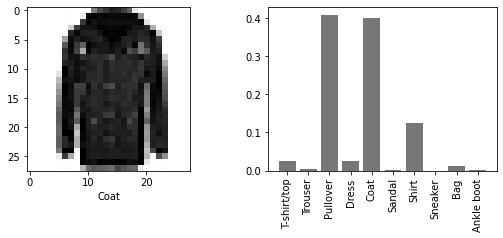

False
-------------------------------------------------


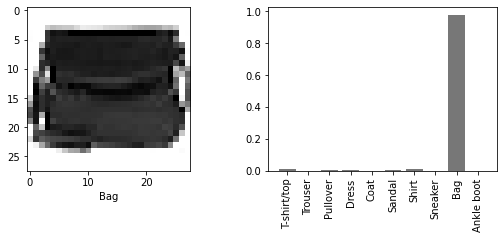

True
-------------------------------------------------


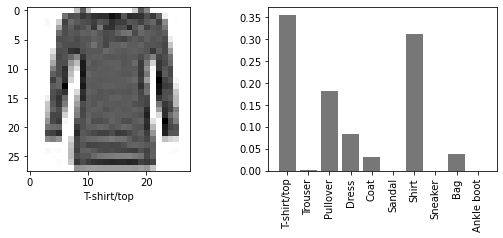

True
-------------------------------------------------


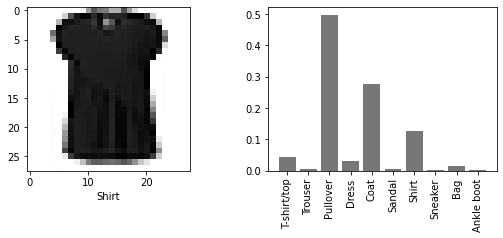

False
-------------------------------------------------


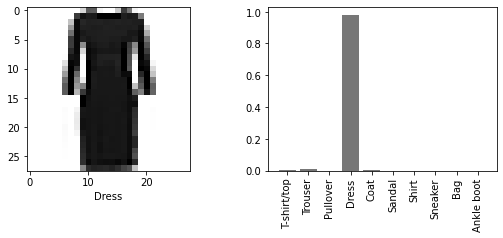

True
-------------------------------------------------


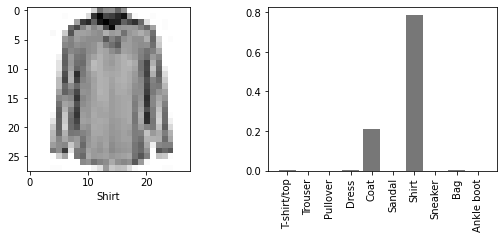

True
-------------------------------------------------


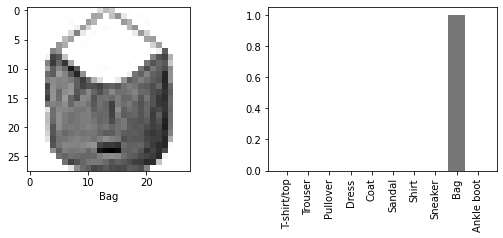

True
-------------------------------------------------


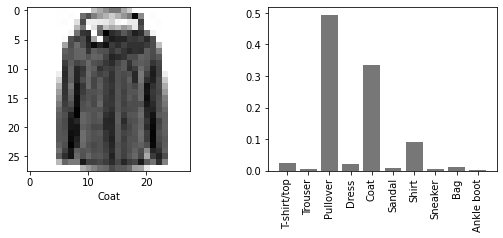

False
-------------------------------------------------


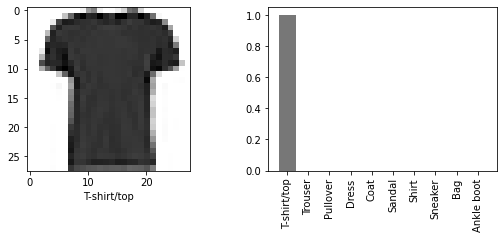

True
-------------------------------------------------


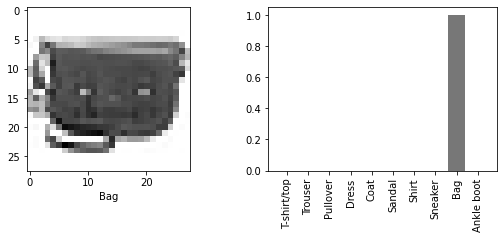

True
-------------------------------------------------


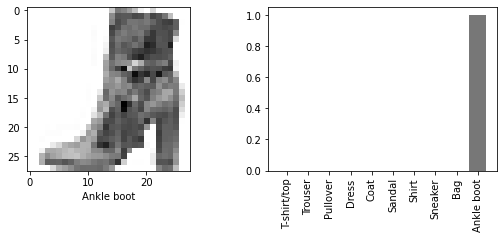

True
-------------------------------------------------


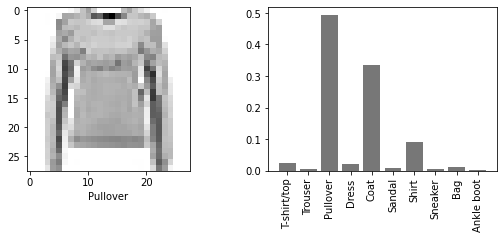

True
-------------------------------------------------


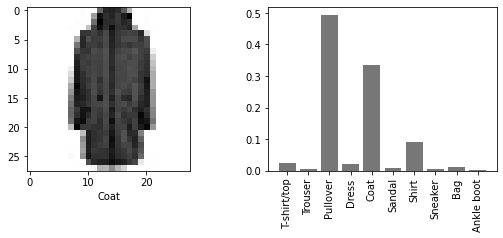

False
-------------------------------------------------


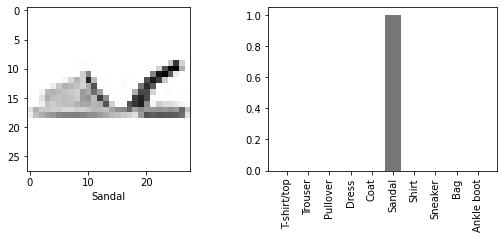

True
-------------------------------------------------


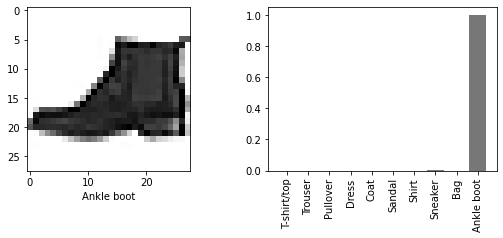

True
-------------------------------------------------


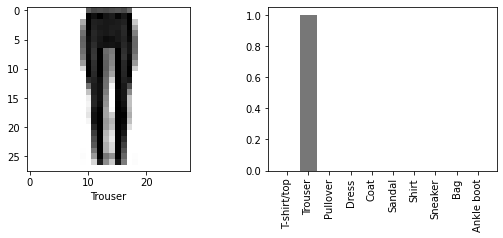

True
-------------------------------------------------


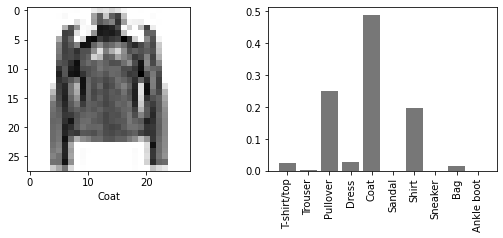

True
-------------------------------------------------


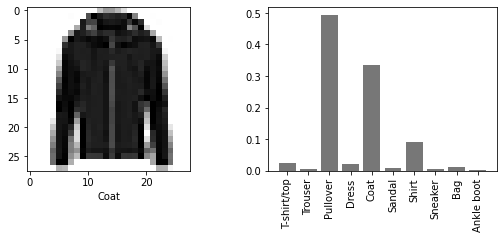

False
-------------------------------------------------


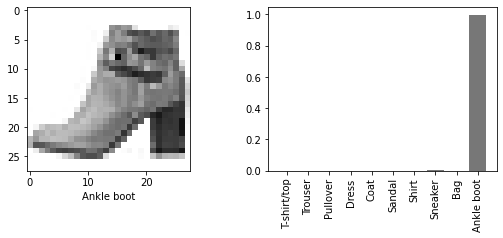

True
-------------------------------------------------


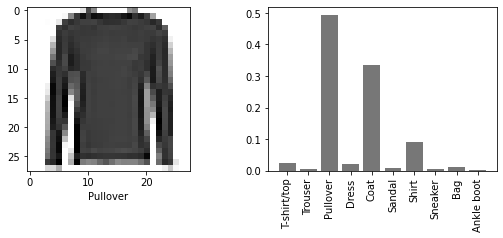

True
-------------------------------------------------


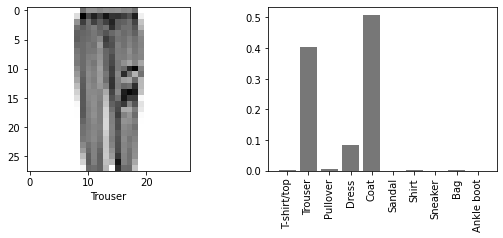

False
-------------------------------------------------


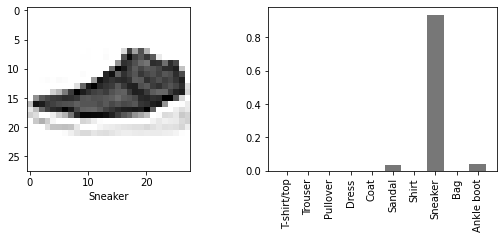

True
-------------------------------------------------


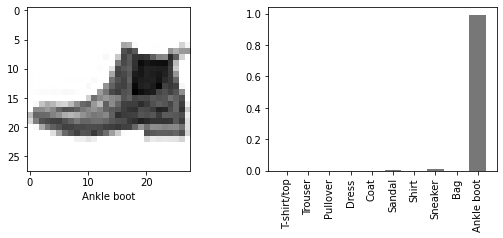

True
-------------------------------------------------


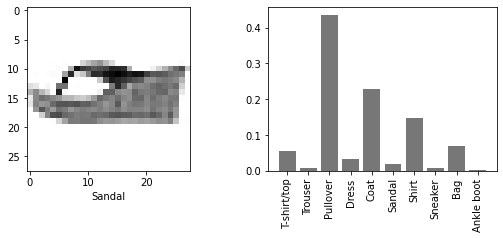

False
-------------------------------------------------


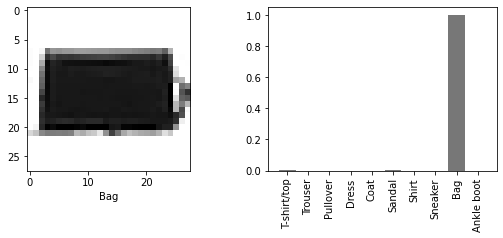

True
-------------------------------------------------


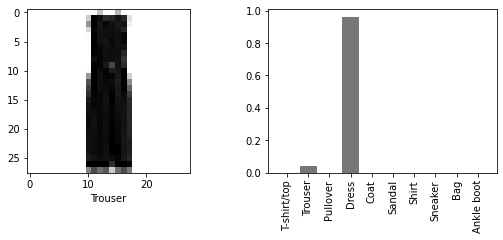

False
-------------------------------------------------


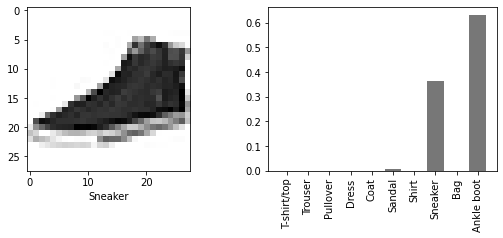

False
-------------------------------------------------


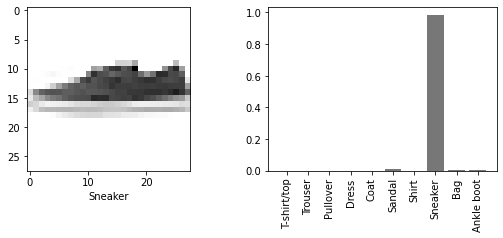

True
-------------------------------------------------


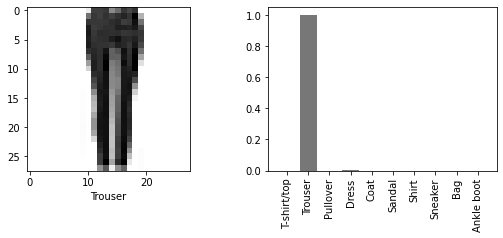

True
-------------------------------------------------


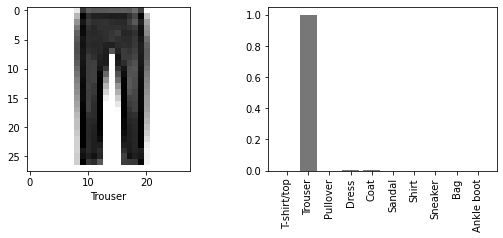

True
-------------------------------------------------


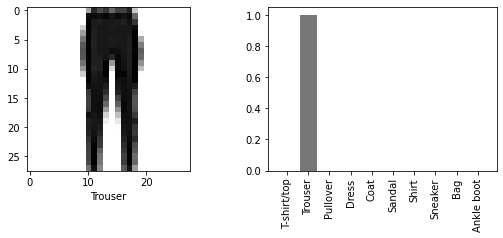

True
-------------------------------------------------


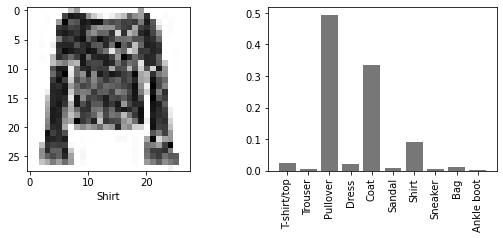

False
-------------------------------------------------


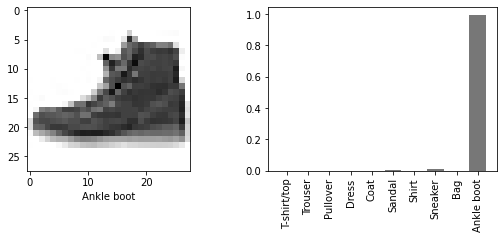

True
-------------------------------------------------


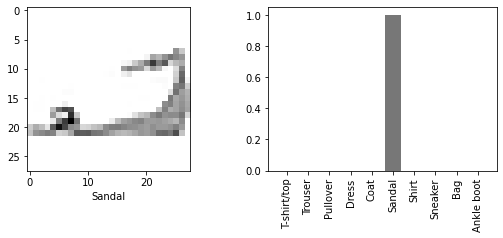

True
-------------------------------------------------


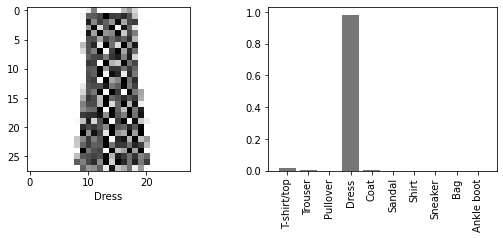

True
-------------------------------------------------


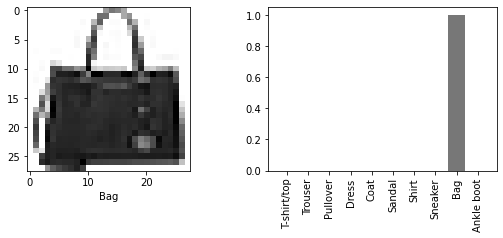

True
-------------------------------------------------


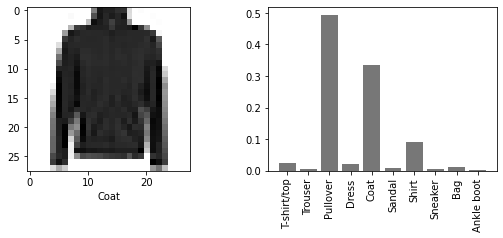

False
-------------------------------------------------


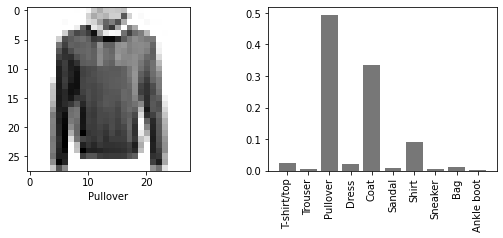

True
-------------------------------------------------


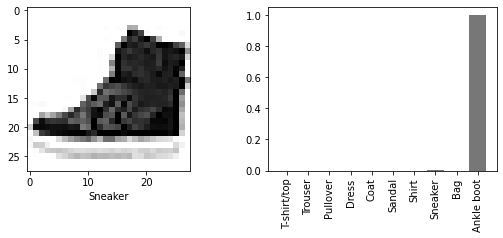

False
-------------------------------------------------


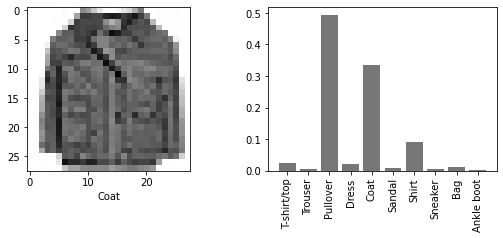

False
-------------------------------------------------


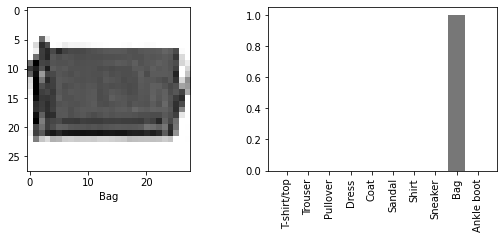

True
-------------------------------------------------


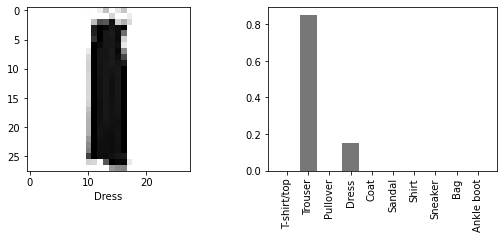

False
-------------------------------------------------


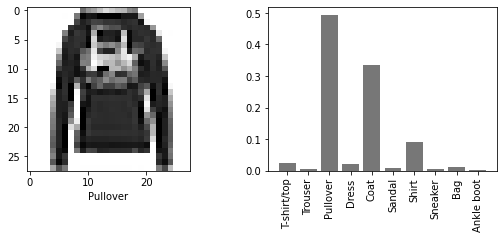

True
-------------------------------------------------


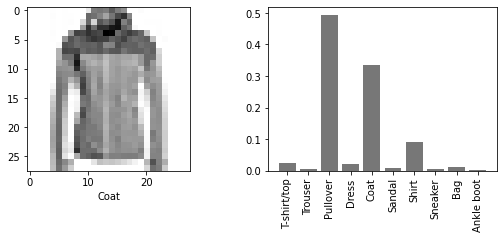

False
-------------------------------------------------


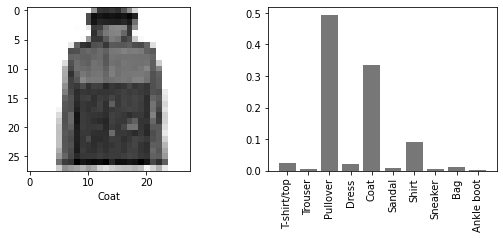

False
-------------------------------------------------


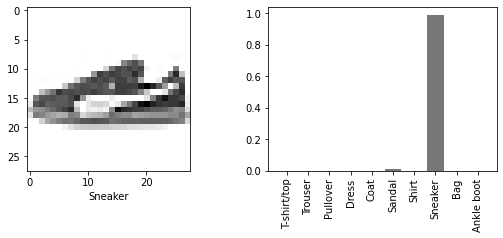

True
-------------------------------------------------


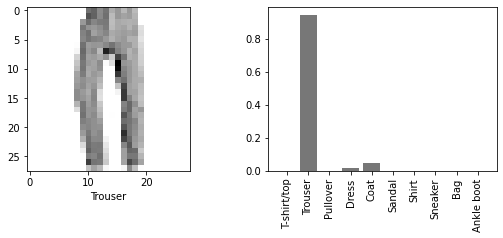

True
-------------------------------------------------


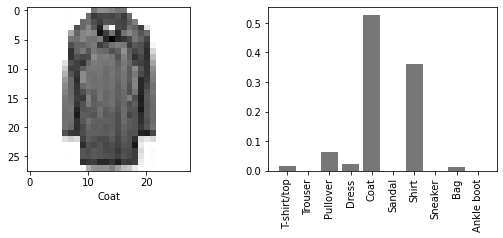

True
-------------------------------------------------


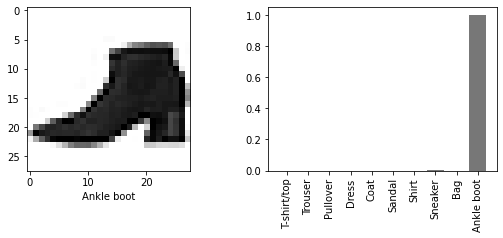

True
-------------------------------------------------


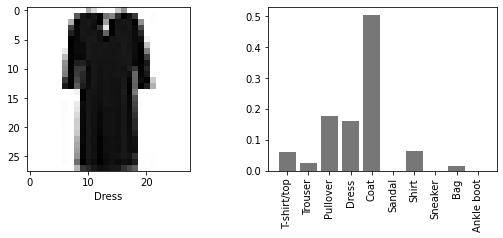

False
-------------------------------------------------


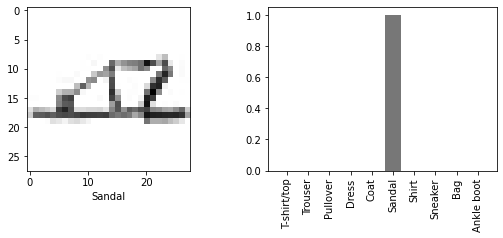

True
-------------------------------------------------


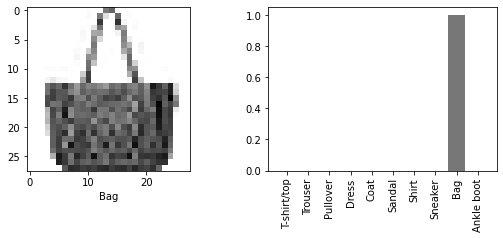

True
-------------------------------------------------


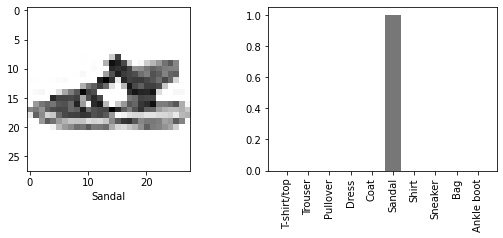

True
-------------------------------------------------


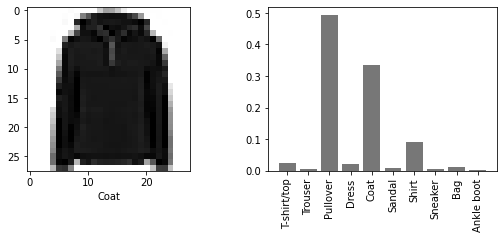

False
-------------------------------------------------


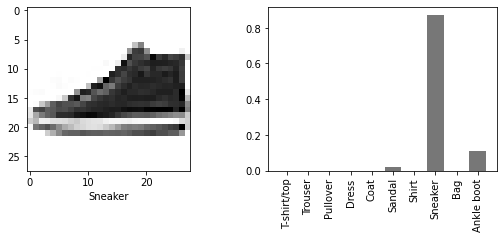

True
-------------------------------------------------


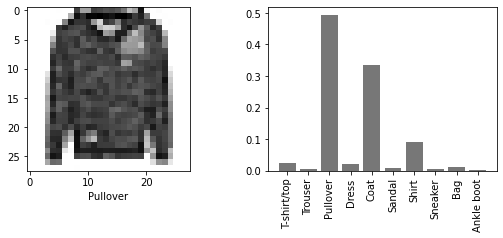

True
-------------------------------------------------


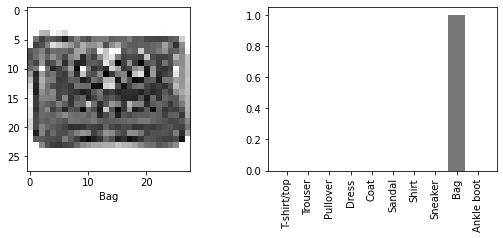

True
-------------------------------------------------


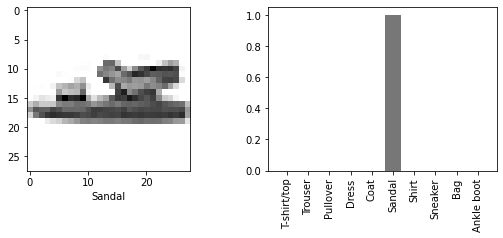

True
-------------------------------------------------


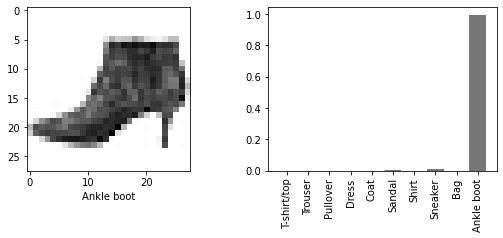

True
-------------------------------------------------


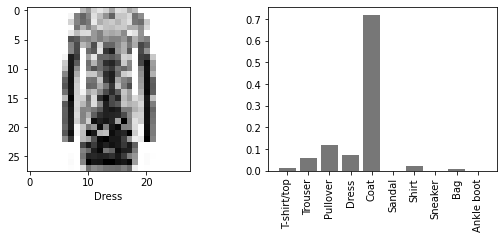

False
-------------------------------------------------


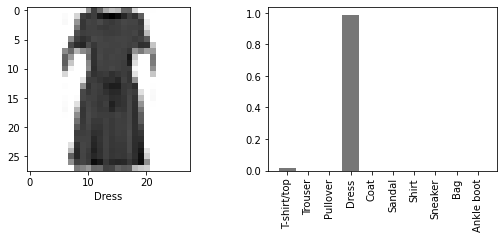

True
-------------------------------------------------


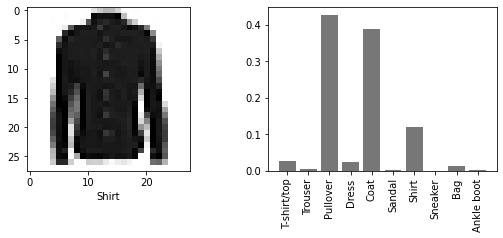

False
-------------------------------------------------


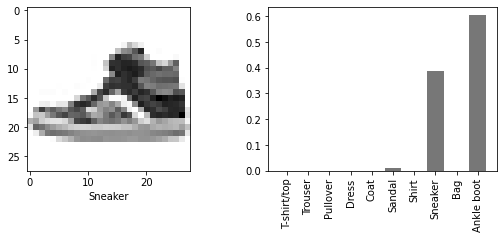

False
-------------------------------------------------


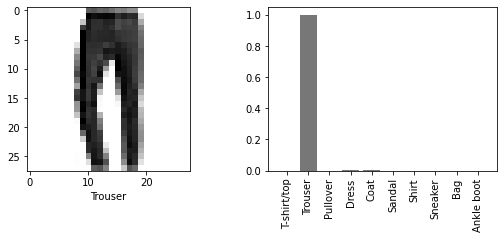

True
-------------------------------------------------


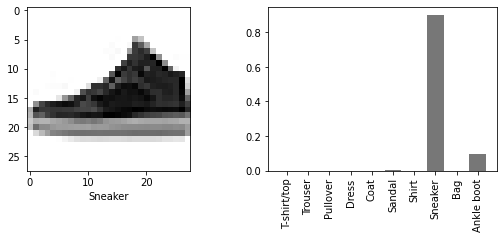

True
-------------------------------------------------


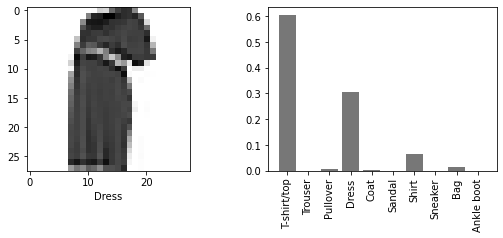

False
-------------------------------------------------


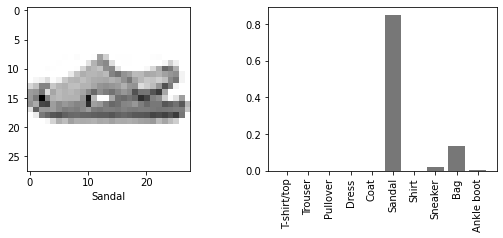

True
-------------------------------------------------


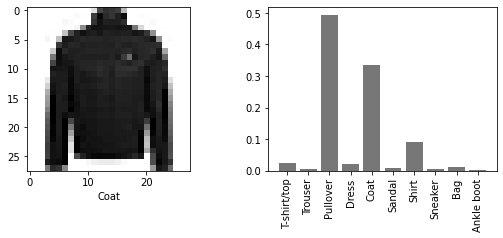

False
-------------------------------------------------


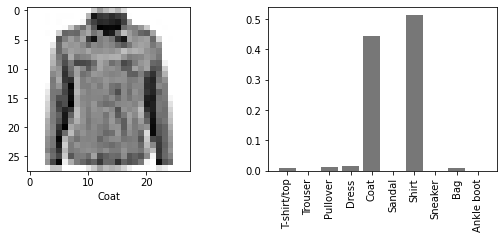

False
-------------------------------------------------


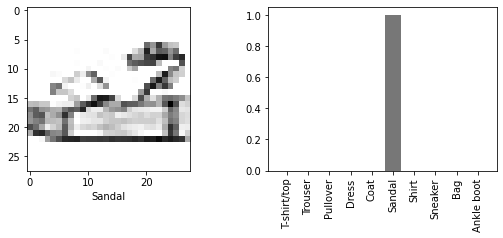

True
-------------------------------------------------


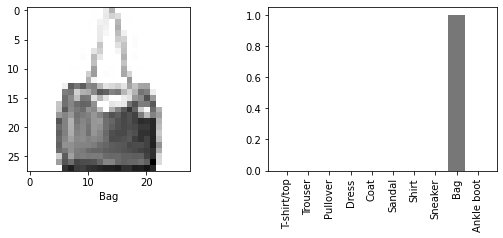

True
-------------------------------------------------


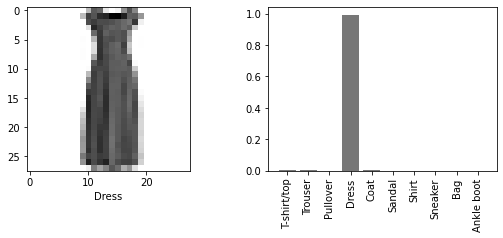

True
-------------------------------------------------


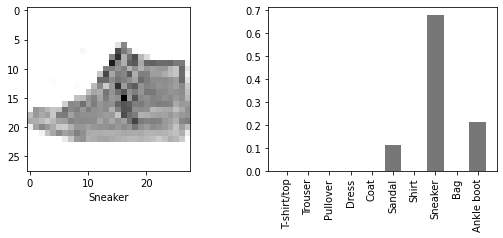

True
-------------------------------------------------


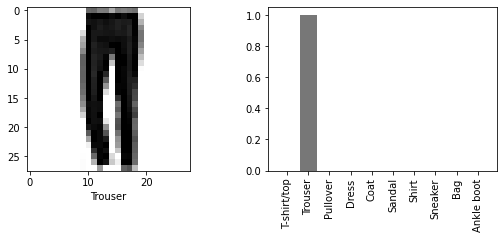

True
-------------------------------------------------


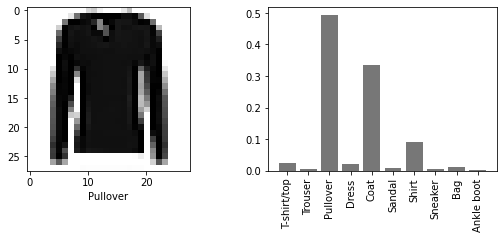

True
-------------------------------------------------


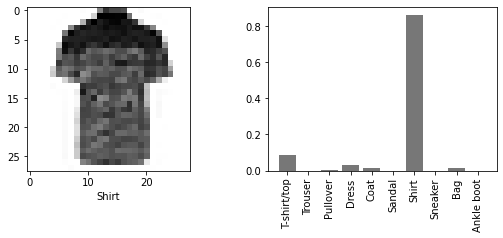

True
-------------------------------------------------


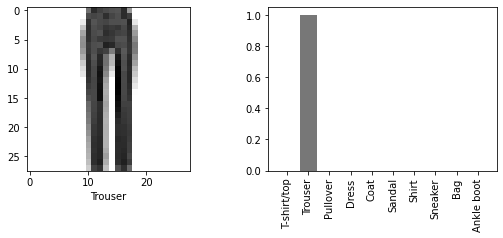

True
-------------------------------------------------


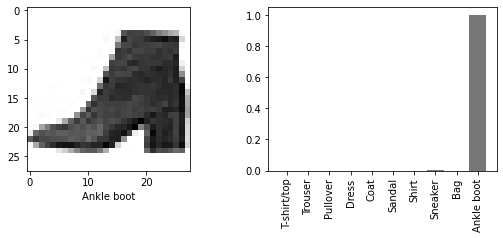

True
-------------------------------------------------


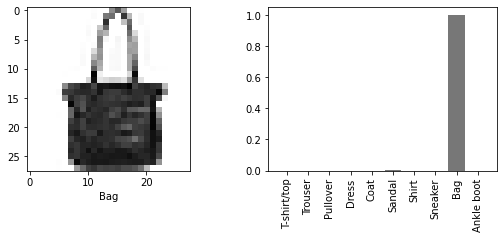

True
-------------------------------------------------


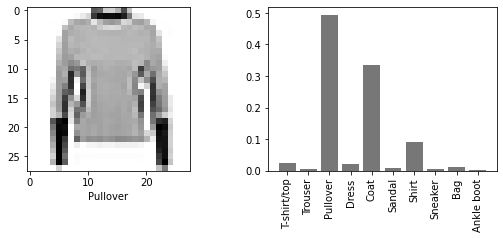

True
-------------------------------------------------


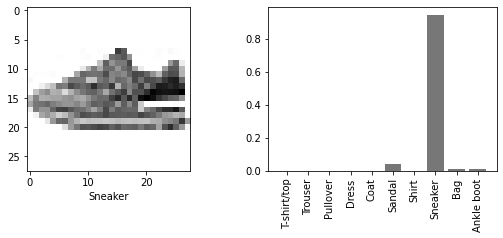

True
-------------------------------------------------


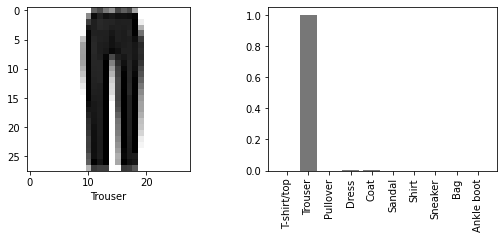

True
-------------------------------------------------


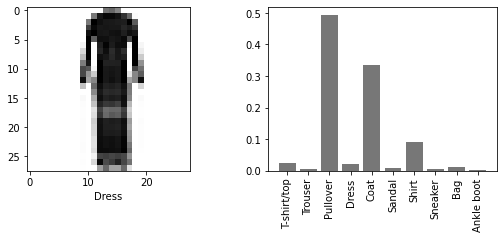

False
-------------------------------------------------


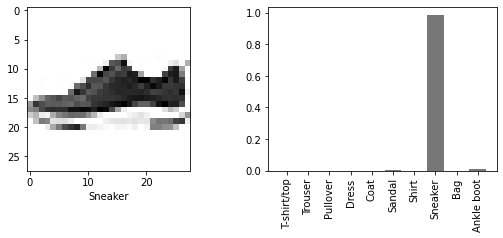

True
-------------------------------------------------


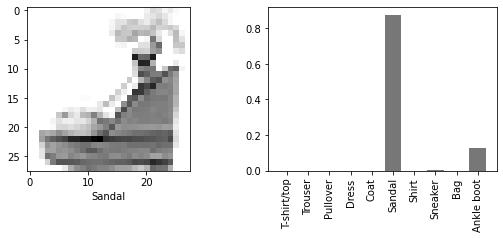

True
-------------------------------------------------


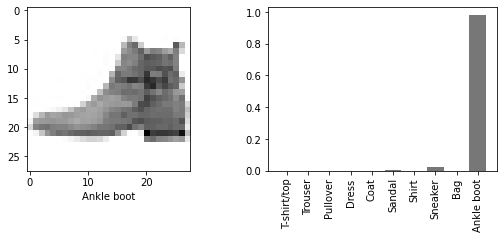

True
-------------------------------------------------


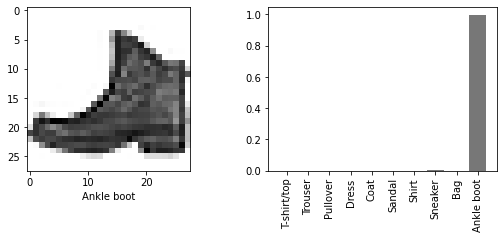

True
-------------------------------------------------


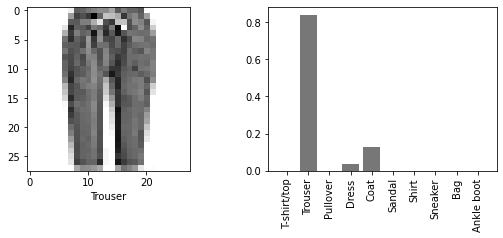

True
-------------------------------------------------


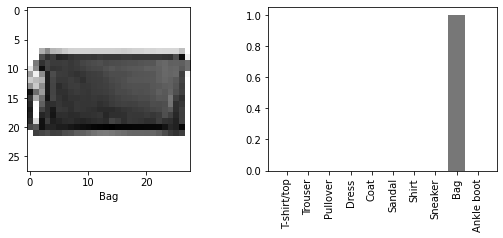

True
-------------------------------------------------


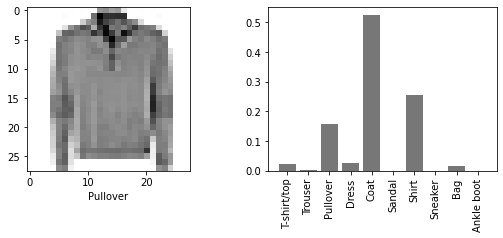

False
-------------------------------------------------


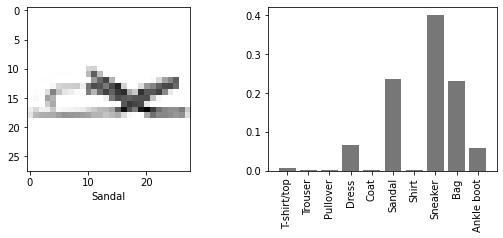

False
-------------------------------------------------


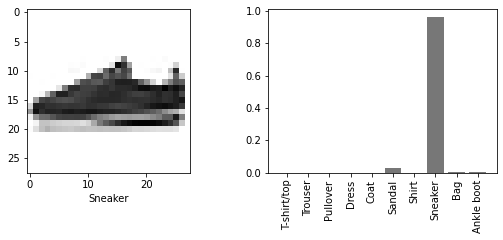

True
-------------------------------------------------


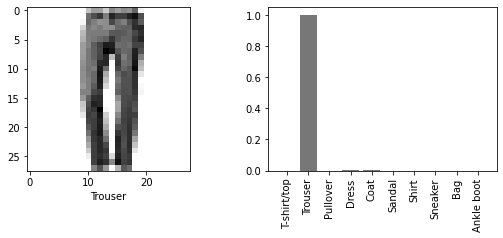

True
-------------------------------------------------


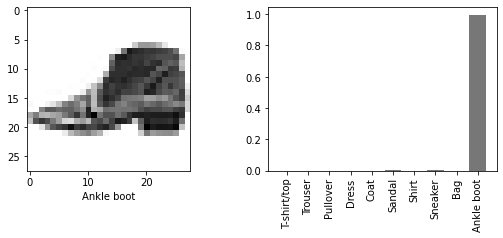

True
-------------------------------------------------


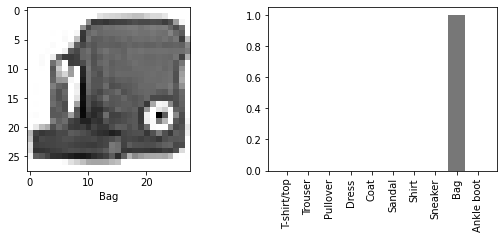

True
-------------------------------------------------


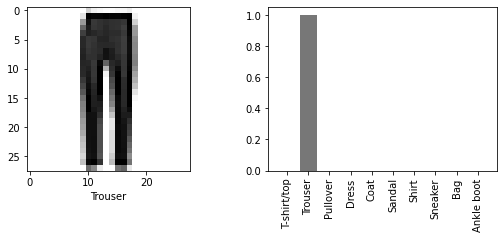

True
-------------------------------------------------


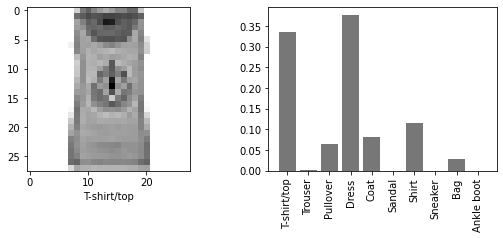

False
-------------------------------------------------


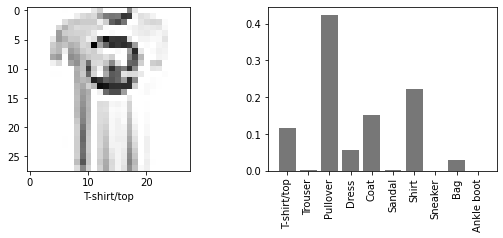

False
-------------------------------------------------


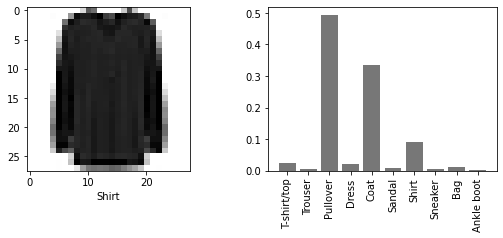

False
-------------------------------------------------


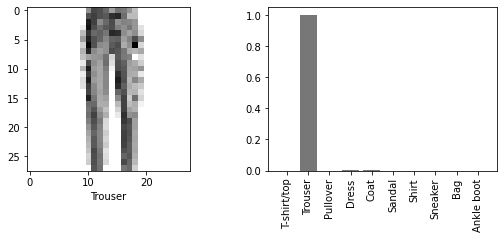

True
-------------------------------------------------


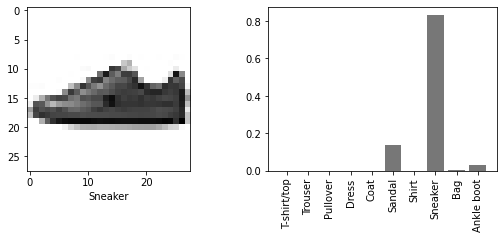

True
-------------------------------------------------


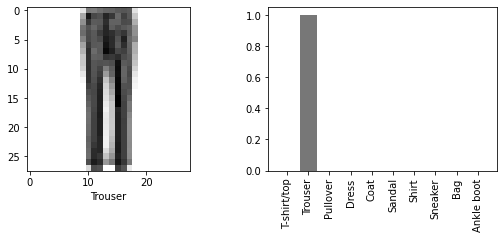

True
-------------------------------------------------


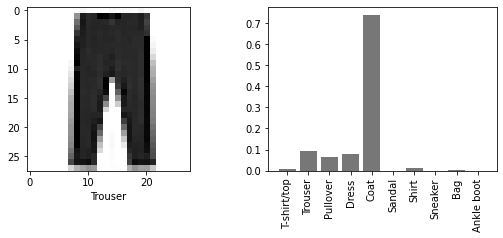

False
-------------------------------------------------


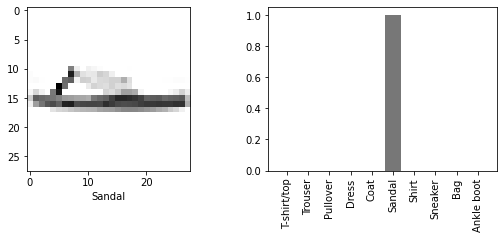

True
-------------------------------------------------


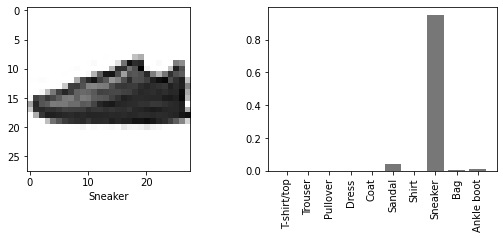

True
-------------------------------------------------


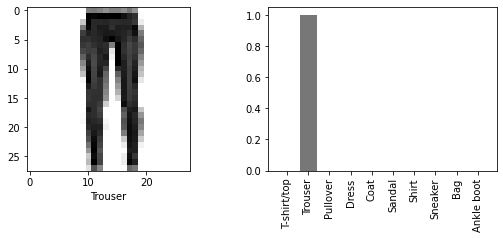

True
-------------------------------------------------


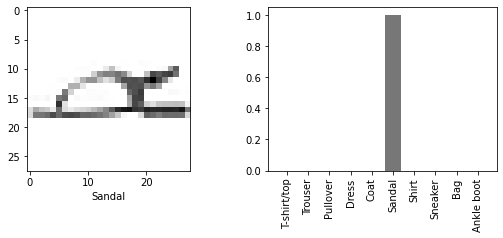

True
-------------------------------------------------


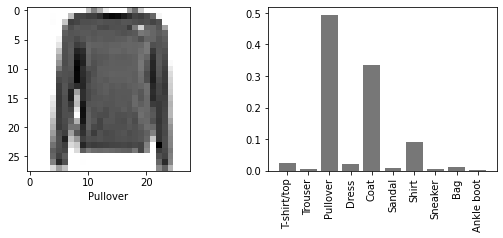

True
-------------------------------------------------


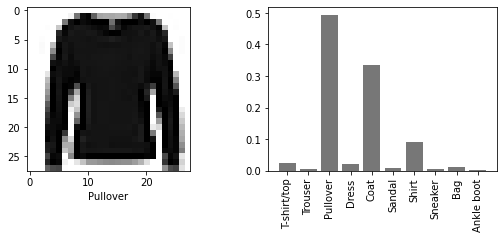

True
-------------------------------------------------


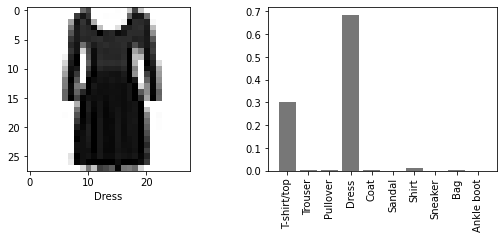

True
-------------------------------------------------


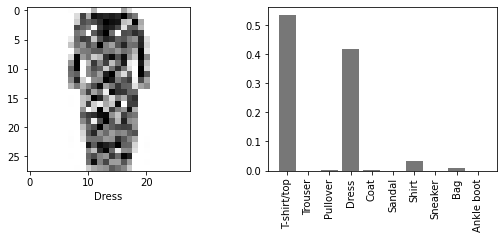

False
-------------------------------------------------


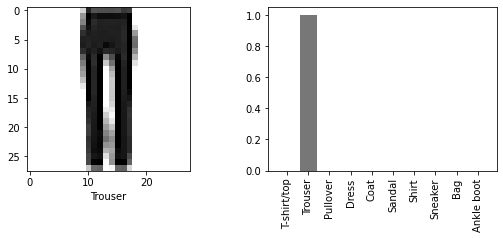

True
-------------------------------------------------


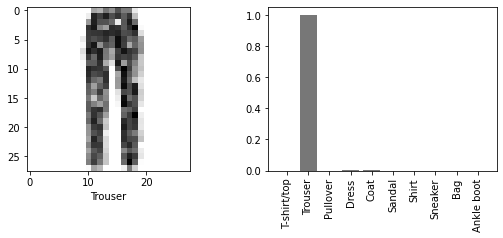

True
-------------------------------------------------


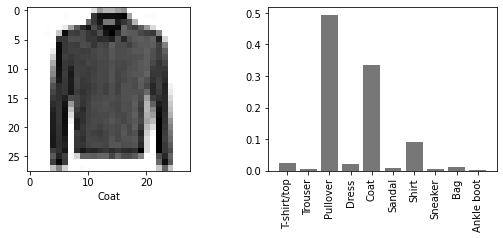

False
-------------------------------------------------


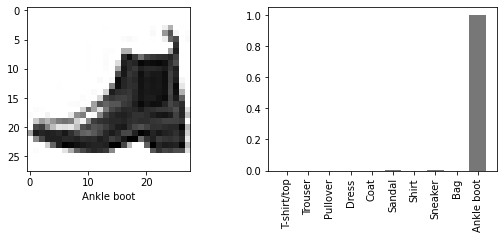

True
-------------------------------------------------


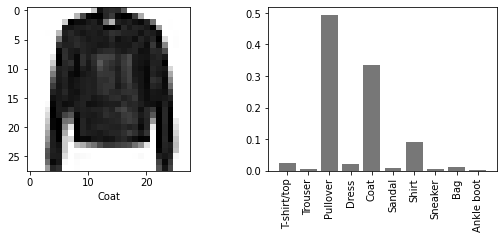

False
-------------------------------------------------


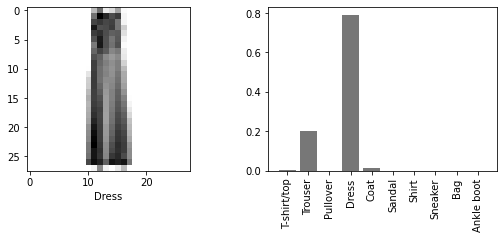

True
-------------------------------------------------


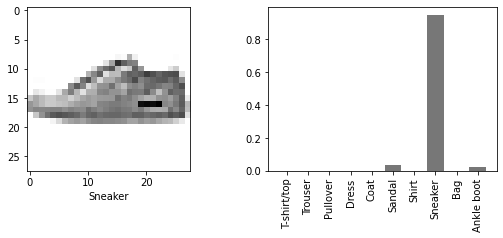

True
-------------------------------------------------


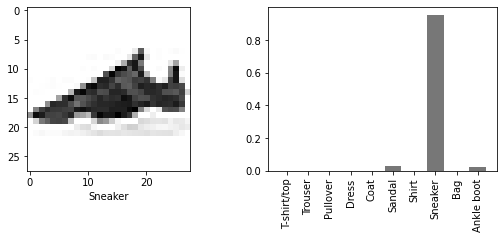

True
-------------------------------------------------


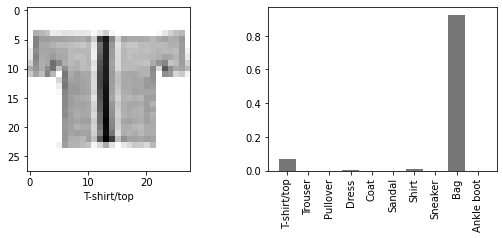

False
-------------------------------------------------


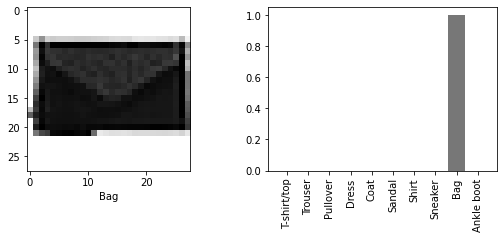

True
-------------------------------------------------


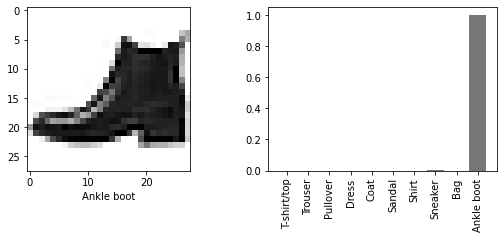

True
-------------------------------------------------


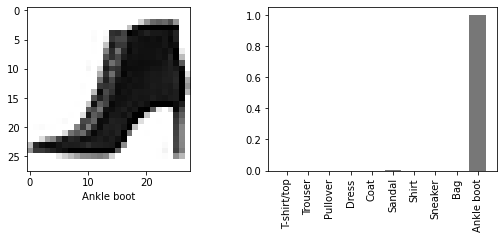

True
-------------------------------------------------


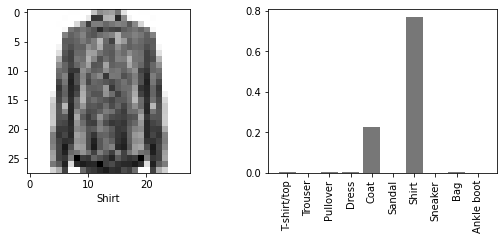

True
-------------------------------------------------


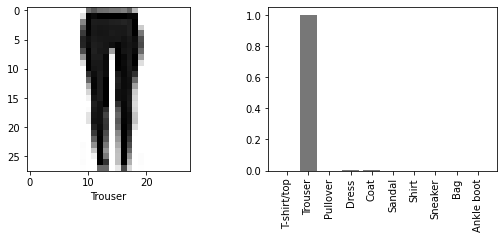

True
-------------------------------------------------


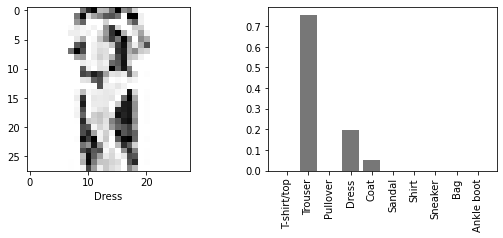

False
-------------------------------------------------


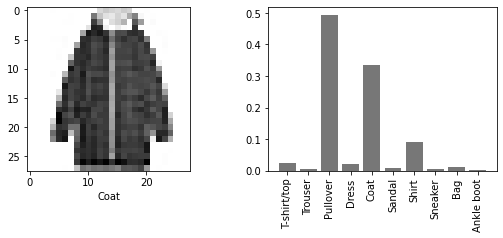

False
-------------------------------------------------


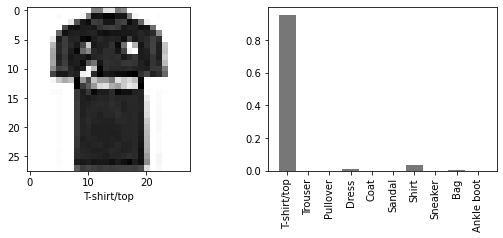

True
-------------------------------------------------


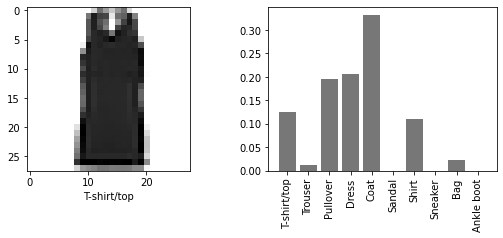

False
-------------------------------------------------


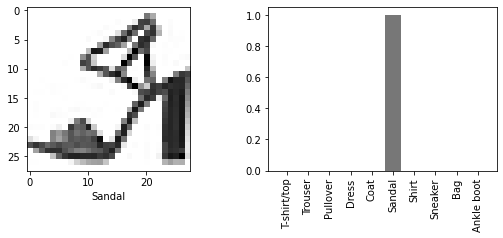

True
-------------------------------------------------


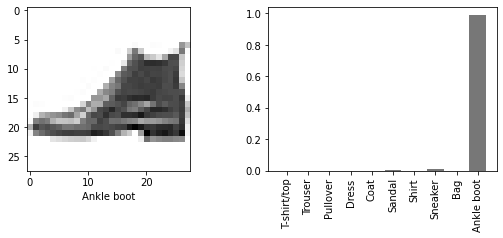

True
-------------------------------------------------


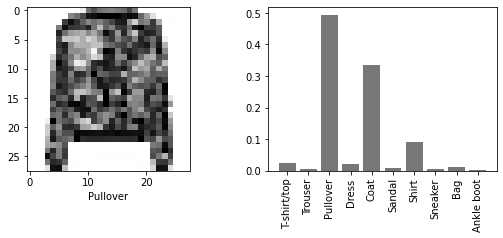

True
-------------------------------------------------


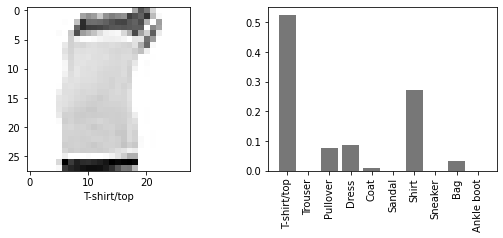

True
-------------------------------------------------


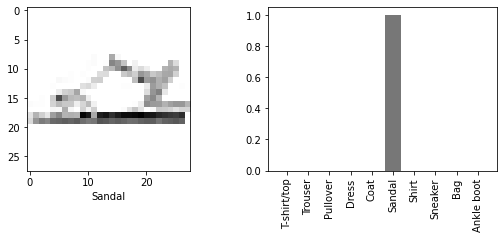

True
-------------------------------------------------


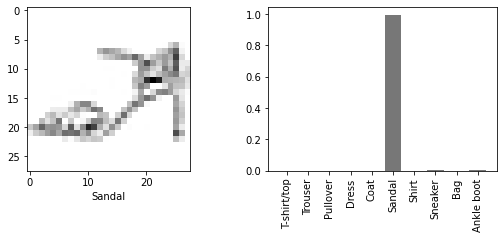

True
-------------------------------------------------


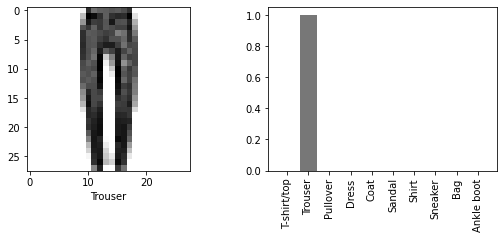

True
-------------------------------------------------


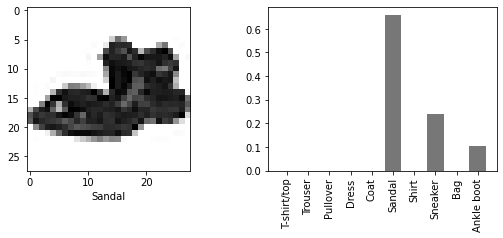

True
-------------------------------------------------


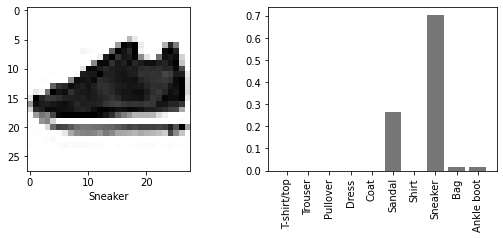

True
-------------------------------------------------


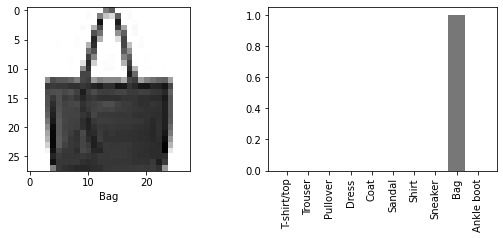

True
-------------------------------------------------


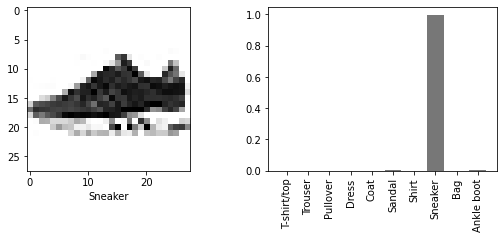

True
-------------------------------------------------


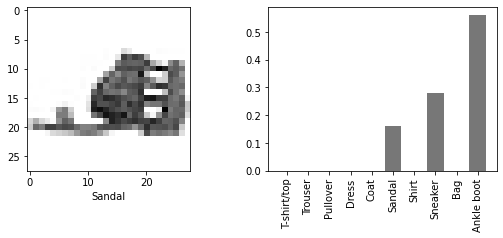

False
-------------------------------------------------


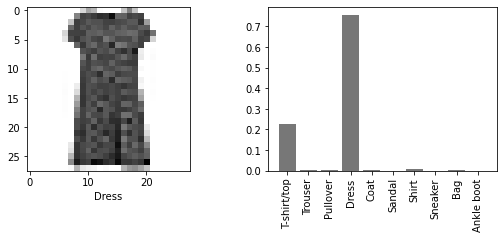

True
-------------------------------------------------


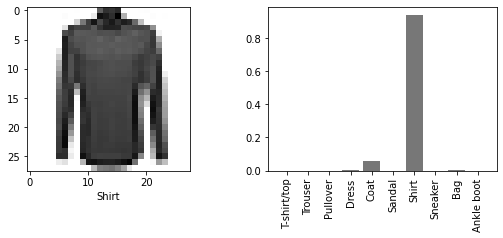

True
-------------------------------------------------


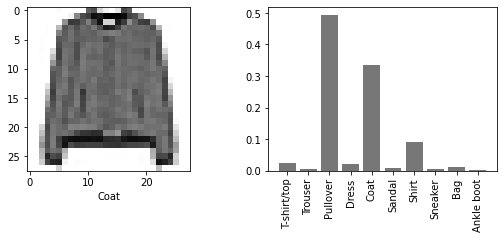

False
-------------------------------------------------


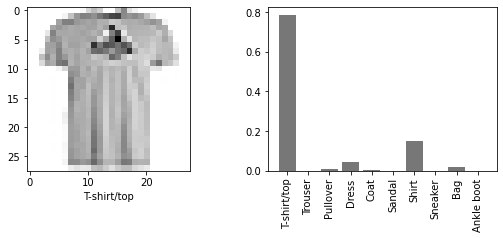

True
-------------------------------------------------


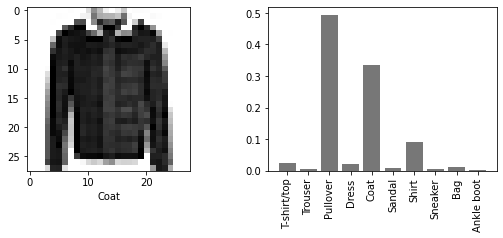

False
-------------------------------------------------


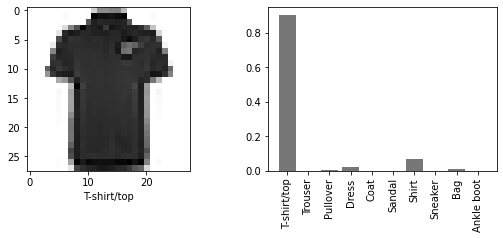

True
-------------------------------------------------


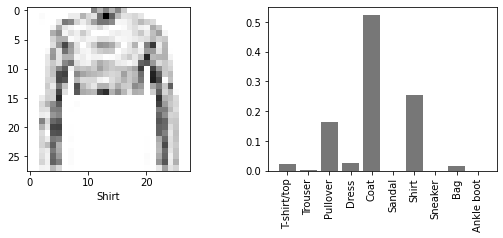

False
-------------------------------------------------


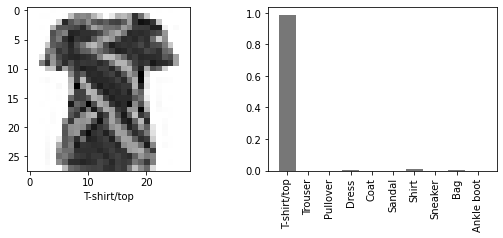

True
-------------------------------------------------


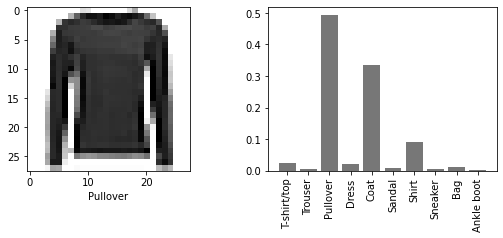

True
-------------------------------------------------


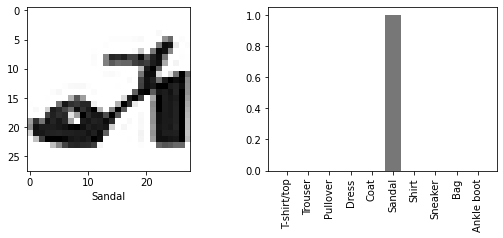

True
-------------------------------------------------


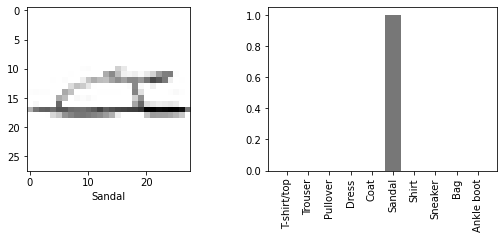

True
-------------------------------------------------


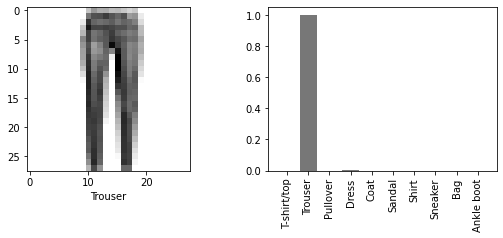

True
-------------------------------------------------


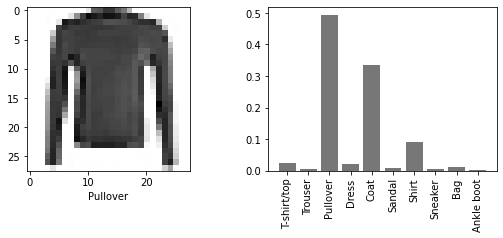

True
-------------------------------------------------


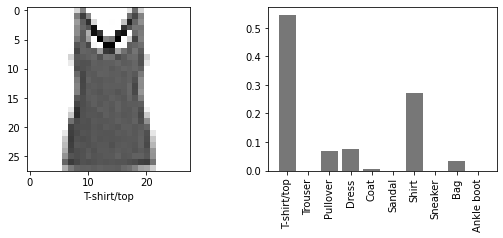

True
-------------------------------------------------


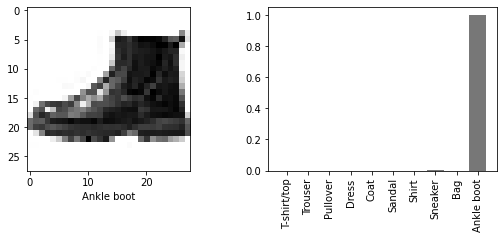

True
-------------------------------------------------


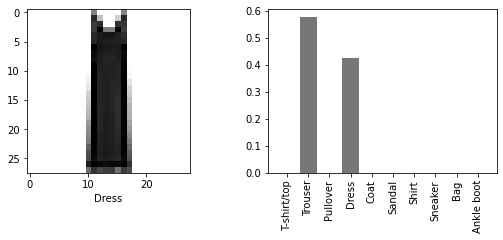

False
-------------------------------------------------


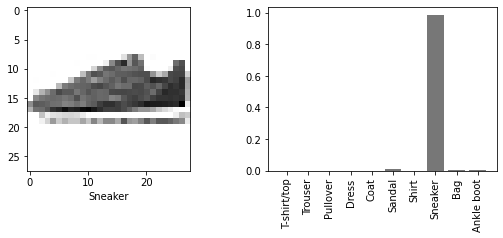

True
-------------------------------------------------


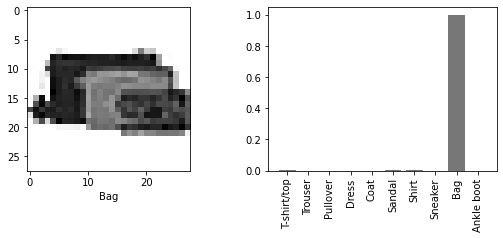

True
-------------------------------------------------


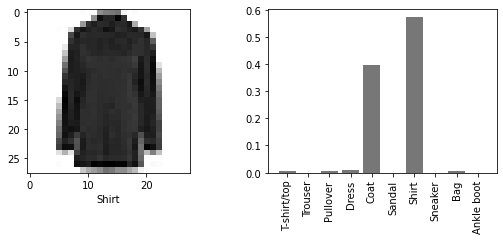

True
-------------------------------------------------


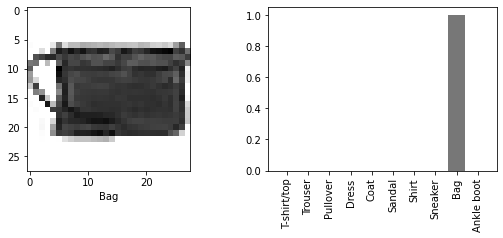

True
-------------------------------------------------


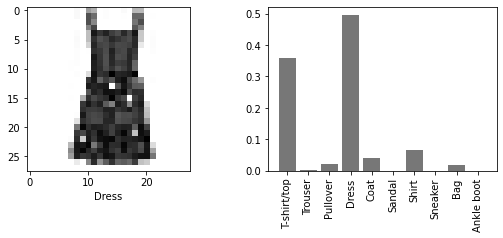

True
-------------------------------------------------


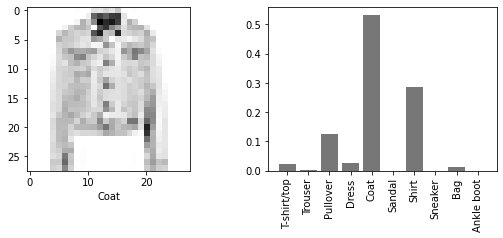

True
-------------------------------------------------


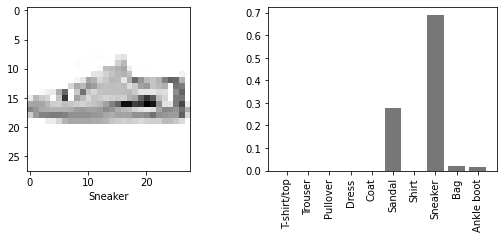

True
-------------------------------------------------


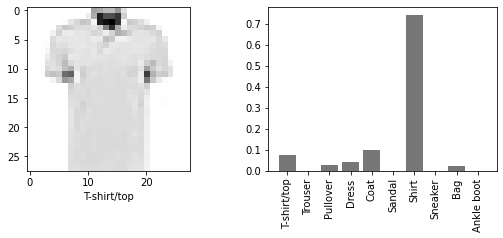

False
-------------------------------------------------


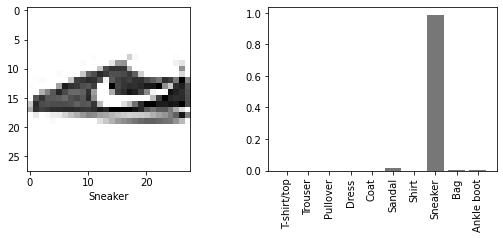

True
-------------------------------------------------


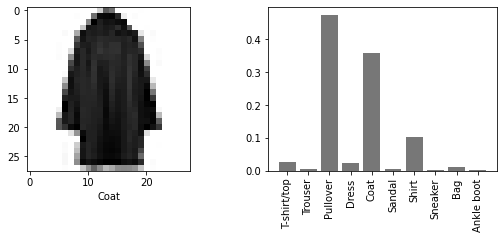

False
-------------------------------------------------


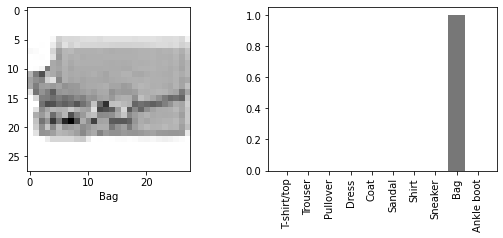

True
-------------------------------------------------


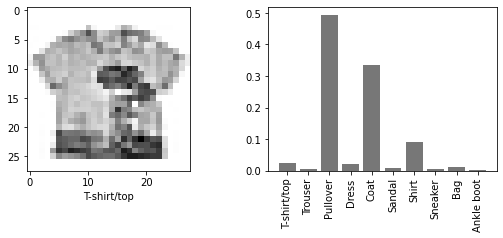

False
-------------------------------------------------


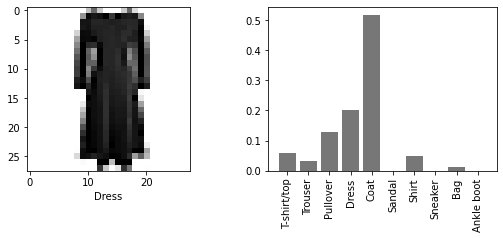

False
-------------------------------------------------


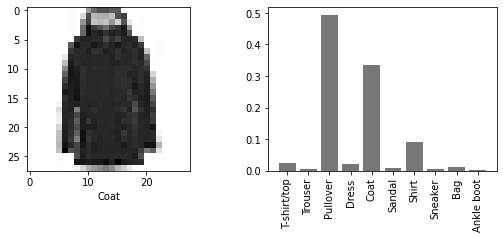

False
-------------------------------------------------


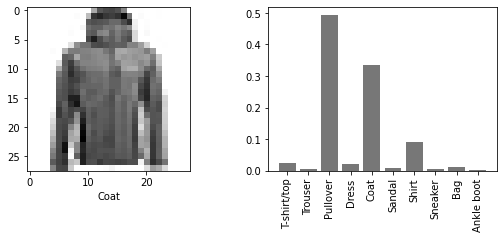

False
-------------------------------------------------


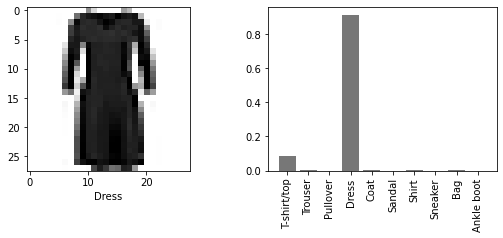

True
-------------------------------------------------


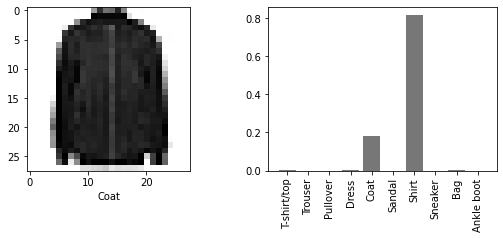

False
-------------------------------------------------


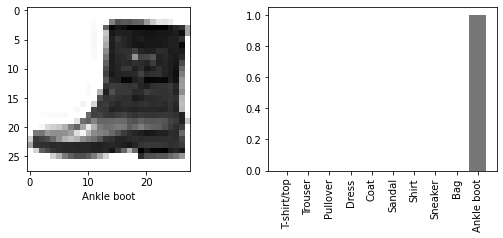

True
-------------------------------------------------


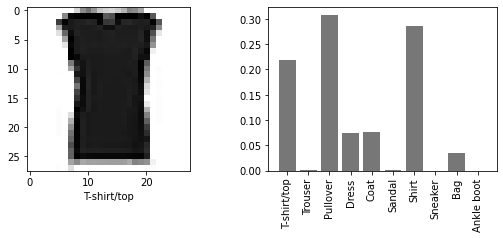

False
-------------------------------------------------


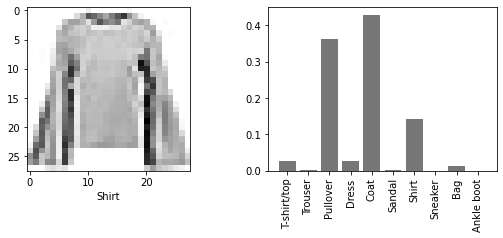

False
-------------------------------------------------


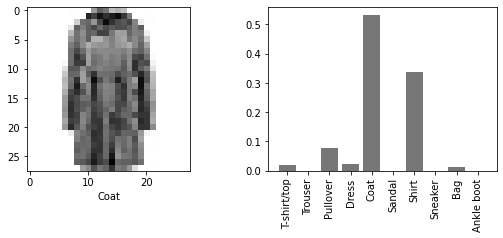

True
-------------------------------------------------


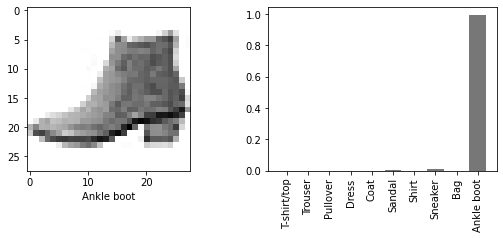

True
-------------------------------------------------


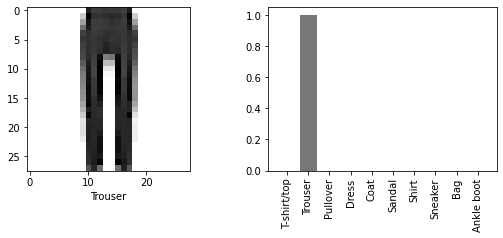

True
-------------------------------------------------


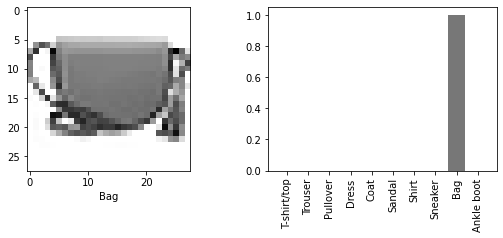

True
-------------------------------------------------


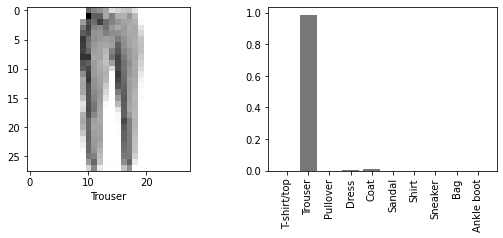

True
-------------------------------------------------


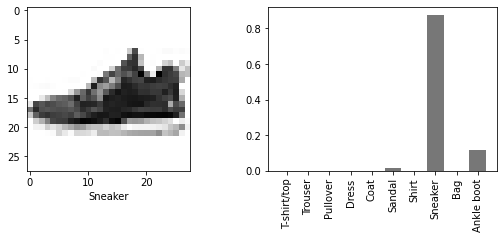

True
-------------------------------------------------


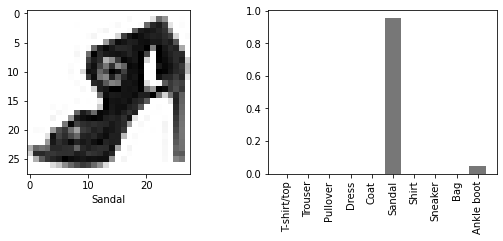

True
-------------------------------------------------


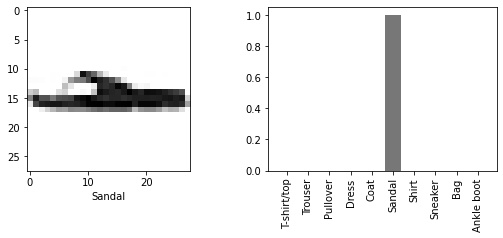

True
-------------------------------------------------


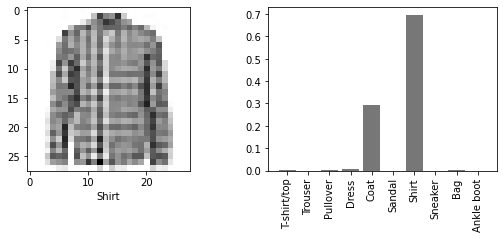

True
-------------------------------------------------


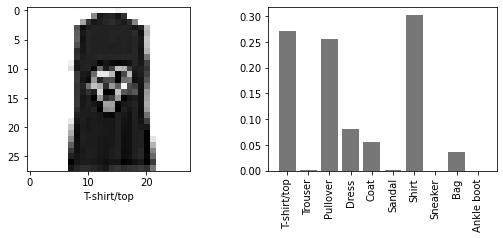

False
-------------------------------------------------


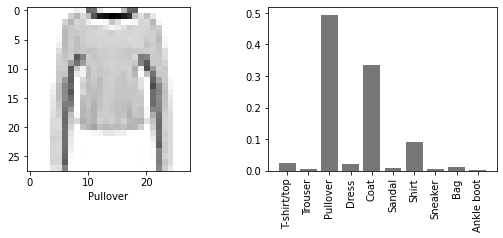

True
-------------------------------------------------


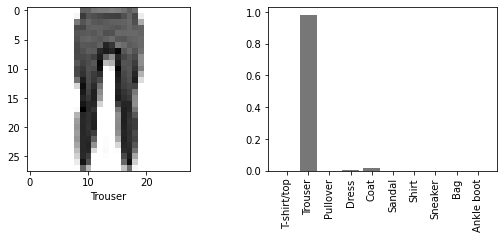

True
-------------------------------------------------


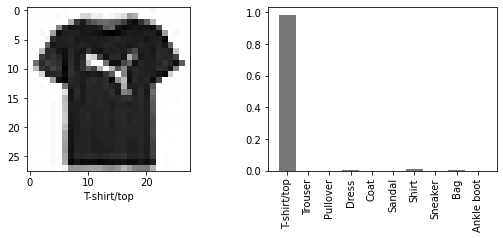

True
-------------------------------------------------


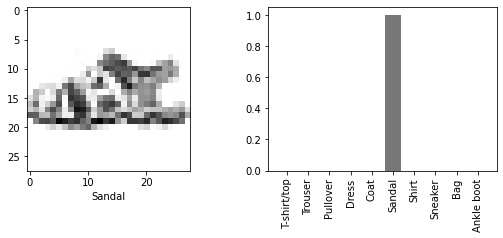

True
-------------------------------------------------


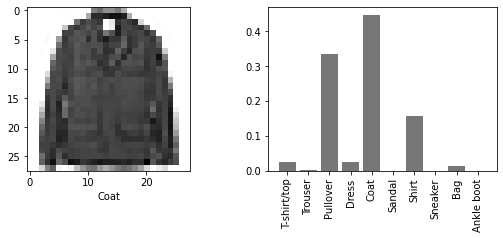

True
-------------------------------------------------


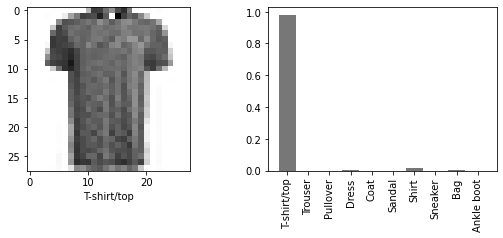

True
-------------------------------------------------


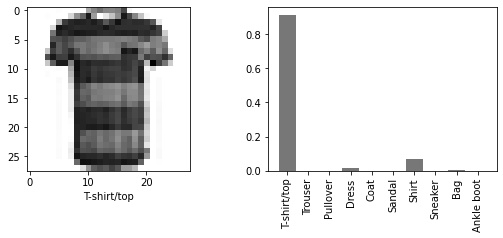

True
-------------------------------------------------


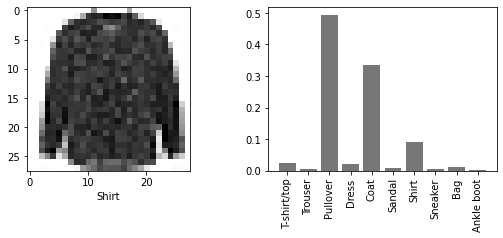

False
-------------------------------------------------


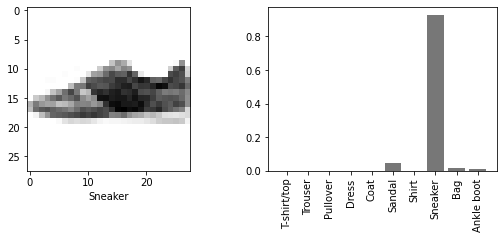

True
-------------------------------------------------


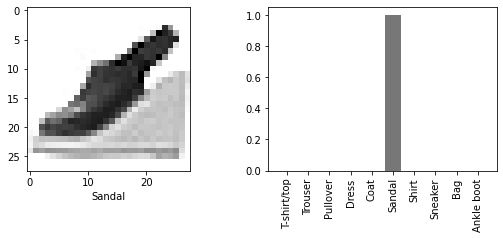

True
-------------------------------------------------


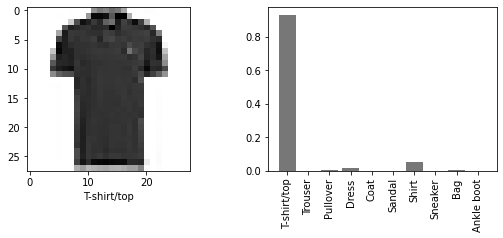

True
-------------------------------------------------


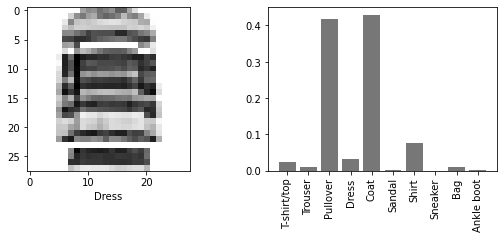

False
-------------------------------------------------


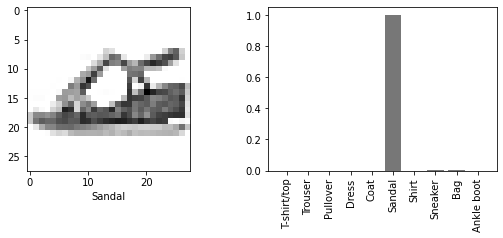

True
-------------------------------------------------


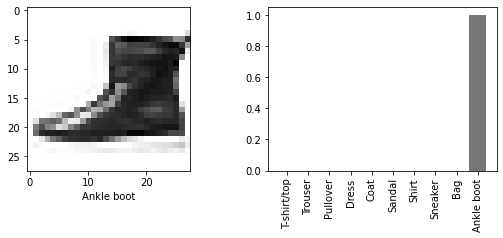

True
-------------------------------------------------


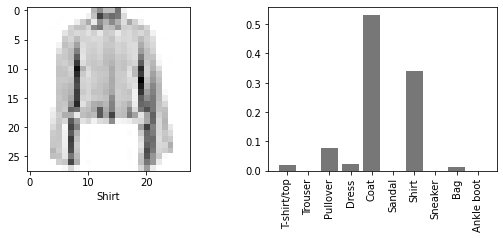

False
-------------------------------------------------


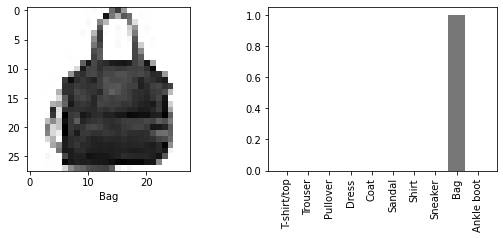

True
-------------------------------------------------


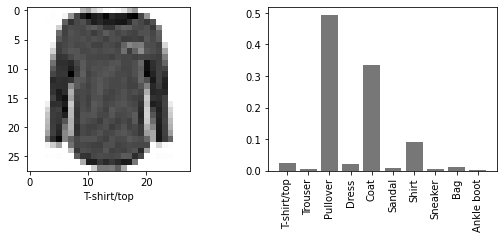

False
-------------------------------------------------


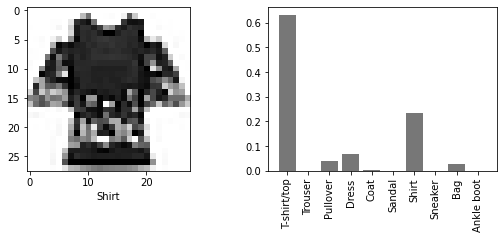

False
-------------------------------------------------


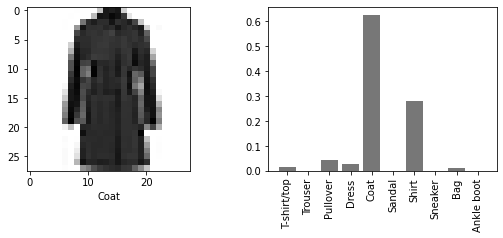

True
-------------------------------------------------


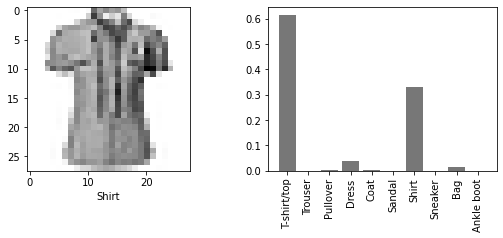

False
-------------------------------------------------


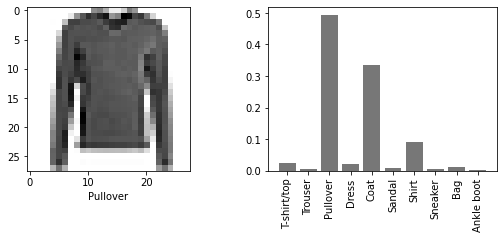

True
-------------------------------------------------


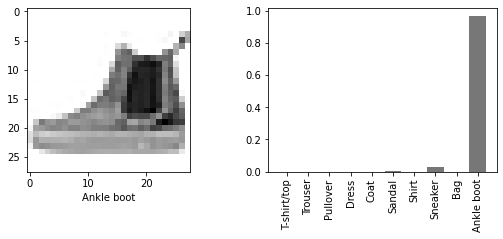

True
-------------------------------------------------


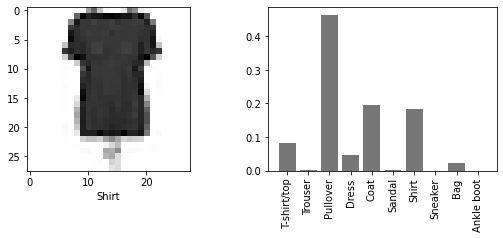

False
-------------------------------------------------


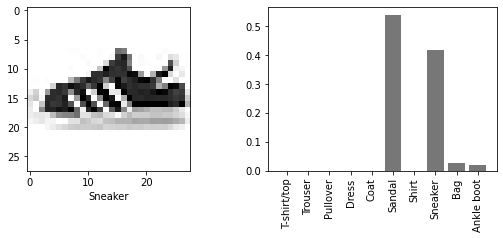

False
-------------------------------------------------


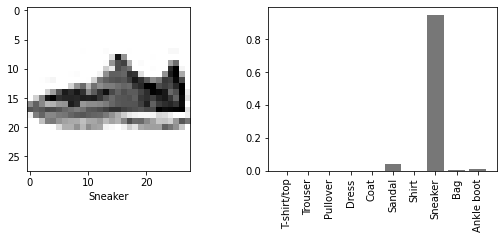

True
-------------------------------------------------


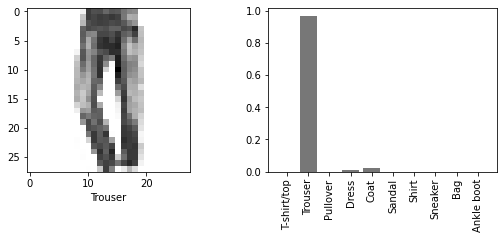

True
-------------------------------------------------


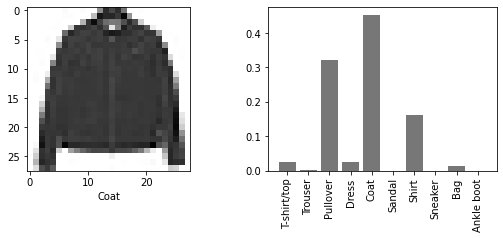

True
-------------------------------------------------


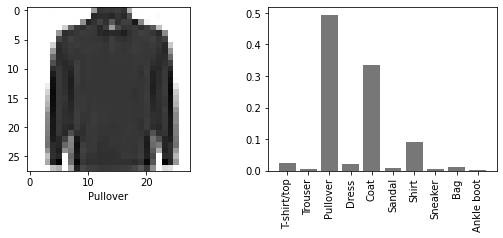

True
-------------------------------------------------


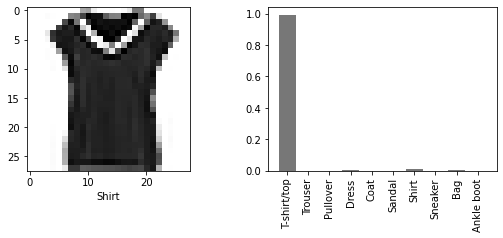

False
-------------------------------------------------


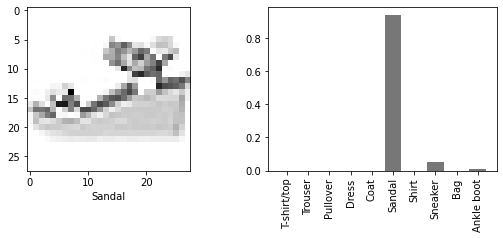

True
-------------------------------------------------


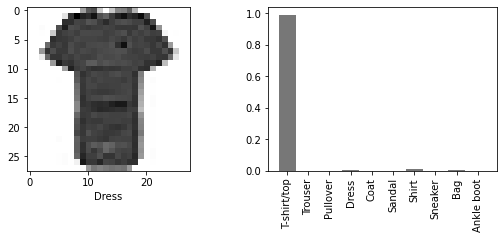

False
-------------------------------------------------


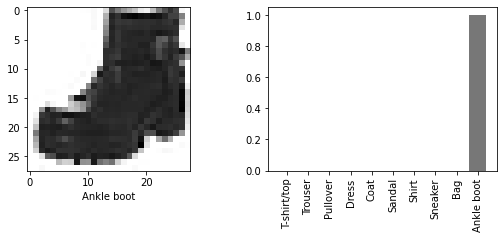

True
-------------------------------------------------


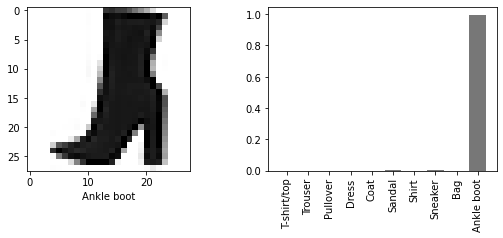

True
-------------------------------------------------


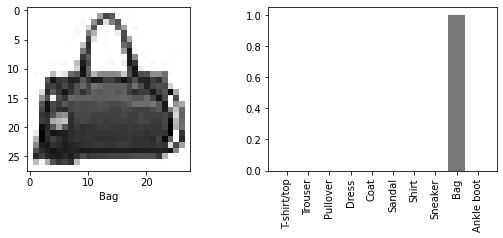

True
-------------------------------------------------


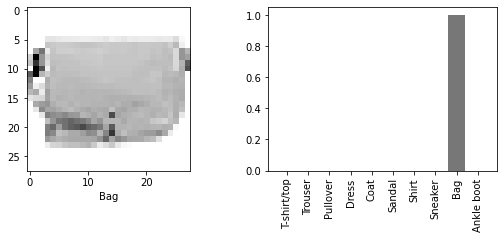

True
-------------------------------------------------


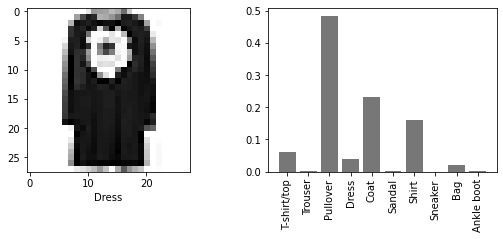

False
-------------------------------------------------


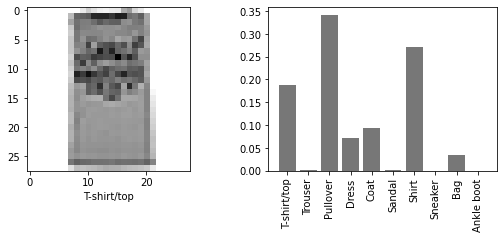

False
-------------------------------------------------


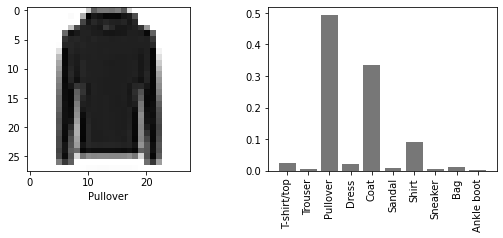

True
-------------------------------------------------


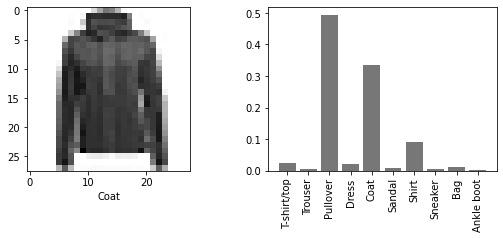

False
-------------------------------------------------


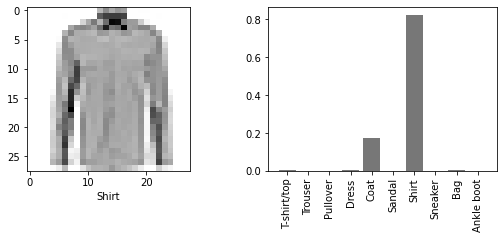

True
-------------------------------------------------


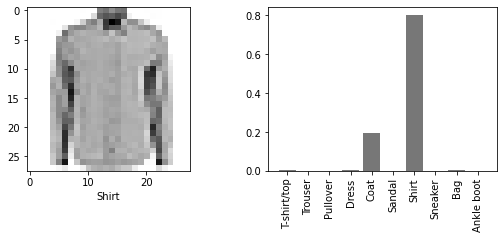

True
-------------------------------------------------


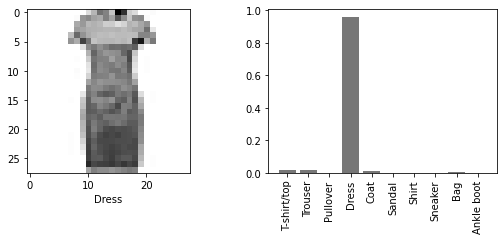

True
-------------------------------------------------


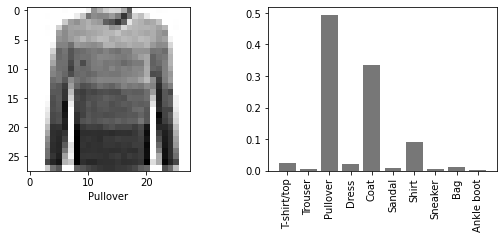

True
-------------------------------------------------


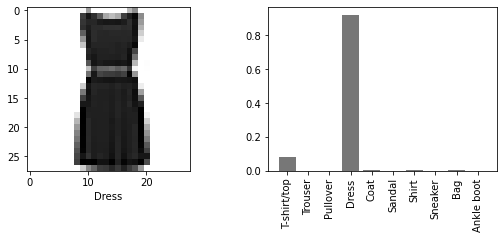

True
-------------------------------------------------


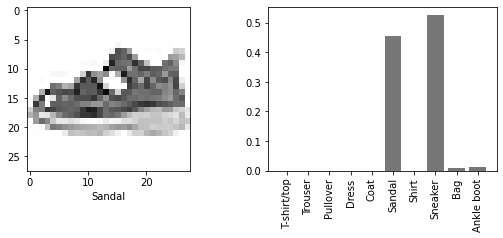

False
-------------------------------------------------


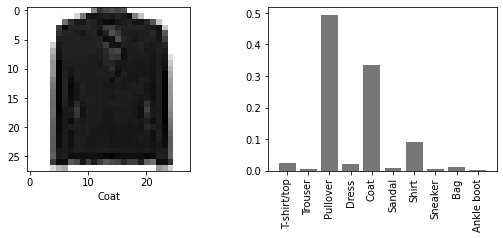

False
-------------------------------------------------


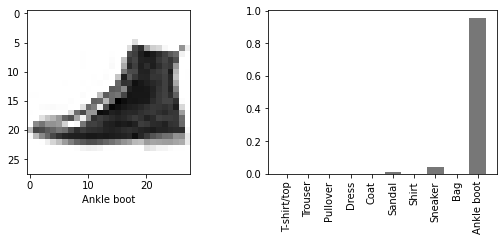

True
-------------------------------------------------


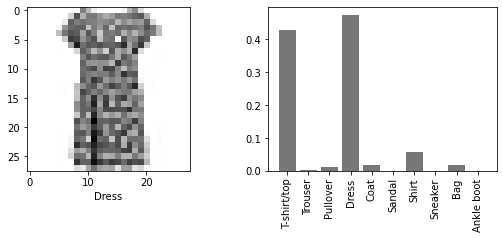

True
-------------------------------------------------


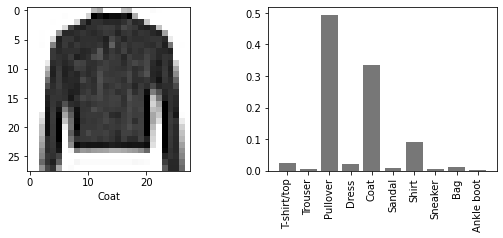

False
-------------------------------------------------


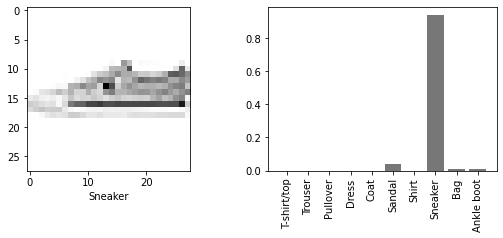

True
-------------------------------------------------


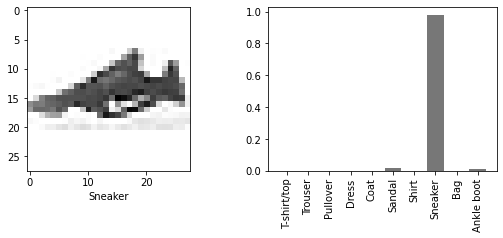

True
-------------------------------------------------


In [11]:
# Verify first 1000 predictions:
for i in range(1000):
  plt.figure(figsize = (9, 3))
  plt.subplot(1, 2, 1)
  plt.imshow(test_images[i], cmap = plt.cm.binary)
  plt.xlabel(label_names[test_labels[i]])
  plt.subplot(1, 2, 2)
  plt.bar(label_names, pred_probability[i], color = '#777777')
  plt.xticks(rotation = 90)
  plt.show()
  print(pred_labels[i] == test_labels[i])
  print('-------------------------------------------------')

In [12]:
# Show results. Which item is the hardest to recognize for model:
results = pd.DataFrame()
results['True label'] = test_labels
results['Predicted label'] = pred_labels
results['Prediction'] = test_labels == pred_labels

results.head(10)

,True label,Predicted label,Prediction
0,9,9,True
1,2,2,True
2,1,1,True
3,1,1,True
4,6,6,True
5,1,1,True
6,4,4,True
7,6,6,True
8,5,5,True
9,7,7,True


In [13]:
# Accuracy by label:
acc_p = []
for i in range(10):
  res = results[results['True label'] == i]
  acc = res[res["Prediction"] == True]['Prediction'].count() / res.shape[0]
  acc_p.append(acc)
  print(f'Accuracy for {label_names[i]} prediction is {acc}')

Accuracy for T-shirt/top prediction is 0.808
Accuracy for Trouser prediction is 0.934
Accuracy for Pullover prediction is 0.926
Accuracy for Dress prediction is 0.574
Accuracy for Coat prediction is 0.28
Accuracy for Sandal prediction is 0.923
Accuracy for Shirt prediction is 0.394
Accuracy for Sneaker prediction is 0.872
Accuracy for Bag prediction is 0.951
Accuracy for Ankle boot prediction is 0.975


In [14]:
px.bar(x = label_names, y = acc_p, title = 'Accuracy score depending of type of clothing')